In [1]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from torch.utils.tensorboard import SummaryWriter
import torchvision.transforms as T
import os

from DatasetCH import UpscaleDataset
from models import *
import Network

# Make dirs
mdir="./Model_unet/Test_1"
rdir="./Results_unet/Test_1"
os.makedirs(mdir, exist_ok=True)
os.makedirs(rdir, exist_ok=True)

# Define the tensorboard writer
writer = SummaryWriter("./Runs_unet/Test_1") # was runs_unet

In [2]:
import sys
sys.path.append('/home/mpyrina/Notebooks/ANEMOI/ClimateDiffuse/src/')
from DatasetCH import *
from TrainDiffusion import *
from TrainUnet import *

In [3]:
from Evaluation import *

### unet only

In [ ]:
# define the datasets
ifs_dir = '/s2s/mpyrina/ECMWF_MCH/Europe_eval/s2s_hind_2022/all/'
obs_dir = '/net/cfc/s2s_nobackup/mpyrina/TABSD_ifs_like/'

# Run training for small number of epochs 
num_epochs = 10
## Select hyperparameters of training
batch_size = 16
learning_rate = 1e-5 # try also 1e-5
accum = 4

dataset_train = UpscaleDataset(coarse_data_dir = ifs_dir, highres_data_dir = obs_dir,
year_start=2002, year_end=2012, month=815,  
constant_variables=None, constant_variables_filename=None)

dataset_test = UpscaleDataset(coarse_data_dir = ifs_dir, highres_data_dir = obs_dir,
year_start=2012, year_end=2015, month=815,  
constant_variables=None, constant_variables_filename=None)

dataloader_train = torch.utils.data.DataLoader(dataset_train, batch_size=batch_size, shuffle=True, num_workers=4)
dataloader_test = torch.utils.data.DataLoader(dataset_test, batch_size=batch_size, shuffle=True, num_workers=4)

# Define device
device =  'cuda' if torch.cuda.is_available() else 'cpu'

# define the ml model : 1, 1, : 1 input var, one output
unet_model = UNet((256, 128), 1, 1, label_dim=0, use_diffuse=False)
unet_model.to(device)


/tmp/ipykernel_26783/4068868327.py:2: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()
/home/mpyrina/.conda/envs/myenv_iacpy3_2023/lib/python3.11/site-packages/torch/amp/grad_scaler.py:132: UserWarning: torch.cuda.amp.GradScaler is enabled, but CUDA is not available.  Disabling.
  warnings.warn(
Train :: Epoch: 0:   0%|          | 1/317 [00:00<02:26,  2.15it/s]/home/mpyrina/Notebooks/ANEMOI/ClimateDiffuse/src/TrainUnet.py:44: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
/home/mpyrina/.conda/envs/myenv_iacpy3_2023/lib/python3.11/site-packages/torch/amp/autocast_mode.py:266: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn(


Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   1%|          | 2/317 [01:24<4:19:30, 49.43s/it, Loss: 69.5842]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   1%|          | 3/317 [02:46<5:36:20, 64.27s/it, Loss: 68.3048]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   1%|▏         | 4/317 [04:10<6:15:45, 72.03s/it, Loss: 68.6956]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   2%|▏         | 5/317 [05:40<6:48:38, 78.58s/it, Loss: 68.2764]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   2%|▏         | 6/317 [07:03<6:55:17, 80.12s/it, Loss: 65.9745]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   2%|▏         | 7/317 [08:25<6:56:35, 80.63s/it, Loss: 61.7222]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   3%|▎         | 8/317 [09:42<6:50:21, 79.68s/it, Loss: 67.7285]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   3%|▎         | 9/317 [11:03<6:51:04, 80.08s/it, Loss: 67.6386]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   3%|▎         | 10/317 [12:22<6:47:19, 79.61s/it, Loss: 50.0486]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   3%|▎         | 11/317 [13:45<6:52:04, 80.80s/it, Loss: 65.8667]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   4%|▍         | 12/317 [15:09<6:54:55, 81.62s/it, Loss: 55.5349]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   4%|▍         | 13/317 [16:35<7:01:02, 83.10s/it, Loss: 76.9248]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   4%|▍         | 14/317 [17:55<6:53:59, 81.98s/it, Loss: 73.7456]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   5%|▍         | 15/317 [19:14<6:48:54, 81.24s/it, Loss: 73.4831]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   5%|▌         | 16/317 [20:37<6:49:30, 81.63s/it, Loss: 66.2758]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   5%|▌         | 17/317 [22:02<6:53:30, 82.70s/it, Loss: 59.0725]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   6%|▌         | 18/317 [23:20<6:45:02, 81.28s/it, Loss: 65.7962]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   6%|▌         | 19/317 [24:39<6:40:43, 80.68s/it, Loss: 74.5435]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   6%|▋         | 20/317 [25:58<6:37:08, 80.23s/it, Loss: 75.0736]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   7%|▋         | 21/317 [27:22<6:41:14, 81.33s/it, Loss: 59.3613]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   7%|▋         | 22/317 [28:44<6:41:01, 81.56s/it, Loss: 64.1438]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   7%|▋         | 23/317 [30:07<6:40:55, 81.82s/it, Loss: 74.5053]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   8%|▊         | 24/317 [31:28<6:39:12, 81.75s/it, Loss: 67.6343]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   8%|▊         | 25/317 [32:49<6:36:23, 81.45s/it, Loss: 61.3998]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   8%|▊         | 26/317 [34:08<6:31:24, 80.70s/it, Loss: 62.0025]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   9%|▊         | 27/317 [35:30<6:32:35, 81.22s/it, Loss: 83.1093]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   9%|▉         | 28/317 [36:52<6:32:14, 81.44s/it, Loss: 76.5166]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   9%|▉         | 29/317 [38:15<6:32:43, 81.82s/it, Loss: 70.2561]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:   9%|▉         | 30/317 [39:32<6:24:27, 80.38s/it, Loss: 68.6880]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  10%|▉         | 31/317 [40:50<6:18:56, 79.50s/it, Loss: 71.7923]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  10%|█         | 32/317 [42:08<6:15:47, 79.11s/it, Loss: 63.0014]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  10%|█         | 33/317 [43:35<6:25:24, 81.43s/it, Loss: 72.8164]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  11%|█         | 34/317 [44:56<6:23:56, 81.40s/it, Loss: 68.3851]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  11%|█         | 35/317 [46:17<6:21:33, 81.18s/it, Loss: 67.0407]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  11%|█▏        | 36/317 [47:31<6:11:10, 79.25s/it, Loss: 72.9065]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  12%|█▏        | 37/317 [48:50<6:09:01, 79.08s/it, Loss: 62.2129]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  12%|█▏        | 38/317 [50:12<6:11:13, 79.83s/it, Loss: 68.6095]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  12%|█▏        | 39/317 [51:33<6:11:49, 80.25s/it, Loss: 62.0147]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  13%|█▎        | 40/317 [52:56<6:15:10, 81.27s/it, Loss: 65.9865]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  13%|█▎        | 41/317 [54:18<6:14:16, 81.37s/it, Loss: 64.7717]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  13%|█▎        | 42/317 [55:35<6:06:52, 80.05s/it, Loss: 77.9764]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  14%|█▎        | 43/317 [56:54<6:04:21, 79.78s/it, Loss: 88.4957]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  14%|█▍        | 44/317 [58:17<6:07:24, 80.75s/it, Loss: 64.4664]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  14%|█▍        | 45/317 [59:46<6:16:38, 83.08s/it, Loss: 82.4000]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  15%|█▍        | 46/317 [1:01:08<6:13:33, 82.71s/it, Loss: 70.4062]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  15%|█▍        | 47/317 [1:02:30<6:11:54, 82.65s/it, Loss: 80.5285]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  15%|█▌        | 48/317 [1:03:48<6:04:33, 81.31s/it, Loss: 62.8258]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  15%|█▌        | 49/317 [1:05:15<6:09:53, 82.81s/it, Loss: 76.0767]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  16%|█▌        | 50/317 [1:06:33<6:03:11, 81.62s/it, Loss: 83.5104]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  16%|█▌        | 51/317 [1:07:54<5:59:53, 81.18s/it, Loss: 72.9558]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  16%|█▋        | 52/317 [1:09:15<5:59:03, 81.29s/it, Loss: 84.6914]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  17%|█▋        | 53/317 [1:10:41<6:04:10, 82.77s/it, Loss: 72.8446]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  17%|█▋        | 54/317 [1:12:04<6:02:13, 82.64s/it, Loss: 59.5109]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  17%|█▋        | 55/317 [1:13:20<5:52:42, 80.77s/it, Loss: 75.8690]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  18%|█▊        | 56/317 [1:14:38<5:48:08, 80.03s/it, Loss: 65.5530]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  18%|█▊        | 57/317 [1:15:57<5:45:29, 79.73s/it, Loss: 64.7265]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  18%|█▊        | 58/317 [1:17:20<5:47:54, 80.60s/it, Loss: 58.5652]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  19%|█▊        | 59/317 [1:18:45<5:52:02, 81.87s/it, Loss: 52.8593]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  19%|█▉        | 60/317 [1:20:09<5:53:01, 82.42s/it, Loss: 76.1297]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  19%|█▉        | 61/317 [1:21:29<5:49:36, 81.94s/it, Loss: 73.6120]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  20%|█▉        | 62/317 [1:22:46<5:42:02, 80.48s/it, Loss: 59.5722]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  20%|█▉        | 63/317 [1:24:06<5:38:58, 80.07s/it, Loss: 60.2984]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  20%|██        | 64/317 [1:25:28<5:40:34, 80.77s/it, Loss: 66.2062]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  21%|██        | 65/317 [1:26:51<5:42:25, 81.53s/it, Loss: 60.4647]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  21%|██        | 66/317 [1:28:10<5:36:56, 80.54s/it, Loss: 56.2155]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  21%|██        | 67/317 [1:29:27<5:31:26, 79.55s/it, Loss: 81.4323]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  21%|██▏       | 68/317 [1:30:46<5:29:16, 79.34s/it, Loss: 70.0913]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  22%|██▏       | 69/317 [1:32:05<5:27:56, 79.34s/it, Loss: 81.1055]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  22%|██▏       | 70/317 [1:33:28<5:30:36, 80.31s/it, Loss: 59.5061]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  22%|██▏       | 71/317 [1:34:49<5:30:33, 80.62s/it, Loss: 60.3590]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  23%|██▎       | 72/317 [1:36:10<5:30:09, 80.85s/it, Loss: 55.5150]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  23%|██▎       | 73/317 [1:37:32<5:29:52, 81.12s/it, Loss: 77.4181]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  23%|██▎       | 74/317 [1:38:54<5:29:22, 81.33s/it, Loss: 57.4360]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  24%|██▎       | 75/317 [1:40:18<5:31:15, 82.13s/it, Loss: 81.5253]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  24%|██▍       | 76/317 [1:41:41<5:30:48, 82.36s/it, Loss: 68.6547]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  24%|██▍       | 77/317 [1:43:00<5:26:20, 81.59s/it, Loss: 63.1782]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  25%|██▍       | 78/317 [1:44:17<5:18:35, 79.98s/it, Loss: 64.8067]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  25%|██▍       | 79/317 [1:45:36<5:16:11, 79.71s/it, Loss: 67.1922]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  25%|██▌       | 80/317 [1:46:59<5:19:26, 80.87s/it, Loss: 64.9907]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  26%|██▌       | 81/317 [1:48:20<5:17:53, 80.82s/it, Loss: 72.8338]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  26%|██▌       | 82/317 [1:49:39<5:14:07, 80.20s/it, Loss: 67.8756]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  26%|██▌       | 83/317 [1:50:57<5:10:28, 79.61s/it, Loss: 51.2284]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  26%|██▋       | 84/317 [1:52:15<5:07:08, 79.09s/it, Loss: 65.9326]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  27%|██▋       | 85/317 [1:53:41<5:14:11, 81.26s/it, Loss: 61.1694]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  27%|██▋       | 86/317 [1:55:06<5:16:51, 82.30s/it, Loss: 57.3238]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  27%|██▋       | 87/317 [1:56:31<5:18:30, 83.09s/it, Loss: 75.3024]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  28%|██▊       | 88/317 [1:57:52<5:14:33, 82.42s/it, Loss: 60.3886]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  28%|██▊       | 89/317 [1:59:14<5:13:03, 82.39s/it, Loss: 60.3056]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  28%|██▊       | 90/317 [2:00:37<5:12:36, 82.63s/it, Loss: 66.6740]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  29%|██▊       | 91/317 [2:02:02<5:13:10, 83.14s/it, Loss: 62.4369]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  29%|██▉       | 92/317 [2:03:22<5:08:07, 82.17s/it, Loss: 81.0920]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  29%|██▉       | 93/317 [2:04:40<5:02:10, 80.94s/it, Loss: 64.9799]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  30%|██▉       | 94/317 [2:05:58<4:57:53, 80.15s/it, Loss: 62.4003]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  30%|██▉       | 95/317 [2:07:17<4:55:14, 79.80s/it, Loss: 77.3216]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  30%|███       | 96/317 [2:08:38<4:55:21, 80.19s/it, Loss: 77.2872]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  31%|███       | 97/317 [2:10:05<5:01:02, 82.10s/it, Loss: 75.1069]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  31%|███       | 98/317 [2:11:27<5:00:30, 82.33s/it, Loss: 77.0513]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  31%|███       | 99/317 [2:12:49<4:58:33, 82.17s/it, Loss: 71.1643]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  32%|███▏      | 100/317 [2:14:08<4:53:18, 81.10s/it, Loss: 58.5795]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  32%|███▏      | 101/317 [2:15:33<4:56:54, 82.47s/it, Loss: 70.7402]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  32%|███▏      | 102/317 [2:16:56<4:55:59, 82.60s/it, Loss: 64.6666]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  32%|███▏      | 103/317 [2:18:16<4:51:35, 81.76s/it, Loss: 43.1723]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  33%|███▎      | 104/317 [2:19:36<4:47:54, 81.10s/it, Loss: 57.1683]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  33%|███▎      | 105/317 [2:20:58<4:47:36, 81.40s/it, Loss: 68.5036]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  33%|███▎      | 106/317 [2:22:20<4:47:08, 81.65s/it, Loss: 70.6215]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  34%|███▍      | 107/317 [2:23:47<4:51:37, 83.32s/it, Loss: 69.6228]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  34%|███▍      | 108/317 [2:25:10<4:49:10, 83.02s/it, Loss: 75.5045]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  34%|███▍      | 109/317 [2:26:30<4:45:08, 82.25s/it, Loss: 66.1982]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  35%|███▍      | 110/317 [2:27:45<4:35:54, 79.97s/it, Loss: 76.9673]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  35%|███▌      | 111/317 [2:29:05<4:34:42, 80.01s/it, Loss: 65.4456]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  35%|███▌      | 112/317 [2:30:27<4:35:17, 80.57s/it, Loss: 56.2358]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  36%|███▌      | 113/317 [2:31:52<4:38:57, 82.05s/it, Loss: 67.8704]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  36%|███▌      | 114/317 [2:33:12<4:35:21, 81.38s/it, Loss: 66.2285]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  36%|███▋      | 115/317 [2:34:33<4:33:26, 81.22s/it, Loss: 72.4769]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  37%|███▋      | 116/317 [2:35:58<4:35:34, 82.26s/it, Loss: 75.1265]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  37%|███▋      | 117/317 [2:37:23<4:37:15, 83.18s/it, Loss: 58.9313]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  37%|███▋      | 118/317 [2:38:45<4:34:45, 82.84s/it, Loss: 81.1854]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  38%|███▊      | 119/317 [2:40:10<4:35:29, 83.48s/it, Loss: 66.7734]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  38%|███▊      | 120/317 [2:41:33<4:34:08, 83.49s/it, Loss: 58.1919]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  38%|███▊      | 121/317 [2:43:01<4:36:23, 84.61s/it, Loss: 70.5477]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  38%|███▊      | 122/317 [2:44:30<4:39:56, 86.14s/it, Loss: 67.0740]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  39%|███▉      | 123/317 [2:46:07<4:48:56, 89.37s/it, Loss: 55.0253]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  39%|███▉      | 124/317 [2:47:44<4:54:55, 91.69s/it, Loss: 74.2652]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  39%|███▉      | 125/317 [2:49:45<5:21:25, 100.44s/it, Loss: 69.9793]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  40%|███▉      | 126/317 [2:51:15<5:09:36, 97.26s/it, Loss: 58.3209] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  40%|████      | 127/317 [2:52:46<5:01:47, 95.30s/it, Loss: 55.3260]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  40%|████      | 128/317 [2:54:17<4:56:41, 94.19s/it, Loss: 71.9794]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  41%|████      | 129/317 [2:55:49<4:53:04, 93.53s/it, Loss: 71.5449]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  41%|████      | 130/317 [2:57:19<4:48:18, 92.50s/it, Loss: 63.3794]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  41%|████▏     | 131/317 [2:58:53<4:47:58, 92.89s/it, Loss: 64.4354]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  42%|████▏     | 132/317 [3:00:29<4:49:15, 93.82s/it, Loss: 66.4112]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  42%|████▏     | 133/317 [3:02:05<4:49:08, 94.28s/it, Loss: 79.9767]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  42%|████▏     | 134/317 [3:03:35<4:43:59, 93.11s/it, Loss: 81.8136]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  43%|████▎     | 135/317 [3:05:11<4:45:08, 94.00s/it, Loss: 61.9397]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  43%|████▎     | 136/317 [3:06:43<4:41:55, 93.46s/it, Loss: 57.2668]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  43%|████▎     | 137/317 [3:08:21<4:43:48, 94.60s/it, Loss: 72.0491]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  44%|████▎     | 138/317 [3:10:00<4:46:12, 95.94s/it, Loss: 57.2507]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  44%|████▍     | 139/317 [3:11:34<4:43:11, 95.46s/it, Loss: 69.3265]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  44%|████▍     | 140/317 [3:13:07<4:39:13, 94.65s/it, Loss: 47.5339]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  44%|████▍     | 141/317 [3:14:42<4:38:34, 94.97s/it, Loss: 64.4749]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  45%|████▍     | 142/317 [3:16:18<4:37:55, 95.29s/it, Loss: 73.5103]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  45%|████▌     | 143/317 [3:18:00<4:41:52, 97.20s/it, Loss: 65.1378]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  45%|████▌     | 144/317 [3:19:38<4:40:33, 97.30s/it, Loss: 60.4042]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  46%|████▌     | 145/317 [3:21:15<4:39:21, 97.45s/it, Loss: 65.1218]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  46%|████▌     | 146/317 [3:22:51<4:36:14, 96.93s/it, Loss: 98.3023]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  46%|████▋     | 147/317 [3:24:31<4:37:13, 97.84s/it, Loss: 70.5702]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  47%|████▋     | 148/317 [3:26:08<4:34:47, 97.56s/it, Loss: 75.3532]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  47%|████▋     | 149/317 [3:27:45<4:32:57, 97.48s/it, Loss: 63.2697]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  47%|████▋     | 150/317 [3:29:31<4:38:17, 99.99s/it, Loss: 74.4317]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  48%|████▊     | 151/317 [3:31:32<4:53:43, 106.17s/it, Loss: 59.0135]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  48%|████▊     | 152/317 [3:33:32<5:03:14, 110.27s/it, Loss: 78.5069]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  48%|████▊     | 153/317 [3:35:42<5:17:29, 116.16s/it, Loss: 61.9446]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  49%|████▊     | 154/317 [3:37:43<5:20:11, 117.86s/it, Loss: 75.1371]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  49%|████▉     | 155/317 [3:40:22<5:51:30, 130.19s/it, Loss: 52.5903]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  49%|████▉     | 156/317 [3:43:01<6:12:34, 138.85s/it, Loss: 85.2827]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  50%|████▉     | 157/317 [3:45:49<6:33:33, 147.59s/it, Loss: 61.7382]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  50%|████▉     | 158/317 [3:48:22<6:34:55, 149.03s/it, Loss: 59.6559]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  50%|█████     | 159/317 [3:51:04<6:42:37, 152.90s/it, Loss: 69.5299]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  50%|█████     | 160/317 [3:53:46<6:47:31, 155.74s/it, Loss: 71.1455]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  51%|█████     | 161/317 [3:56:34<6:54:35, 159.46s/it, Loss: 64.1839]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  51%|█████     | 162/317 [3:59:11<6:49:57, 158.69s/it, Loss: 67.4485]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  51%|█████▏    | 163/317 [4:01:58<6:53:20, 161.04s/it, Loss: 86.3928]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  52%|█████▏    | 164/317 [4:04:42<6:52:54, 161.92s/it, Loss: 71.9307]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  52%|█████▏    | 165/317 [4:07:28<6:53:44, 163.32s/it, Loss: 60.2153]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  52%|█████▏    | 166/317 [4:10:11<6:50:45, 163.21s/it, Loss: 81.3911]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  53%|█████▎    | 167/317 [4:13:00<6:52:35, 165.04s/it, Loss: 57.0155]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  53%|█████▎    | 168/317 [4:15:45<6:49:14, 164.80s/it, Loss: 69.2548]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  53%|█████▎    | 169/317 [4:18:31<6:47:49, 165.34s/it, Loss: 73.2574]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  54%|█████▎    | 170/317 [4:21:10<6:40:18, 163.39s/it, Loss: 48.1607]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  54%|█████▍    | 171/317 [4:24:12<6:50:51, 168.84s/it, Loss: 68.4787]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  54%|█████▍    | 172/317 [4:26:44<6:36:01, 163.88s/it, Loss: 67.8389]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  55%|█████▍    | 173/317 [4:29:32<6:36:16, 165.11s/it, Loss: 74.5743]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  55%|█████▍    | 174/317 [4:32:19<6:34:58, 165.72s/it, Loss: 75.9541]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  55%|█████▌    | 175/317 [4:34:53<6:23:57, 162.24s/it, Loss: 64.2154]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  56%|█████▌    | 176/317 [4:37:08<6:02:07, 154.10s/it, Loss: 67.7569]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  56%|█████▌    | 177/317 [4:39:43<5:59:50, 154.21s/it, Loss: 60.6977]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  56%|█████▌    | 178/317 [4:42:10<5:52:22, 152.10s/it, Loss: 72.9845]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  56%|█████▋    | 179/317 [4:44:42<5:49:49, 152.10s/it, Loss: 48.2660]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  57%|█████▋    | 180/317 [4:47:14<5:47:02, 151.99s/it, Loss: 62.8591]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  57%|█████▋    | 181/317 [4:49:53<5:49:15, 154.09s/it, Loss: 46.2186]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  57%|█████▋    | 182/317 [4:52:27<5:46:40, 154.08s/it, Loss: 66.3855]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  58%|█████▊    | 183/317 [4:55:04<5:46:19, 155.07s/it, Loss: 66.3729]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  58%|█████▊    | 184/317 [4:57:38<5:43:09, 154.81s/it, Loss: 68.5853]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  58%|█████▊    | 185/317 [5:00:30<5:51:39, 159.85s/it, Loss: 61.4666]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  59%|█████▊    | 186/317 [5:03:09<5:48:10, 159.47s/it, Loss: 59.9141]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  59%|█████▉    | 187/317 [5:05:44<5:42:41, 158.16s/it, Loss: 69.2108]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  59%|█████▉    | 188/317 [5:08:21<5:39:19, 157.82s/it, Loss: 74.5797]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  60%|█████▉    | 189/317 [5:11:11<5:44:28, 161.47s/it, Loss: 67.9537]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  60%|█████▉    | 190/317 [5:13:49<5:39:31, 160.40s/it, Loss: 64.9607]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  60%|██████    | 191/317 [5:16:33<5:39:09, 161.50s/it, Loss: 75.0632]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  61%|██████    | 192/317 [5:19:16<5:37:25, 161.96s/it, Loss: 54.1618]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  61%|██████    | 193/317 [5:22:08<5:41:16, 165.14s/it, Loss: 64.5995]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  61%|██████    | 194/317 [5:24:51<5:36:46, 164.28s/it, Loss: 61.7899]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  62%|██████▏   | 195/317 [5:27:36<5:34:36, 164.56s/it, Loss: 62.9242]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  62%|██████▏   | 196/317 [5:30:07<5:23:48, 160.57s/it, Loss: 86.0964]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  62%|██████▏   | 197/317 [5:32:41<5:17:08, 158.57s/it, Loss: 69.3348]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  62%|██████▏   | 198/317 [5:35:11<5:09:24, 156.01s/it, Loss: 60.2223]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  63%|██████▎   | 199/317 [5:37:48<5:07:36, 156.41s/it, Loss: 68.1928]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  63%|██████▎   | 200/317 [5:40:22<5:03:26, 155.61s/it, Loss: 53.6498]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  63%|██████▎   | 201/317 [5:43:03<5:03:50, 157.16s/it, Loss: 65.3617]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  64%|██████▎   | 202/317 [5:45:39<5:00:31, 156.80s/it, Loss: 62.4984]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  64%|██████▍   | 203/317 [5:48:12<4:56:06, 155.84s/it, Loss: 69.1981]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  64%|██████▍   | 204/317 [5:50:41<4:49:32, 153.74s/it, Loss: 67.0315]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  65%|██████▍   | 205/317 [5:53:20<4:49:48, 155.25s/it, Loss: 59.1747]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  65%|██████▍   | 206/317 [5:55:49<4:43:46, 153.39s/it, Loss: 61.9303]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  65%|██████▌   | 207/317 [5:58:21<4:40:37, 153.06s/it, Loss: 58.4665]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  66%|██████▌   | 208/317 [6:00:56<4:38:42, 153.42s/it, Loss: 64.5152]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  66%|██████▌   | 209/317 [6:03:27<4:35:04, 152.82s/it, Loss: 71.6028]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  66%|██████▌   | 210/317 [6:06:01<4:33:01, 153.10s/it, Loss: 65.5733]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  67%|██████▋   | 211/317 [6:08:38<4:32:37, 154.32s/it, Loss: 71.6520]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  67%|██████▋   | 212/317 [6:11:09<4:28:22, 153.36s/it, Loss: 53.6339]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  67%|██████▋   | 213/317 [6:13:46<4:27:42, 154.44s/it, Loss: 57.1069]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  68%|██████▊   | 214/317 [6:16:22<4:25:43, 154.79s/it, Loss: 70.7531]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  68%|██████▊   | 215/317 [6:18:57<4:23:14, 154.85s/it, Loss: 60.0467]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  68%|██████▊   | 216/317 [6:21:28<4:18:52, 153.79s/it, Loss: 61.9887]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  68%|██████▊   | 217/317 [6:24:09<4:20:00, 156.00s/it, Loss: 78.6357]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  69%|██████▉   | 218/317 [6:26:37<4:13:14, 153.48s/it, Loss: 70.4094]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  69%|██████▉   | 219/317 [6:29:08<4:09:47, 152.93s/it, Loss: 63.0081]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  69%|██████▉   | 220/317 [6:31:35<4:04:19, 151.13s/it, Loss: 65.4065]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  70%|██████▉   | 221/317 [6:34:19<4:07:38, 154.78s/it, Loss: 76.2720]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  70%|███████   | 222/317 [6:36:44<4:00:48, 152.09s/it, Loss: 62.0419]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  70%|███████   | 223/317 [6:39:16<3:57:56, 151.88s/it, Loss: 67.1772]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  71%|███████   | 224/317 [6:41:21<3:43:07, 143.95s/it, Loss: 75.1457]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  71%|███████   | 225/317 [6:43:16<3:27:27, 135.30s/it, Loss: 61.4306]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  71%|███████▏  | 226/317 [6:45:04<3:12:43, 127.08s/it, Loss: 59.9294]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  72%|███████▏  | 227/317 [6:47:07<3:08:29, 125.66s/it, Loss: 57.0054]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  72%|███████▏  | 228/317 [6:49:07<3:04:06, 124.12s/it, Loss: 72.6493]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  72%|███████▏  | 229/317 [6:50:59<2:56:30, 120.35s/it, Loss: 64.4749]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  73%|███████▎  | 230/317 [6:52:47<2:49:06, 116.63s/it, Loss: 58.3008]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  73%|███████▎  | 231/317 [6:54:36<2:43:51, 114.32s/it, Loss: 70.1931]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  73%|███████▎  | 232/317 [6:56:25<2:39:57, 112.91s/it, Loss: 58.7591]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  74%|███████▎  | 233/317 [6:58:16<2:37:23, 112.42s/it, Loss: 73.6909]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  74%|███████▍  | 234/317 [7:00:07<2:34:35, 111.75s/it, Loss: 69.4432]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  74%|███████▍  | 235/317 [7:01:58<2:32:33, 111.63s/it, Loss: 52.8531]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  74%|███████▍  | 236/317 [7:03:47<2:29:49, 110.99s/it, Loss: 53.6920]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  75%|███████▍  | 237/317 [7:05:39<2:28:16, 111.21s/it, Loss: 55.3046]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  75%|███████▌  | 238/317 [7:07:27<2:24:59, 110.11s/it, Loss: 56.7478]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  75%|███████▌  | 239/317 [7:09:18<2:23:36, 110.47s/it, Loss: 65.9601]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  76%|███████▌  | 240/317 [7:11:14<2:24:00, 112.21s/it, Loss: 65.4974]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  76%|███████▌  | 241/317 [7:13:06<2:21:44, 111.91s/it, Loss: 78.1810]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  76%|███████▋  | 242/317 [7:14:55<2:18:56, 111.16s/it, Loss: 57.6553]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  77%|███████▋  | 243/317 [7:16:47<2:17:30, 111.49s/it, Loss: 56.1166]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  77%|███████▋  | 244/317 [7:18:36<2:14:41, 110.71s/it, Loss: 64.4714]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  77%|███████▋  | 245/317 [7:20:34<2:15:18, 112.76s/it, Loss: 65.2075]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  78%|███████▊  | 246/317 [7:22:32<2:15:26, 114.46s/it, Loss: 61.8992]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  78%|███████▊  | 247/317 [7:24:24<2:12:31, 113.59s/it, Loss: 62.6483]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  78%|███████▊  | 248/317 [7:26:15<2:09:57, 113.00s/it, Loss: 53.6819]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  79%|███████▊  | 249/317 [7:28:10<2:08:43, 113.59s/it, Loss: 65.2128]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  79%|███████▉  | 250/317 [7:29:56<2:04:09, 111.18s/it, Loss: 58.6328]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  79%|███████▉  | 251/317 [7:31:52<2:04:01, 112.74s/it, Loss: 64.4741]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  79%|███████▉  | 252/317 [7:33:41<2:00:56, 111.64s/it, Loss: 75.2082]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  80%|███████▉  | 253/317 [7:35:32<1:58:50, 111.41s/it, Loss: 66.8966]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  80%|████████  | 254/317 [7:37:17<1:55:04, 109.60s/it, Loss: 73.6899]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  80%|████████  | 255/317 [7:39:14<1:55:20, 111.61s/it, Loss: 55.2405]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  81%|████████  | 256/317 [7:41:01<1:52:00, 110.17s/it, Loss: 66.2118]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  81%|████████  | 257/317 [7:42:46<1:48:52, 108.88s/it, Loss: 70.7457]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  81%|████████▏ | 258/317 [7:44:33<1:46:29, 108.29s/it, Loss: 69.2748]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  82%|████████▏ | 259/317 [7:46:27<1:46:08, 109.80s/it, Loss: 51.6480]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  82%|████████▏ | 260/317 [7:48:13<1:43:15, 108.69s/it, Loss: 64.4352]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  82%|████████▏ | 261/317 [7:50:04<1:42:00, 109.30s/it, Loss: 52.0788]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  83%|████████▎ | 262/317 [7:51:48<1:38:59, 107.99s/it, Loss: 63.1859]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  83%|████████▎ | 263/317 [7:53:34<1:36:29, 107.21s/it, Loss: 59.7650]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  83%|████████▎ | 264/317 [7:55:24<1:35:24, 108.02s/it, Loss: 65.0248]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  84%|████████▎ | 265/317 [7:57:12<1:33:37, 108.02s/it, Loss: 63.1331]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  84%|████████▍ | 266/317 [7:58:59<1:31:34, 107.73s/it, Loss: 70.7295]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  84%|████████▍ | 267/317 [8:00:51<1:30:55, 109.11s/it, Loss: 60.1709]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  85%|████████▍ | 268/317 [8:02:44<1:30:08, 110.38s/it, Loss: 74.5576]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  85%|████████▍ | 269/317 [8:04:31<1:27:19, 109.16s/it, Loss: 59.8707]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  85%|████████▌ | 270/317 [8:06:13<1:23:46, 106.94s/it, Loss: 60.7319]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  85%|████████▌ | 271/317 [8:07:52<1:20:16, 104.71s/it, Loss: 63.1990]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  86%|████████▌ | 272/317 [8:09:36<1:18:14, 104.33s/it, Loss: 62.8147]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  86%|████████▌ | 273/317 [8:11:24<1:17:19, 105.45s/it, Loss: 64.1370]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  86%|████████▋ | 274/317 [8:13:10<1:15:43, 105.66s/it, Loss: 67.4853]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  87%|████████▋ | 275/317 [8:14:55<1:13:51, 105.50s/it, Loss: 58.5597]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  87%|████████▋ | 276/317 [8:16:43<1:12:41, 106.37s/it, Loss: 63.3770]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  87%|████████▋ | 277/317 [8:18:12<1:07:17, 100.94s/it, Loss: 60.7394]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  88%|████████▊ | 278/317 [8:19:36<1:02:20, 95.92s/it, Loss: 63.9262] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  88%|████████▊ | 279/317 [8:21:19<1:02:13, 98.25s/it, Loss: 60.6445]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  88%|████████▊ | 280/317 [8:23:05<1:02:01, 100.59s/it, Loss: 62.4935]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  89%|████████▊ | 281/317 [8:24:53<1:01:32, 102.58s/it, Loss: 62.6121]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  89%|████████▉ | 282/317 [8:26:31<59:06, 101.34s/it, Loss: 68.4508]  

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  89%|████████▉ | 283/317 [8:28:50<1:03:50, 112.67s/it, Loss: 64.8162]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  90%|████████▉ | 284/317 [8:31:13<1:06:54, 121.65s/it, Loss: 70.5815]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  90%|████████▉ | 285/317 [8:33:48<1:10:10, 131.58s/it, Loss: 75.8805]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  90%|█████████ | 286/317 [8:36:12<1:10:00, 135.50s/it, Loss: 70.1236]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  91%|█████████ | 287/317 [8:38:34<1:08:41, 137.40s/it, Loss: 62.2885]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  91%|█████████ | 288/317 [8:41:03<1:08:04, 140.85s/it, Loss: 67.4354]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  91%|█████████ | 289/317 [8:43:38<1:07:41, 145.04s/it, Loss: 62.2467]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  91%|█████████▏| 290/317 [8:46:37<1:09:53, 155.30s/it, Loss: 70.9762]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  92%|█████████▏| 291/317 [8:48:58<1:05:23, 150.92s/it, Loss: 64.9703]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  92%|█████████▏| 292/317 [8:51:22<1:02:04, 149.00s/it, Loss: 66.9527]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  92%|█████████▏| 293/317 [8:53:51<59:34, 148.93s/it, Loss: 61.0102]  

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  93%|█████████▎| 294/317 [8:56:11<56:02, 146.18s/it, Loss: 62.5924]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  93%|█████████▎| 295/317 [8:58:32<53:04, 144.75s/it, Loss: 59.9558]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  93%|█████████▎| 296/317 [9:00:46<49:32, 141.55s/it, Loss: 67.2944]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  94%|█████████▎| 297/317 [9:03:10<47:22, 142.11s/it, Loss: 68.8969]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  94%|█████████▍| 298/317 [9:05:25<44:19, 139.98s/it, Loss: 67.5434]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  94%|█████████▍| 299/317 [9:07:42<41:46, 139.27s/it, Loss: 74.9381]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  95%|█████████▍| 300/317 [9:10:05<39:44, 140.27s/it, Loss: 82.4159]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  95%|█████████▍| 301/317 [9:12:33<38:03, 142.72s/it, Loss: 68.2916]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  95%|█████████▌| 302/317 [9:14:51<35:18, 141.23s/it, Loss: 54.7483]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  96%|█████████▌| 303/317 [9:17:16<33:12, 142.31s/it, Loss: 75.6816]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  96%|█████████▌| 304/317 [9:19:41<31:01, 143.22s/it, Loss: 78.5021]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  96%|█████████▌| 305/317 [9:22:15<29:18, 146.52s/it, Loss: 58.4762]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  97%|█████████▋| 306/317 [9:24:41<26:48, 146.23s/it, Loss: 67.7784]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  97%|█████████▋| 307/317 [9:27:06<24:19, 145.96s/it, Loss: 65.3739]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  97%|█████████▋| 308/317 [9:29:33<21:55, 146.19s/it, Loss: 60.3302]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  97%|█████████▋| 309/317 [9:32:09<19:52, 149.09s/it, Loss: 54.8545]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  98%|█████████▊| 310/317 [9:34:34<17:15, 147.86s/it, Loss: 45.2669]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  98%|█████████▊| 311/317 [9:37:09<14:59, 149.99s/it, Loss: 59.9963]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  98%|█████████▊| 312/317 [9:39:40<12:31, 150.36s/it, Loss: 61.1867]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  99%|█████████▊| 313/317 [9:42:13<10:04, 151.20s/it, Loss: 59.3307]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  99%|█████████▉| 314/317 [9:44:36<07:26, 148.77s/it, Loss: 52.4522]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0:  99%|█████████▉| 315/317 [9:47:04<04:56, 148.44s/it, Loss: 70.0881]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0: 100%|█████████▉| 316/317 [9:49:34<02:28, 148.80s/it, Loss: 65.0908]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 0: 100%|██████████| 317/317 [9:52:07<00:00, 150.06s/it, Loss: 71.3670]

Batch input shape: torch.Size([4, 1, 128, 256])
Batch output shape: torch.Size([4, 1, 128, 256])
Input shape to conv0: torch.Size([4, 128, 128, 256])
Input shape to conv0: torch.Size([4, 128, 128, 256])
Input shape to conv0: torch.Size([4, 128, 128, 256])
Input shape to conv0: torch.Size([4, 128, 64, 128])
Input shape to conv0: torch.Size([4, 256, 64, 128])
Input shape to conv0: torch.Size([4, 256, 64, 128])
Input shape to conv0: torch.Size([4, 256, 32, 64])
Input shape to conv0: torch.Size([4, 512, 32, 64])
Input shape to conv0: torch.Size([4, 512, 32, 64])
Input shape to conv0: torch.Size([4, 512, 16, 32])
Input shape to conv0: torch.Size([4, 1024, 16, 32])
Input shape to conv0: torch.Size([4, 1024, 16, 32])
Input shape to conv0: torch.Size([4, 1024, 16, 32])
x.shape: torch.Size([4, 1024, 16, 32]), skips[-1].shape: torch.Size([4, 1024, 16, 32])
Input shape to conv0: torch.Size([4, 2048, 16, 32])
x.shape: torch.Size([4, 1024, 16, 32]), skips[-1].shape: torch.Size([4, 1024, 16, 32])
In

Train :: Epoch: 0: 100%|██████████| 317/317 [9:53:00<00:00, 112.24s/it, Loss: 66.3141]


Model saved to ./Model_unet/Test_1/unet_model_epoch_0.pt
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: to

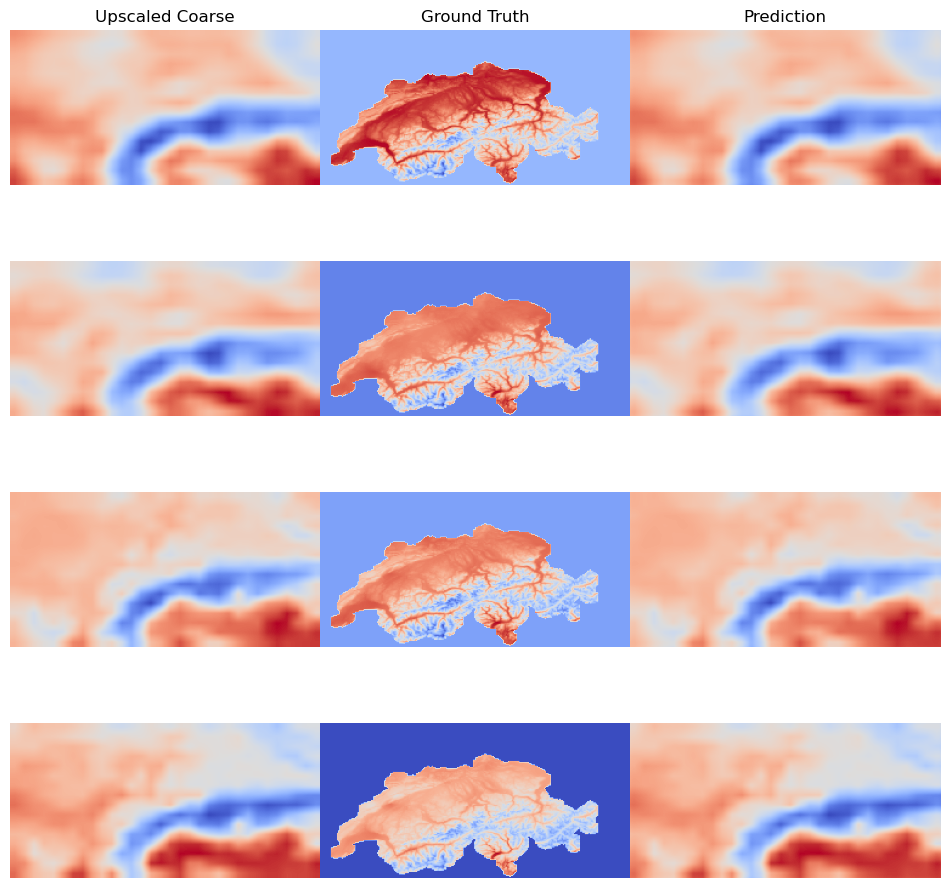

Train :: Epoch: 1:   0%|          | 1/317 [00:01<07:16,  1.38s/it]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   1%|          | 2/317 [02:36<8:02:03, 91.82s/it, Loss: 69.8041]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   1%|          | 3/317 [04:59<10:02:16, 115.08s/it, Loss: 64.4610]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   1%|▏         | 4/317 [07:21<10:56:17, 125.81s/it, Loss: 59.2458]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   2%|▏         | 5/317 [09:49<11:34:55, 133.64s/it, Loss: 65.7406]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   2%|▏         | 6/317 [12:19<12:02:56, 139.47s/it, Loss: 57.0754]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   2%|▏         | 7/317 [14:43<12:08:23, 140.98s/it, Loss: 55.3029]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   3%|▎         | 8/317 [17:13<12:19:38, 143.62s/it, Loss: 72.6657]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   3%|▎         | 9/317 [19:42<12:26:30, 145.42s/it, Loss: 66.6547]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   3%|▎         | 10/317 [22:04<12:18:46, 144.39s/it, Loss: 68.4012]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   3%|▎         | 11/317 [24:25<12:10:49, 143.30s/it, Loss: 64.0055]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   4%|▍         | 12/317 [26:47<12:06:19, 142.88s/it, Loss: 72.7204]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   4%|▍         | 13/317 [29:21<12:20:33, 146.16s/it, Loss: 66.7589]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   4%|▍         | 14/317 [31:43<12:12:35, 145.07s/it, Loss: 60.8939]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   5%|▍         | 15/317 [34:05<12:05:42, 144.18s/it, Loss: 54.4570]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   5%|▌         | 16/317 [36:23<11:53:50, 142.29s/it, Loss: 65.9187]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   5%|▌         | 17/317 [38:56<12:07:10, 145.44s/it, Loss: 64.0099]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   6%|▌         | 18/317 [41:17<11:58:45, 144.23s/it, Loss: 78.7301]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   6%|▌         | 19/317 [43:40<11:54:07, 143.79s/it, Loss: 81.3610]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   6%|▋         | 20/317 [45:59<11:45:06, 142.44s/it, Loss: 63.1144]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   7%|▋         | 21/317 [48:31<11:56:40, 145.27s/it, Loss: 61.0476]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   7%|▋         | 22/317 [50:58<11:55:58, 145.62s/it, Loss: 59.8622]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   7%|▋         | 23/317 [53:20<11:48:07, 144.52s/it, Loss: 62.9018]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   8%|▊         | 24/317 [55:42<11:41:56, 143.74s/it, Loss: 70.6540]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   8%|▊         | 25/317 [58:06<11:39:53, 143.81s/it, Loss: 62.8235]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   8%|▊         | 26/317 [1:00:27<11:33:24, 142.97s/it, Loss: 42.8722]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   9%|▊         | 27/317 [1:02:52<11:34:44, 143.74s/it, Loss: 62.2619]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   9%|▉         | 28/317 [1:05:07<11:19:19, 141.04s/it, Loss: 49.2816]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   9%|▉         | 29/317 [1:07:34<11:26:25, 143.01s/it, Loss: 55.0599]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:   9%|▉         | 30/317 [1:09:55<11:20:34, 142.28s/it, Loss: 53.6653]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  10%|▉         | 31/317 [1:12:18<11:19:15, 142.50s/it, Loss: 58.5020]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  10%|█         | 32/317 [1:14:35<11:09:39, 140.98s/it, Loss: 58.6555]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  10%|█         | 33/317 [1:17:09<11:25:18, 144.78s/it, Loss: 69.8630]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  11%|█         | 34/317 [1:19:24<11:08:39, 141.77s/it, Loss: 81.2747]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  11%|█         | 35/317 [1:21:46<11:06:52, 141.89s/it, Loss: 50.2498]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  11%|█▏        | 36/317 [1:24:12<11:09:55, 143.04s/it, Loss: 59.9238]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  12%|█▏        | 37/317 [1:26:40<11:15:22, 144.72s/it, Loss: 57.4478]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  12%|█▏        | 38/317 [1:29:10<11:19:39, 146.16s/it, Loss: 65.0189]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  12%|█▏        | 39/317 [1:31:32<11:11:21, 144.90s/it, Loss: 49.0409]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  13%|█▎        | 40/317 [1:33:45<10:52:11, 141.27s/it, Loss: 68.8267]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  13%|█▎        | 41/317 [1:36:13<10:59:31, 143.37s/it, Loss: 69.7316]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  13%|█▎        | 42/317 [1:38:31<10:50:00, 141.82s/it, Loss: 47.9957]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  14%|█▎        | 43/317 [1:40:53<10:47:43, 141.84s/it, Loss: 53.6296]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  14%|█▍        | 44/317 [1:43:20<10:52:31, 143.41s/it, Loss: 57.9378]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  14%|█▍        | 45/317 [1:45:54<11:04:35, 146.60s/it, Loss: 54.0523]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  15%|█▍        | 46/317 [1:48:08<10:45:16, 142.87s/it, Loss: 72.4006]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  15%|█▍        | 47/317 [1:50:30<10:41:22, 142.53s/it, Loss: 65.0135]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  15%|█▌        | 48/317 [1:52:51<10:36:38, 142.00s/it, Loss: 67.8348]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  15%|█▌        | 49/317 [1:55:19<10:43:06, 143.98s/it, Loss: 50.9189]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  16%|█▌        | 50/317 [1:57:42<10:39:08, 143.63s/it, Loss: 63.9239]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  16%|█▌        | 51/317 [2:00:05<10:35:22, 143.32s/it, Loss: 71.6119]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  16%|█▋        | 52/317 [2:02:25<10:28:50, 142.38s/it, Loss: 62.5289]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  17%|█▋        | 53/317 [2:04:53<10:34:06, 144.12s/it, Loss: 73.9017]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  17%|█▋        | 54/317 [2:07:14<10:27:35, 143.18s/it, Loss: 58.3836]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  17%|█▋        | 55/317 [2:09:33<10:19:30, 141.87s/it, Loss: 77.3490]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  18%|█▊        | 56/317 [2:11:54<10:16:05, 141.63s/it, Loss: 67.1799]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  18%|█▊        | 57/317 [2:14:24<10:24:02, 144.01s/it, Loss: 68.2071]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  18%|█▊        | 58/317 [2:16:47<10:20:21, 143.71s/it, Loss: 67.2830]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  19%|█▊        | 59/317 [2:19:07<10:12:59, 142.56s/it, Loss: 58.4957]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  19%|█▉        | 60/317 [2:21:22<10:01:37, 140.46s/it, Loss: 58.0176]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  19%|█▉        | 61/317 [2:23:54<10:13:51, 143.87s/it, Loss: 74.8322]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  20%|█▉        | 62/317 [2:26:18<10:12:13, 144.05s/it, Loss: 63.7833]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  20%|█▉        | 63/317 [2:28:37<10:02:42, 142.37s/it, Loss: 63.7484]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  20%|██        | 64/317 [2:30:53<9:52:10, 140.44s/it, Loss: 55.6490] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  21%|██        | 65/317 [2:33:18<9:56:26, 142.01s/it, Loss: 50.9734]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  21%|██        | 66/317 [2:35:38<9:50:37, 141.19s/it, Loss: 59.2517]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  21%|██        | 67/317 [2:37:54<9:41:38, 139.60s/it, Loss: 71.1068]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  21%|██▏       | 68/317 [2:40:14<9:39:53, 139.73s/it, Loss: 65.3812]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  22%|██▏       | 69/317 [2:42:38<9:42:46, 140.99s/it, Loss: 71.4332]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  22%|██▏       | 70/317 [2:45:01<9:42:59, 141.62s/it, Loss: 56.8292]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  22%|██▏       | 71/317 [2:47:21<9:39:14, 141.28s/it, Loss: 50.7798]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  23%|██▎       | 72/317 [2:49:42<9:36:15, 141.13s/it, Loss: 54.0486]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  23%|██▎       | 73/317 [2:52:11<9:43:35, 143.51s/it, Loss: 44.7387]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  23%|██▎       | 74/317 [2:54:30<9:35:43, 142.15s/it, Loss: 72.6683]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  24%|██▎       | 75/317 [2:56:51<9:31:30, 141.70s/it, Loss: 64.0390]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  24%|██▍       | 76/317 [2:59:08<9:24:25, 140.52s/it, Loss: 69.6436]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  24%|██▍       | 77/317 [3:01:27<9:20:08, 140.03s/it, Loss: 52.3858]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  25%|██▍       | 78/317 [3:03:39<9:08:19, 137.65s/it, Loss: 67.2579]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  25%|██▍       | 79/317 [3:05:51<8:59:18, 135.96s/it, Loss: 53.1447]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  25%|██▌       | 80/317 [3:08:12<9:02:57, 137.46s/it, Loss: 74.6834]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  26%|██▌       | 81/317 [3:10:39<9:11:46, 140.28s/it, Loss: 59.8192]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  26%|██▌       | 82/317 [3:12:55<9:04:14, 138.95s/it, Loss: 64.6254]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  26%|██▌       | 83/317 [3:15:15<9:02:35, 139.13s/it, Loss: 60.9247]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  26%|██▋       | 84/317 [3:17:34<9:00:52, 139.28s/it, Loss: 56.3244]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  27%|██▋       | 85/317 [3:19:58<9:04:03, 140.71s/it, Loss: 74.5406]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  27%|██▋       | 86/317 [3:22:18<9:00:24, 140.37s/it, Loss: 72.3826]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  27%|██▋       | 87/317 [3:24:33<8:52:18, 138.86s/it, Loss: 56.0328]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  28%|██▊       | 88/317 [3:26:56<8:54:37, 140.07s/it, Loss: 60.8656]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  28%|██▊       | 89/317 [3:29:22<8:59:19, 141.93s/it, Loss: 69.0656]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  28%|██▊       | 90/317 [3:31:45<8:57:20, 142.03s/it, Loss: 46.0396]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  29%|██▊       | 91/317 [3:34:08<8:56:44, 142.50s/it, Loss: 62.8700]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  29%|██▉       | 92/317 [3:36:35<8:59:29, 143.86s/it, Loss: 61.5209]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  29%|██▉       | 93/317 [3:39:07<9:05:45, 146.19s/it, Loss: 68.0716]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  30%|██▉       | 94/317 [3:41:30<8:59:25, 145.14s/it, Loss: 60.2832]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  30%|██▉       | 95/317 [3:43:49<8:50:52, 143.48s/it, Loss: 60.0447]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  30%|███       | 96/317 [3:46:04<8:39:05, 140.93s/it, Loss: 67.3666]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  31%|███       | 97/317 [3:48:42<8:55:06, 145.94s/it, Loss: 74.6182]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  31%|███       | 98/317 [3:51:03<8:47:03, 144.40s/it, Loss: 62.4677]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  31%|███       | 99/317 [3:53:31<8:49:10, 145.65s/it, Loss: 49.3879]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  32%|███▏      | 100/317 [3:55:55<8:45:00, 145.16s/it, Loss: 66.6750]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  32%|███▏      | 101/317 [3:58:31<8:54:37, 148.51s/it, Loss: 53.4360]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  32%|███▏      | 102/317 [4:00:50<8:41:39, 145.58s/it, Loss: 63.6376]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  32%|███▏      | 103/317 [4:03:10<8:33:27, 143.96s/it, Loss: 57.6738]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  33%|███▎      | 104/317 [4:05:25<8:21:10, 141.18s/it, Loss: 62.4492]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  33%|███▎      | 105/317 [4:07:55<8:27:50, 143.73s/it, Loss: 56.5477]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  33%|███▎      | 106/317 [4:10:17<8:24:04, 143.34s/it, Loss: 42.0893]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  34%|███▍      | 107/317 [4:12:45<8:26:42, 144.77s/it, Loss: 55.0741]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  34%|███▍      | 108/317 [4:15:14<8:28:48, 146.07s/it, Loss: 65.4823]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  34%|███▍      | 109/317 [4:17:49<8:34:55, 148.53s/it, Loss: 69.0518]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  35%|███▍      | 110/317 [4:20:19<8:34:20, 149.08s/it, Loss: 62.9922]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  35%|███▌      | 111/317 [4:22:39<8:22:10, 146.26s/it, Loss: 58.5821]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  35%|███▌      | 112/317 [4:25:03<8:17:51, 145.72s/it, Loss: 54.9746]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  36%|███▌      | 113/317 [4:27:43<8:29:21, 149.81s/it, Loss: 60.3745]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  36%|███▌      | 114/317 [4:30:10<8:24:47, 149.20s/it, Loss: 65.4945]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  36%|███▋      | 115/317 [4:32:37<8:19:52, 148.48s/it, Loss: 53.3262]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  37%|███▋      | 116/317 [4:34:57<8:08:42, 145.88s/it, Loss: 70.1346]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  37%|███▋      | 117/317 [4:37:39<8:21:57, 150.59s/it, Loss: 73.1268]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  37%|███▋      | 118/317 [4:40:00<8:10:11, 147.80s/it, Loss: 60.3275]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  38%|███▊      | 119/317 [4:42:28<8:08:27, 148.02s/it, Loss: 56.7676]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  38%|███▊      | 120/317 [4:44:52<8:02:01, 146.81s/it, Loss: 63.0906]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  38%|███▊      | 121/317 [4:47:15<7:55:59, 145.71s/it, Loss: 64.2590]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  38%|███▊      | 122/317 [4:49:33<7:45:35, 143.26s/it, Loss: 56.5788]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  39%|███▉      | 123/317 [4:51:52<7:39:23, 142.08s/it, Loss: 64.8501]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  39%|███▉      | 124/317 [4:54:10<7:32:59, 140.82s/it, Loss: 65.3988]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  39%|███▉      | 125/317 [4:56:35<7:34:04, 141.90s/it, Loss: 51.7455]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  40%|███▉      | 126/317 [4:58:46<7:21:47, 138.78s/it, Loss: 55.0821]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  40%|████      | 127/317 [5:00:58<7:13:17, 136.83s/it, Loss: 43.9340]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  40%|████      | 128/317 [5:03:15<7:10:48, 136.76s/it, Loss: 54.4284]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  41%|████      | 129/317 [5:05:43<7:18:57, 140.09s/it, Loss: 65.7017]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  41%|████      | 130/317 [5:08:06<7:19:18, 140.95s/it, Loss: 67.9263]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  41%|████▏     | 131/317 [5:10:24<7:14:25, 140.14s/it, Loss: 57.8509]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  42%|████▏     | 132/317 [5:12:48<7:16:00, 141.41s/it, Loss: 57.8423]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  42%|████▏     | 133/317 [5:15:10<7:13:57, 141.51s/it, Loss: 66.8018]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  42%|████▏     | 134/317 [5:17:27<7:07:07, 140.04s/it, Loss: 67.9617]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  43%|████▎     | 135/317 [5:19:45<7:03:30, 139.62s/it, Loss: 80.2840]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  43%|████▎     | 136/317 [5:21:59<6:55:16, 137.66s/it, Loss: 59.1912]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  43%|████▎     | 137/317 [5:24:26<7:01:29, 140.50s/it, Loss: 68.2874]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  44%|████▎     | 138/317 [5:26:45<6:58:07, 140.15s/it, Loss: 54.2559]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  44%|████▍     | 139/317 [5:29:02<6:53:20, 139.33s/it, Loss: 59.2580]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  44%|████▍     | 140/317 [5:31:24<6:52:51, 139.95s/it, Loss: 54.4970]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  44%|████▍     | 141/317 [5:33:53<6:58:49, 142.78s/it, Loss: 50.2703]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  45%|████▍     | 142/317 [5:36:14<6:54:43, 142.19s/it, Loss: 75.3943]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  45%|████▌     | 143/317 [5:38:30<6:46:36, 140.21s/it, Loss: 55.8450]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  45%|████▌     | 144/317 [5:40:49<6:43:47, 140.04s/it, Loss: 66.4201]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  46%|████▌     | 145/317 [5:43:17<6:47:52, 142.28s/it, Loss: 45.6273]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  46%|████▌     | 146/317 [5:45:36<6:43:16, 141.50s/it, Loss: 59.4929]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  46%|████▋     | 147/317 [5:47:57<6:40:00, 141.18s/it, Loss: 58.4912]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  47%|████▋     | 148/317 [5:50:15<6:35:09, 140.29s/it, Loss: 65.2108]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  47%|████▋     | 149/317 [5:52:42<6:38:08, 142.19s/it, Loss: 60.6736]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  47%|████▋     | 150/317 [5:55:04<6:35:37, 142.14s/it, Loss: 53.1004]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  48%|████▊     | 151/317 [5:57:32<6:38:34, 144.06s/it, Loss: 55.5451]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  48%|████▊     | 152/317 [5:59:59<6:38:26, 144.89s/it, Loss: 53.3815]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  48%|████▊     | 153/317 [6:02:28<6:39:41, 146.23s/it, Loss: 55.2008]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  49%|████▊     | 154/317 [6:04:48<6:31:25, 144.08s/it, Loss: 70.3299]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  49%|████▉     | 155/317 [6:07:15<6:31:57, 145.17s/it, Loss: 60.3664]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  49%|████▉     | 156/317 [6:09:39<6:28:07, 144.64s/it, Loss: 52.6105]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  50%|████▉     | 157/317 [6:12:01<6:23:53, 143.96s/it, Loss: 68.7327]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  50%|████▉     | 158/317 [6:14:23<6:19:36, 143.25s/it, Loss: 65.3621]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  50%|█████     | 159/317 [6:16:41<6:13:18, 141.76s/it, Loss: 62.4520]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  50%|█████     | 160/317 [6:18:53<6:03:38, 138.97s/it, Loss: 64.9090]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  51%|█████     | 161/317 [6:21:26<6:12:16, 143.18s/it, Loss: 62.6962]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  51%|█████     | 162/317 [6:23:44<6:05:21, 141.43s/it, Loss: 67.7691]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  51%|█████▏    | 163/317 [6:26:09<6:05:40, 142.47s/it, Loss: 56.1071]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  52%|█████▏    | 164/317 [6:29:31<6:49:15, 160.49s/it, Loss: 51.5253]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  52%|█████▏    | 165/317 [6:31:58<6:36:24, 156.48s/it, Loss: 62.9404]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  52%|█████▏    | 166/317 [6:34:18<6:21:26, 151.57s/it, Loss: 53.5118]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  53%|█████▎    | 167/317 [6:36:41<6:12:00, 148.80s/it, Loss: 56.0995]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  53%|█████▎    | 168/317 [6:39:01<6:03:30, 146.38s/it, Loss: 53.5715]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  53%|█████▎    | 169/317 [6:41:28<6:00:59, 146.35s/it, Loss: 63.9816]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  54%|█████▎    | 170/317 [6:43:41<5:48:55, 142.42s/it, Loss: 51.6661]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  54%|█████▍    | 171/317 [6:45:54<5:39:48, 139.64s/it, Loss: 65.8496]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  54%|█████▍    | 172/317 [6:48:14<5:37:17, 139.57s/it, Loss: 59.3191]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  55%|█████▍    | 173/317 [6:50:36<5:37:07, 140.47s/it, Loss: 67.3680]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  55%|█████▍    | 174/317 [6:52:54<5:32:43, 139.60s/it, Loss: 60.1002]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  55%|█████▌    | 175/317 [6:55:17<5:32:43, 140.59s/it, Loss: 59.6998]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  56%|█████▌    | 176/317 [6:57:39<5:31:55, 141.25s/it, Loss: 63.1931]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  56%|█████▌    | 177/317 [7:00:09<5:35:23, 143.74s/it, Loss: 69.3865]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  56%|█████▌    | 178/317 [7:02:26<5:28:36, 141.85s/it, Loss: 57.8216]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  56%|█████▋    | 179/317 [7:04:47<5:25:36, 141.57s/it, Loss: 73.3930]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  57%|█████▋    | 180/317 [7:07:08<5:22:49, 141.38s/it, Loss: 51.4515]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  57%|█████▋    | 181/317 [7:09:29<5:20:01, 141.19s/it, Loss: 56.6175]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  57%|█████▋    | 182/317 [7:11:46<5:14:39, 139.85s/it, Loss: 55.8568]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  58%|█████▊    | 183/317 [7:14:06<5:12:23, 139.87s/it, Loss: 67.3628]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  58%|█████▊    | 184/317 [7:16:19<5:05:40, 137.90s/it, Loss: 49.4470]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  58%|█████▊    | 185/317 [7:18:37<5:03:46, 138.08s/it, Loss: 51.1884]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  59%|█████▊    | 186/317 [7:20:50<4:57:40, 136.34s/it, Loss: 69.2538]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  59%|█████▉    | 187/317 [7:22:58<4:49:53, 133.80s/it, Loss: 72.9523]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  59%|█████▉    | 188/317 [7:25:13<4:48:40, 134.26s/it, Loss: 57.5600]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  60%|█████▉    | 189/317 [7:27:46<4:58:37, 139.98s/it, Loss: 72.0071]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  60%|█████▉    | 190/317 [7:30:02<4:53:41, 138.75s/it, Loss: 48.4829]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  60%|██████    | 191/317 [7:32:22<4:51:56, 139.02s/it, Loss: 46.9784]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  61%|██████    | 192/317 [7:34:38<4:48:02, 138.26s/it, Loss: 61.6912]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  61%|██████    | 193/317 [7:37:06<4:51:23, 140.99s/it, Loss: 68.4234]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  61%|██████    | 194/317 [7:39:22<4:46:07, 139.58s/it, Loss: 57.6887]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  62%|██████▏   | 195/317 [7:41:44<4:45:04, 140.20s/it, Loss: 48.2338]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  62%|██████▏   | 196/317 [7:44:02<4:41:51, 139.76s/it, Loss: 57.3380]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  62%|██████▏   | 197/317 [7:46:29<4:43:25, 141.71s/it, Loss: 63.0863]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  62%|██████▏   | 198/317 [7:48:45<4:38:02, 140.19s/it, Loss: 49.1465]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  63%|██████▎   | 199/317 [7:51:01<4:32:55, 138.78s/it, Loss: 72.8667]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  63%|██████▎   | 200/317 [7:53:27<4:35:02, 141.05s/it, Loss: 64.4905]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  63%|██████▎   | 201/317 [7:55:54<4:35:58, 142.74s/it, Loss: 57.0963]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  64%|██████▎   | 202/317 [7:58:04<4:26:11, 138.88s/it, Loss: 83.4608]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  64%|██████▍   | 203/317 [8:00:21<4:23:00, 138.42s/it, Loss: 62.6798]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  64%|██████▍   | 204/317 [8:02:31<4:16:07, 136.00s/it, Loss: 71.7079]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  65%|██████▍   | 205/317 [8:04:54<4:17:26, 137.92s/it, Loss: 58.5280]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  65%|██████▍   | 206/317 [8:07:06<4:11:49, 136.13s/it, Loss: 60.9103]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  65%|██████▌   | 207/317 [8:09:25<4:11:17, 137.06s/it, Loss: 56.9296]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  66%|██████▌   | 208/317 [8:11:45<4:10:38, 137.97s/it, Loss: 62.7696]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  66%|██████▌   | 209/317 [8:13:59<4:06:03, 136.70s/it, Loss: 53.0537]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  66%|██████▌   | 210/317 [8:15:25<3:37:00, 121.69s/it, Loss: 65.4307]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  67%|██████▋   | 211/317 [8:16:52<3:16:28, 111.21s/it, Loss: 55.6155]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  67%|██████▋   | 212/317 [8:18:25<3:05:04, 105.75s/it, Loss: 57.1286]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  67%|██████▋   | 213/317 [8:20:03<2:59:13, 103.39s/it, Loss: 61.6838]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  68%|██████▊   | 214/317 [8:22:20<3:14:50, 113.50s/it, Loss: 42.7155]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  68%|██████▊   | 215/317 [8:23:48<2:59:46, 105.75s/it, Loss: 54.4250]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  68%|██████▊   | 216/317 [8:25:19<2:50:52, 101.51s/it, Loss: 53.6965]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  68%|██████▊   | 217/317 [8:26:56<2:46:39, 100.00s/it, Loss: 57.7286]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  69%|██████▉   | 218/317 [8:28:24<2:39:11, 96.48s/it, Loss: 45.6080] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  69%|██████▉   | 219/317 [8:29:46<2:30:36, 92.21s/it, Loss: 56.6792]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  69%|██████▉   | 220/317 [8:31:13<2:26:34, 90.66s/it, Loss: 47.1039]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  70%|██████▉   | 221/317 [8:32:46<2:26:05, 91.31s/it, Loss: 43.5869]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  70%|███████   | 222/317 [8:34:20<2:25:32, 91.92s/it, Loss: 53.5638]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  70%|███████   | 223/317 [8:35:53<2:24:56, 92.52s/it, Loss: 61.2378]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  71%|███████   | 224/317 [8:37:22<2:21:40, 91.41s/it, Loss: 50.5613]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  71%|███████   | 225/317 [8:38:55<2:20:51, 91.87s/it, Loss: 52.7691]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  71%|███████▏  | 226/317 [8:40:27<2:19:07, 91.74s/it, Loss: 61.2966]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  72%|███████▏  | 227/317 [8:42:03<2:19:51, 93.24s/it, Loss: 62.8220]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  72%|███████▏  | 228/317 [8:43:33<2:16:33, 92.06s/it, Loss: 61.4891]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  72%|███████▏  | 229/317 [8:44:58<2:12:13, 90.15s/it, Loss: 49.3155]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  73%|███████▎  | 230/317 [8:46:24<2:08:34, 88.67s/it, Loss: 69.5519]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  73%|███████▎  | 231/317 [8:47:54<2:07:37, 89.04s/it, Loss: 62.4796]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  73%|███████▎  | 232/317 [8:49:26<2:07:46, 90.19s/it, Loss: 63.5494]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  74%|███████▎  | 233/317 [8:51:00<2:07:40, 91.20s/it, Loss: 61.7713]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  74%|███████▍  | 234/317 [8:52:27<2:04:24, 89.93s/it, Loss: 53.2322]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  74%|███████▍  | 235/317 [8:53:52<2:00:55, 88.49s/it, Loss: 59.2586]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  74%|███████▍  | 236/317 [8:55:19<1:58:38, 87.88s/it, Loss: 60.6517]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  75%|███████▍  | 237/317 [8:56:59<2:02:00, 91.51s/it, Loss: 69.3115]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  75%|███████▌  | 238/317 [8:58:32<2:01:15, 92.10s/it, Loss: 54.3537]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  75%|███████▌  | 239/317 [8:59:57<1:56:48, 89.85s/it, Loss: 63.7446]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  76%|███████▌  | 240/317 [9:01:29<1:56:24, 90.71s/it, Loss: 51.3049]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  76%|███████▌  | 241/317 [9:03:04<1:56:21, 91.86s/it, Loss: 55.2056]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  76%|███████▋  | 242/317 [9:04:41<1:56:56, 93.56s/it, Loss: 74.1784]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  77%|███████▋  | 243/317 [9:06:15<1:55:29, 93.65s/it, Loss: 51.2468]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  77%|███████▋  | 244/317 [9:07:42<1:51:32, 91.68s/it, Loss: 69.6664]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  77%|███████▋  | 245/317 [9:09:17<1:51:06, 92.59s/it, Loss: 56.0648]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  78%|███████▊  | 246/317 [9:10:50<1:49:39, 92.66s/it, Loss: 54.4969]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  78%|███████▊  | 247/317 [9:12:23<1:48:17, 92.82s/it, Loss: 57.2587]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  78%|███████▊  | 248/317 [9:13:52<1:45:28, 91.71s/it, Loss: 67.8378]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  79%|███████▊  | 249/317 [9:15:20<1:42:36, 90.54s/it, Loss: 49.2176]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  79%|███████▉  | 250/317 [9:16:48<1:40:22, 89.89s/it, Loss: 64.5552]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  79%|███████▉  | 251/317 [9:18:20<1:39:32, 90.50s/it, Loss: 55.1224]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  79%|███████▉  | 252/317 [9:19:56<1:39:52, 92.19s/it, Loss: 61.3510]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  80%|███████▉  | 253/317 [9:21:29<1:38:34, 92.41s/it, Loss: 59.2789]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  80%|████████  | 254/317 [9:22:55<1:35:03, 90.52s/it, Loss: 67.5615]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  80%|████████  | 255/317 [9:24:23<1:32:27, 89.48s/it, Loss: 58.1423]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  81%|████████  | 256/317 [9:25:50<1:30:30, 89.03s/it, Loss: 58.6303]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  81%|████████  | 257/317 [9:27:33<1:32:58, 92.97s/it, Loss: 60.3847]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  81%|████████▏ | 258/317 [9:29:06<1:31:32, 93.09s/it, Loss: 59.6591]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  82%|████████▏ | 259/317 [9:30:34<1:28:36, 91.66s/it, Loss: 42.3651]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  82%|████████▏ | 260/317 [9:32:01<1:25:37, 90.14s/it, Loss: 44.5145]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  82%|████████▏ | 261/317 [9:33:38<1:26:01, 92.17s/it, Loss: 53.3827]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  83%|████████▎ | 262/317 [9:35:11<1:24:44, 92.45s/it, Loss: 49.0556]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  83%|████████▎ | 263/317 [9:36:45<1:23:30, 92.78s/it, Loss: 53.9316]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  83%|████████▎ | 264/317 [9:38:13<1:20:47, 91.46s/it, Loss: 44.4818]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  84%|████████▎ | 265/317 [9:39:38<1:17:37, 89.57s/it, Loss: 43.4462]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  84%|████████▍ | 266/317 [9:41:11<1:16:54, 90.49s/it, Loss: 50.3252]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  84%|████████▍ | 267/317 [9:42:47<1:16:58, 92.36s/it, Loss: 56.0844]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  85%|████████▍ | 268/317 [9:44:21<1:15:50, 92.88s/it, Loss: 55.9128]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  85%|████████▍ | 269/317 [9:45:50<1:13:13, 91.53s/it, Loss: 60.4187]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  85%|████████▌ | 270/317 [9:47:16<1:10:20, 89.80s/it, Loss: 59.1823]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  85%|████████▌ | 271/317 [9:48:46<1:09:04, 90.09s/it, Loss: 60.2214]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  86%|████████▌ | 272/317 [9:50:21<1:08:31, 91.37s/it, Loss: 56.2626]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  86%|████████▌ | 273/317 [9:52:00<1:08:48, 93.83s/it, Loss: 47.6480]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  86%|████████▋ | 274/317 [9:53:24<1:04:58, 90.66s/it, Loss: 40.5883]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  87%|████████▋ | 275/317 [9:54:50<1:02:35, 89.41s/it, Loss: 58.0538]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  87%|████████▋ | 276/317 [9:56:18<1:00:41, 88.82s/it, Loss: 54.0806]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  87%|████████▋ | 277/317 [9:57:59<1:01:43, 92.59s/it, Loss: 53.8133]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  88%|████████▊ | 278/317 [9:59:36<1:01:08, 94.07s/it, Loss: 58.2848]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  88%|████████▊ | 279/317 [10:01:09<59:22, 93.75s/it, Loss: 52.7898]  

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  88%|████████▊ | 280/317 [10:02:34<56:01, 90.86s/it, Loss: 51.9674]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  89%|████████▊ | 281/317 [10:04:03<54:20, 90.57s/it, Loss: 89.3289]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  89%|████████▉ | 282/317 [10:05:38<53:29, 91.71s/it, Loss: 56.8118]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  89%|████████▉ | 283/317 [10:07:16<53:03, 93.62s/it, Loss: 52.7375]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  90%|████████▉ | 284/317 [10:08:41<50:05, 91.07s/it, Loss: 47.3738]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  90%|████████▉ | 285/317 [10:10:57<55:42, 104.44s/it, Loss: 55.2325]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  90%|█████████ | 286/317 [10:12:28<51:55, 100.51s/it, Loss: 45.8192]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  91%|█████████ | 287/317 [10:14:00<48:54, 97.82s/it, Loss: 47.7403] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  91%|█████████ | 288/317 [10:15:28<45:55, 95.03s/it, Loss: 61.8432]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  91%|█████████ | 289/317 [10:16:53<42:56, 92.02s/it, Loss: 61.0738]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  91%|█████████▏| 290/317 [10:18:14<39:55, 88.72s/it, Loss: 60.8909]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  92%|█████████▏| 291/317 [10:19:38<37:45, 87.15s/it, Loss: 50.9745]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  92%|█████████▏| 292/317 [10:21:06<36:28, 87.54s/it, Loss: 49.9142]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  92%|█████████▏| 293/317 [10:22:31<34:43, 86.81s/it, Loss: 57.2583]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  93%|█████████▎| 294/317 [10:23:54<32:49, 85.63s/it, Loss: 61.1261]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  93%|█████████▎| 295/317 [10:25:13<30:41, 83.70s/it, Loss: 55.0679]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  93%|█████████▎| 296/317 [10:26:35<29:06, 83.16s/it, Loss: 47.7432]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  94%|█████████▎| 297/317 [10:28:02<28:04, 84.23s/it, Loss: 61.7009]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  94%|█████████▍| 298/317 [10:29:29<26:59, 85.24s/it, Loss: 58.6364]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  94%|█████████▍| 299/317 [10:30:57<25:45, 85.89s/it, Loss: 60.1984]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  95%|█████████▍| 300/317 [10:32:21<24:11, 85.41s/it, Loss: 66.1367]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  95%|█████████▍| 301/317 [10:33:50<23:02, 86.42s/it, Loss: 55.9554]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  95%|█████████▌| 302/317 [10:35:19<21:49, 87.33s/it, Loss: 51.6429]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  96%|█████████▌| 303/317 [10:36:48<20:30, 87.86s/it, Loss: 43.3782]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  96%|█████████▌| 304/317 [10:38:12<18:44, 86.47s/it, Loss: 58.2485]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  96%|█████████▌| 305/317 [10:39:37<17:13, 86.09s/it, Loss: 59.6683]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  97%|█████████▋| 306/317 [10:41:02<15:42, 85.70s/it, Loss: 49.9662]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  97%|█████████▋| 307/317 [10:42:28<14:20, 86.04s/it, Loss: 50.4023]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  97%|█████████▋| 308/317 [10:43:51<12:44, 84.98s/it, Loss: 62.7755]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  97%|█████████▋| 309/317 [10:45:17<11:23, 85.42s/it, Loss: 49.3922]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  98%|█████████▊| 310/317 [10:46:42<09:55, 85.12s/it, Loss: 44.7914]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  98%|█████████▊| 311/317 [10:48:07<08:30, 85.16s/it, Loss: 65.3999]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  98%|█████████▊| 312/317 [10:49:33<07:06, 85.30s/it, Loss: 55.7960]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  99%|█████████▊| 313/317 [10:51:00<05:43, 85.78s/it, Loss: 45.3375]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  99%|█████████▉| 314/317 [10:52:23<04:14, 85.00s/it, Loss: 51.0456]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1:  99%|█████████▉| 315/317 [10:53:46<02:48, 84.47s/it, Loss: 64.8801]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1: 100%|█████████▉| 316/317 [10:55:05<01:22, 82.96s/it, Loss: 54.6412]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 1: 100%|██████████| 317/317 [10:56:30<00:00, 83.43s/it, Loss: 44.9086]

Batch input shape: torch.Size([4, 1, 128, 256])
Batch output shape: torch.Size([4, 1, 128, 256])
Input shape to conv0: torch.Size([4, 128, 128, 256])
Input shape to conv0: torch.Size([4, 128, 128, 256])
Input shape to conv0: torch.Size([4, 128, 128, 256])
Input shape to conv0: torch.Size([4, 128, 64, 128])
Input shape to conv0: torch.Size([4, 256, 64, 128])
Input shape to conv0: torch.Size([4, 256, 64, 128])
Input shape to conv0: torch.Size([4, 256, 32, 64])
Input shape to conv0: torch.Size([4, 512, 32, 64])
Input shape to conv0: torch.Size([4, 512, 32, 64])
Input shape to conv0: torch.Size([4, 512, 16, 32])
Input shape to conv0: torch.Size([4, 1024, 16, 32])
Input shape to conv0: torch.Size([4, 1024, 16, 32])
Input shape to conv0: torch.Size([4, 1024, 16, 32])
x.shape: torch.Size([4, 1024, 16, 32]), skips[-1].shape: torch.Size([4, 1024, 16, 32])
Input shape to conv0: torch.Size([4, 2048, 16, 32])
x.shape: torch.Size([4, 1024, 16, 32]), skips[-1].shape: torch.Size([4, 1024, 16, 32])
In

Train :: Epoch: 1: 100%|██████████| 317/317 [10:56:57<00:00, 124.34s/it, Loss: 59.6056]


Model saved to ./Model_unet/Test_1/unet_model_epoch_1.pt
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: to

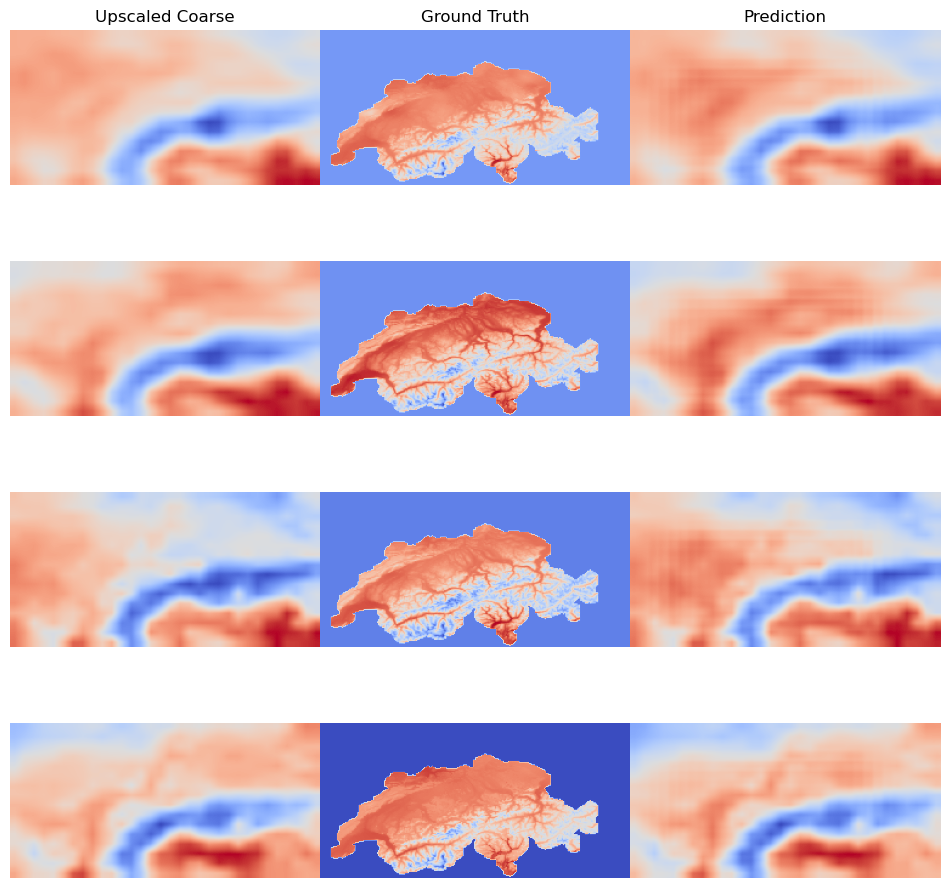

Train :: Epoch: 2:   0%|          | 1/317 [00:00<04:57,  1.06it/s]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   1%|          | 2/317 [01:30<4:38:23, 53.03s/it, Loss: 50.4988]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   1%|          | 3/317 [02:53<5:50:03, 66.89s/it, Loss: 42.9658]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   1%|▏         | 4/317 [04:14<6:17:51, 72.43s/it, Loss: 50.2181]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   2%|▏         | 5/317 [05:37<6:35:58, 76.15s/it, Loss: 44.6066]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   2%|▏         | 6/317 [07:01<6:49:16, 78.96s/it, Loss: 51.8508]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   2%|▏         | 7/317 [08:35<7:12:18, 83.67s/it, Loss: 43.5580]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   3%|▎         | 8/317 [10:05<7:22:27, 85.91s/it, Loss: 46.7279]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   3%|▎         | 9/317 [11:40<7:34:50, 88.61s/it, Loss: 45.9849]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   3%|▎         | 10/317 [12:58<7:16:04, 85.23s/it, Loss: 51.8162]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   3%|▎         | 11/317 [14:47<7:52:49, 92.71s/it, Loss: 56.7891]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   4%|▍         | 12/317 [16:12<7:39:21, 90.37s/it, Loss: 47.3497]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   4%|▍         | 13/317 [17:39<7:31:54, 89.19s/it, Loss: 50.1635]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   4%|▍         | 14/317 [19:04<7:25:00, 88.12s/it, Loss: 44.2374]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   5%|▍         | 15/317 [20:22<7:08:06, 85.05s/it, Loss: 65.0192]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   5%|▌         | 16/317 [21:47<7:05:16, 84.77s/it, Loss: 64.2924]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   5%|▌         | 17/317 [23:10<7:01:10, 84.24s/it, Loss: 50.0517]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   6%|▌         | 18/317 [24:33<6:58:21, 83.95s/it, Loss: 51.8698]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   6%|▌         | 19/317 [25:58<6:59:02, 84.37s/it, Loss: 51.6545]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   6%|▋         | 20/317 [27:24<6:59:39, 84.78s/it, Loss: 61.9027]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   7%|▋         | 21/317 [28:52<7:03:06, 85.77s/it, Loss: 48.6328]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   7%|▋         | 22/317 [30:13<6:55:09, 84.44s/it, Loss: 53.9531]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   7%|▋         | 23/317 [31:35<6:50:24, 83.76s/it, Loss: 52.7777]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   8%|▊         | 24/317 [33:03<6:54:15, 84.83s/it, Loss: 59.2512]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   8%|▊         | 25/317 [34:29<6:54:49, 85.24s/it, Loss: 56.1516]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   8%|▊         | 26/317 [35:51<6:49:23, 84.41s/it, Loss: 51.1873]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   9%|▊         | 27/317 [37:14<6:44:53, 83.77s/it, Loss: 47.7380]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   9%|▉         | 28/317 [38:39<6:45:54, 84.27s/it, Loss: 62.9144]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   9%|▉         | 29/317 [40:11<6:55:35, 86.58s/it, Loss: 57.2845]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:   9%|▉         | 30/317 [41:36<6:51:29, 86.02s/it, Loss: 43.0112]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  10%|▉         | 31/317 [42:58<6:44:17, 84.82s/it, Loss: 58.7752]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  10%|█         | 32/317 [44:25<6:46:06, 85.50s/it, Loss: 52.5182]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  10%|█         | 33/317 [45:50<6:43:40, 85.28s/it, Loss: 51.0112]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  11%|█         | 34/317 [47:11<6:37:12, 84.21s/it, Loss: 51.9718]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  11%|█         | 35/317 [48:33<6:32:38, 83.54s/it, Loss: 48.8994]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  11%|█▏        | 36/317 [49:57<6:31:00, 83.49s/it, Loss: 62.1800]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  12%|█▏        | 37/317 [51:24<6:35:18, 84.71s/it, Loss: 58.2622]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  12%|█▏        | 38/317 [52:48<6:32:15, 84.36s/it, Loss: 56.6293]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  12%|█▏        | 39/317 [54:12<6:30:48, 84.35s/it, Loss: 45.1183]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  13%|█▎        | 40/317 [55:40<6:33:27, 85.23s/it, Loss: 56.8364]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  13%|█▎        | 41/317 [57:02<6:28:18, 84.42s/it, Loss: 50.2367]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  13%|█▎        | 42/317 [58:23<6:21:54, 83.32s/it, Loss: 60.2090]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  14%|█▎        | 43/317 [59:49<6:24:35, 84.22s/it, Loss: 67.0284]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  14%|█▍        | 44/317 [1:01:11<6:20:25, 83.61s/it, Loss: 53.2419]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  14%|█▍        | 45/317 [1:02:39<6:25:05, 84.95s/it, Loss: 44.9246]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  15%|█▍        | 46/317 [1:04:01<6:19:35, 84.04s/it, Loss: 48.0479]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  15%|█▍        | 47/317 [1:05:21<6:12:38, 82.81s/it, Loss: 40.8802]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  15%|█▌        | 48/317 [1:06:45<6:12:35, 83.11s/it, Loss: 39.6505]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  15%|█▌        | 49/317 [1:08:06<6:08:22, 82.47s/it, Loss: 48.3110]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  16%|█▌        | 50/317 [1:09:30<6:08:46, 82.87s/it, Loss: 45.9992]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  16%|█▌        | 51/317 [1:10:52<6:06:13, 82.61s/it, Loss: 53.0144]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  16%|█▋        | 52/317 [1:12:18<6:09:46, 83.72s/it, Loss: 38.8691]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  17%|█▋        | 53/317 [1:13:46<6:14:26, 85.10s/it, Loss: 45.5910]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  17%|█▋        | 54/317 [1:15:14<6:15:37, 85.70s/it, Loss: 56.7957]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  17%|█▋        | 55/317 [1:16:39<6:13:45, 85.59s/it, Loss: 49.4855]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  18%|█▊        | 56/317 [1:18:05<6:12:36, 85.66s/it, Loss: 51.7159]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  18%|█▊        | 57/317 [1:19:32<6:12:43, 86.01s/it, Loss: 42.7076]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  18%|█▊        | 58/317 [1:20:58<6:12:03, 86.19s/it, Loss: 49.4884]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  19%|█▊        | 59/317 [1:22:24<6:09:55, 86.03s/it, Loss: 61.8109]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  19%|█▉        | 60/317 [1:23:43<6:00:05, 84.07s/it, Loss: 54.3313]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  19%|█▉        | 61/317 [1:25:10<6:02:12, 84.89s/it, Loss: 52.8877]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  20%|█▉        | 62/317 [1:26:28<5:52:17, 82.89s/it, Loss: 42.6724]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  20%|█▉        | 63/317 [1:27:52<5:51:44, 83.09s/it, Loss: 45.1771]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  20%|██        | 64/317 [1:29:17<5:53:29, 83.83s/it, Loss: 64.1124]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  21%|██        | 65/317 [1:30:41<5:51:07, 83.60s/it, Loss: 58.9697]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  21%|██        | 66/317 [1:32:04<5:49:19, 83.50s/it, Loss: 51.3131]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  21%|██        | 67/317 [1:33:25<5:44:47, 82.75s/it, Loss: 51.4530]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  21%|██▏       | 68/317 [1:34:47<5:42:41, 82.58s/it, Loss: 64.5878]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  22%|██▏       | 69/317 [1:36:11<5:42:49, 82.94s/it, Loss: 42.7224]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  22%|██▏       | 70/317 [1:37:35<5:42:39, 83.24s/it, Loss: 52.7549]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  22%|██▏       | 71/317 [1:39:02<5:46:08, 84.42s/it, Loss: 48.9029]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  23%|██▎       | 72/317 [1:40:27<5:45:47, 84.68s/it, Loss: 46.0953]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  23%|██▎       | 73/317 [1:41:50<5:42:05, 84.12s/it, Loss: 55.4552]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  23%|██▎       | 74/317 [1:43:15<5:41:20, 84.28s/it, Loss: 54.4284]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  24%|██▎       | 75/317 [1:44:39<5:39:56, 84.28s/it, Loss: 50.5448]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  24%|██▍       | 76/317 [1:46:02<5:36:33, 83.79s/it, Loss: 50.0306]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  24%|██▍       | 77/317 [1:47:28<5:37:54, 84.48s/it, Loss: 71.6819]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  25%|██▍       | 78/317 [1:48:51<5:34:45, 84.04s/it, Loss: 51.7571]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  25%|██▍       | 79/317 [1:50:24<5:44:11, 86.77s/it, Loss: 49.4878]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  25%|██▌       | 80/317 [1:51:51<5:43:41, 87.01s/it, Loss: 50.8407]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  26%|██▌       | 81/317 [1:53:13<5:36:10, 85.47s/it, Loss: 50.5383]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  26%|██▌       | 82/317 [1:54:37<5:32:49, 84.98s/it, Loss: 67.6548]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  26%|██▌       | 83/317 [1:56:08<5:38:44, 86.86s/it, Loss: 54.0397]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  26%|██▋       | 84/317 [1:57:36<5:37:41, 86.96s/it, Loss: 56.6506]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  27%|██▋       | 85/317 [1:59:00<5:33:01, 86.13s/it, Loss: 40.8207]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  27%|██▋       | 86/317 [2:00:26<5:31:47, 86.18s/it, Loss: 50.5592]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  27%|██▋       | 87/317 [2:01:52<5:30:16, 86.16s/it, Loss: 58.2205]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  28%|██▊       | 88/317 [2:03:20<5:30:26, 86.58s/it, Loss: 56.6381]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  28%|██▊       | 89/317 [2:04:45<5:27:20, 86.14s/it, Loss: 56.4838]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  28%|██▊       | 90/317 [2:06:06<5:20:38, 84.75s/it, Loss: 48.5899]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  29%|██▊       | 91/317 [2:07:32<5:20:36, 85.12s/it, Loss: 48.5104]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  29%|██▉       | 92/317 [2:08:56<5:17:31, 84.67s/it, Loss: 55.8510]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  29%|██▉       | 93/317 [2:10:25<5:21:13, 86.04s/it, Loss: 36.7016]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  30%|██▉       | 94/317 [2:11:43<5:10:47, 83.62s/it, Loss: 46.0164]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  30%|██▉       | 95/317 [2:13:02<5:04:09, 82.21s/it, Loss: 47.1323]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  30%|███       | 96/317 [2:14:27<5:05:29, 82.94s/it, Loss: 41.6476]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  31%|███       | 97/317 [2:15:54<5:09:18, 84.36s/it, Loss: 54.5490]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  31%|███       | 98/317 [2:17:17<5:05:48, 83.78s/it, Loss: 56.6600]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  31%|███       | 99/317 [2:18:41<5:04:43, 83.87s/it, Loss: 36.2233]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  32%|███▏      | 100/317 [2:20:04<5:02:49, 83.73s/it, Loss: 49.5581]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  32%|███▏      | 101/317 [2:21:32<5:05:59, 85.00s/it, Loss: 54.7760]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  32%|███▏      | 102/317 [2:22:55<5:02:11, 84.33s/it, Loss: 48.6330]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  32%|███▏      | 103/317 [2:24:16<4:57:38, 83.45s/it, Loss: 66.1274]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  33%|███▎      | 104/317 [2:25:43<4:59:46, 84.44s/it, Loss: 50.0307]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  33%|███▎      | 105/317 [2:27:08<4:59:15, 84.69s/it, Loss: 44.2789]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  33%|███▎      | 106/317 [2:28:35<4:59:59, 85.31s/it, Loss: 48.6291]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  34%|███▍      | 107/317 [2:30:03<5:01:39, 86.19s/it, Loss: 45.2893]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  34%|███▍      | 108/317 [2:31:28<4:58:22, 85.66s/it, Loss: 61.9563]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  34%|███▍      | 109/317 [2:32:49<4:52:02, 84.24s/it, Loss: 59.1741]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  35%|███▍      | 110/317 [2:34:13<4:50:54, 84.32s/it, Loss: 47.7905]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  35%|███▌      | 111/317 [2:35:37<4:49:09, 84.22s/it, Loss: 47.5895]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  35%|███▌      | 112/317 [2:37:01<4:47:12, 84.06s/it, Loss: 51.5662]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  36%|███▌      | 113/317 [2:38:28<4:48:40, 84.90s/it, Loss: 51.2311]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  36%|███▌      | 114/317 [2:39:52<4:46:21, 84.64s/it, Loss: 45.4934]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  36%|███▋      | 115/317 [2:41:12<4:40:25, 83.30s/it, Loss: 56.8974]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  37%|███▋      | 116/317 [2:42:33<4:37:05, 82.72s/it, Loss: 44.7919]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  37%|███▋      | 117/317 [2:44:01<4:40:20, 84.10s/it, Loss: 38.9370]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  37%|███▋      | 118/317 [2:45:23<4:37:25, 83.65s/it, Loss: 42.6581]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  38%|███▊      | 119/317 [2:46:47<4:36:33, 83.80s/it, Loss: 36.2328]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  38%|███▊      | 120/317 [2:48:13<4:36:27, 84.20s/it, Loss: 40.0801]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  38%|███▊      | 121/317 [2:49:41<4:38:49, 85.36s/it, Loss: 50.4724]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  38%|███▊      | 122/317 [2:51:07<4:38:39, 85.74s/it, Loss: 49.1588]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  39%|███▉      | 123/317 [2:52:31<4:35:30, 85.21s/it, Loss: 55.3069]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  39%|███▉      | 124/317 [2:53:51<4:29:12, 83.69s/it, Loss: 57.1648]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  39%|███▉      | 125/317 [2:55:12<4:24:44, 82.73s/it, Loss: 42.8077]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  40%|███▉      | 126/317 [2:56:36<4:24:53, 83.21s/it, Loss: 56.2147]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  40%|████      | 127/317 [2:58:00<4:23:40, 83.26s/it, Loss: 38.5423]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  40%|████      | 128/317 [2:59:24<4:23:22, 83.61s/it, Loss: 44.6314]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  41%|████      | 129/317 [3:00:45<4:19:16, 82.75s/it, Loss: 38.8847]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  41%|████      | 130/317 [3:02:04<4:14:23, 81.62s/it, Loss: 61.4895]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  41%|████▏     | 131/317 [3:03:24<4:12:05, 81.32s/it, Loss: 39.5736]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  42%|████▏     | 132/317 [3:04:51<4:15:58, 83.02s/it, Loss: 51.3054]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  42%|████▏     | 133/317 [3:06:21<4:20:58, 85.10s/it, Loss: 53.1042]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  42%|████▏     | 134/317 [3:07:47<4:20:00, 85.25s/it, Loss: 38.3590]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  43%|████▎     | 135/317 [3:09:11<4:17:41, 84.95s/it, Loss: 43.6278]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  43%|████▎     | 136/317 [3:10:34<4:14:06, 84.23s/it, Loss: 54.3506]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  43%|████▎     | 137/317 [3:11:57<4:12:10, 84.06s/it, Loss: 51.7479]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  44%|████▎     | 138/317 [3:13:22<4:11:04, 84.16s/it, Loss: 46.1621]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  44%|████▍     | 139/317 [3:14:50<4:13:02, 85.30s/it, Loss: 45.3519]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  44%|████▍     | 140/317 [3:16:13<4:10:10, 84.81s/it, Loss: 52.4753]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  44%|████▍     | 141/317 [3:17:38<4:08:11, 84.61s/it, Loss: 64.0710]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  45%|████▍     | 142/317 [3:18:57<4:01:51, 82.93s/it, Loss: 56.8011]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  45%|████▌     | 143/317 [3:20:19<3:59:49, 82.70s/it, Loss: 61.4025]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  45%|████▌     | 144/317 [3:21:46<4:02:16, 84.03s/it, Loss: 60.0948]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  46%|████▌     | 145/317 [3:23:17<4:06:54, 86.13s/it, Loss: 42.1817]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  46%|████▌     | 146/317 [3:24:44<4:06:31, 86.50s/it, Loss: 48.4024]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  46%|████▋     | 147/317 [3:26:11<4:05:25, 86.62s/it, Loss: 64.5585]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  47%|████▋     | 148/317 [3:27:43<4:08:32, 88.24s/it, Loss: 53.8770]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  47%|████▋     | 149/317 [3:29:20<4:14:41, 90.96s/it, Loss: 57.6683]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  47%|████▋     | 150/317 [3:30:51<4:13:09, 90.96s/it, Loss: 57.7112]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  48%|████▊     | 151/317 [3:32:20<4:09:21, 90.13s/it, Loss: 30.4147]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  48%|████▊     | 152/317 [3:33:49<4:06:55, 89.79s/it, Loss: 60.8156]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  48%|████▊     | 153/317 [3:35:20<4:07:03, 90.39s/it, Loss: 47.4337]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  49%|████▊     | 154/317 [3:36:52<4:06:28, 90.72s/it, Loss: 54.7812]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  49%|████▉     | 155/317 [3:38:21<4:03:33, 90.21s/it, Loss: 51.9805]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  49%|████▉     | 156/317 [3:39:47<3:58:23, 88.84s/it, Loss: 41.0601]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  50%|████▉     | 157/317 [3:41:12<3:53:56, 87.73s/it, Loss: 47.5684]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  50%|████▉     | 158/317 [3:42:36<3:49:50, 86.73s/it, Loss: 45.1205]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  50%|█████     | 159/317 [3:44:04<3:49:02, 86.98s/it, Loss: 41.4916]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  50%|█████     | 160/317 [3:45:32<3:48:47, 87.44s/it, Loss: 50.1413]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  51%|█████     | 161/317 [3:47:04<3:50:41, 88.73s/it, Loss: 49.7561]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  51%|█████     | 162/317 [3:48:37<3:52:16, 89.91s/it, Loss: 58.3022]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  51%|█████▏    | 163/317 [3:50:03<3:48:15, 88.93s/it, Loss: 60.4421]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  52%|█████▏    | 164/317 [3:51:31<3:45:44, 88.53s/it, Loss: 50.4165]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  52%|█████▏    | 165/317 [3:53:05<3:48:46, 90.30s/it, Loss: 54.9864]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  52%|█████▏    | 166/317 [3:54:39<3:49:45, 91.29s/it, Loss: 53.8472]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  53%|█████▎    | 167/317 [3:56:05<3:44:28, 89.79s/it, Loss: 47.1678]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  53%|█████▎    | 168/317 [3:57:30<3:39:19, 88.32s/it, Loss: 60.8997]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  53%|█████▎    | 169/317 [3:58:56<3:36:24, 87.73s/it, Loss: 56.8054]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  54%|█████▎    | 170/317 [4:00:25<3:35:32, 87.97s/it, Loss: 40.8891]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  54%|█████▍    | 171/317 [4:01:52<3:33:10, 87.60s/it, Loss: 43.8096]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  54%|█████▍    | 172/317 [4:03:17<3:29:44, 86.79s/it, Loss: 46.0055]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  55%|█████▍    | 173/317 [4:04:42<3:27:29, 86.45s/it, Loss: 50.0996]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  55%|█████▍    | 174/317 [4:06:05<3:23:29, 85.38s/it, Loss: 51.9251]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  55%|█████▌    | 175/317 [4:07:31<3:22:20, 85.50s/it, Loss: 55.8813]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  56%|█████▌    | 176/317 [4:09:00<3:23:28, 86.58s/it, Loss: 40.0154]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  56%|█████▌    | 177/317 [4:10:32<3:25:49, 88.21s/it, Loss: 37.5977]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  56%|█████▌    | 178/317 [4:11:56<3:21:17, 86.89s/it, Loss: 44.3128]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  56%|█████▋    | 179/317 [4:13:23<3:20:07, 87.01s/it, Loss: 39.5006]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  57%|█████▋    | 180/317 [4:14:57<3:23:25, 89.09s/it, Loss: 51.1277]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  57%|█████▋    | 181/317 [4:16:34<3:27:12, 91.41s/it, Loss: 45.0009]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  57%|█████▋    | 182/317 [4:18:02<3:23:41, 90.53s/it, Loss: 40.2293]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  58%|█████▊    | 183/317 [4:19:31<3:20:48, 89.91s/it, Loss: 43.4394]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  58%|█████▊    | 184/317 [4:20:57<3:17:09, 88.95s/it, Loss: 49.8587]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  58%|█████▊    | 185/317 [4:22:35<3:21:31, 91.60s/it, Loss: 41.4099]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  59%|█████▊    | 186/317 [4:24:11<3:22:53, 92.92s/it, Loss: 45.2406]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  59%|█████▉    | 187/317 [4:25:43<3:20:21, 92.47s/it, Loss: 43.3349]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  59%|█████▉    | 188/317 [4:27:11<3:16:04, 91.20s/it, Loss: 33.0630]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  60%|█████▉    | 189/317 [4:28:39<3:12:17, 90.13s/it, Loss: 47.2220]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  60%|█████▉    | 190/317 [4:30:12<3:12:39, 91.02s/it, Loss: 49.1574]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  60%|██████    | 191/317 [4:31:47<3:13:58, 92.37s/it, Loss: 52.5951]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  61%|██████    | 192/317 [4:33:18<3:11:28, 91.91s/it, Loss: 53.1298]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  61%|██████    | 193/317 [4:34:48<3:08:50, 91.37s/it, Loss: 52.4112]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  61%|██████    | 194/317 [4:36:18<3:06:04, 90.77s/it, Loss: 47.7578]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  62%|██████▏   | 195/317 [4:37:47<3:03:50, 90.41s/it, Loss: 43.4513]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  62%|██████▏   | 196/317 [4:39:21<3:04:32, 91.51s/it, Loss: 55.7714]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  62%|██████▏   | 197/317 [4:40:57<3:05:34, 92.79s/it, Loss: 51.1704]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  62%|██████▏   | 198/317 [4:42:25<3:01:10, 91.35s/it, Loss: 53.8997]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  63%|██████▎   | 199/317 [4:43:56<2:59:24, 91.22s/it, Loss: 49.7474]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  63%|██████▎   | 200/317 [4:45:23<2:55:24, 89.96s/it, Loss: 44.6072]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  63%|██████▎   | 201/317 [4:47:01<2:58:32, 92.35s/it, Loss: 47.0705]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  64%|██████▎   | 202/317 [4:48:34<2:57:16, 92.49s/it, Loss: 54.2904]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  64%|██████▍   | 203/317 [4:50:03<2:54:03, 91.61s/it, Loss: 61.4852]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  64%|██████▍   | 204/317 [4:51:35<2:52:35, 91.64s/it, Loss: 58.5380]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  65%|██████▍   | 205/317 [4:53:09<2:52:10, 92.24s/it, Loss: 46.1686]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  65%|██████▍   | 206/317 [4:54:43<2:51:54, 92.93s/it, Loss: 38.0709]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  65%|██████▌   | 207/317 [4:56:17<2:50:53, 93.21s/it, Loss: 45.8141]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  66%|██████▌   | 208/317 [4:57:47<2:47:24, 92.15s/it, Loss: 51.8026]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  66%|██████▌   | 209/317 [4:59:18<2:45:18, 91.84s/it, Loss: 57.1628]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  66%|██████▌   | 210/317 [5:00:46<2:42:00, 90.85s/it, Loss: 58.6376]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  67%|██████▋   | 211/317 [5:02:20<2:42:08, 91.78s/it, Loss: 50.1330]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  67%|██████▋   | 212/317 [5:03:55<2:42:08, 92.65s/it, Loss: 52.2783]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  67%|██████▋   | 213/317 [5:05:31<2:42:33, 93.78s/it, Loss: 54.0043]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  68%|██████▊   | 214/317 [5:07:03<2:40:03, 93.23s/it, Loss: 46.9272]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  68%|██████▊   | 215/317 [5:08:34<2:37:09, 92.44s/it, Loss: 48.5130]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  68%|██████▊   | 216/317 [5:10:06<2:35:36, 92.44s/it, Loss: 46.7118]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  68%|██████▊   | 217/317 [5:11:46<2:37:35, 94.55s/it, Loss: 34.0622]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  69%|██████▉   | 218/317 [5:13:16<2:33:40, 93.13s/it, Loss: 52.6434]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  69%|██████▉   | 219/317 [5:14:40<2:27:57, 90.59s/it, Loss: 32.5567]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  69%|██████▉   | 220/317 [5:16:07<2:24:26, 89.35s/it, Loss: 49.3794]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  70%|██████▉   | 221/317 [5:17:39<2:24:15, 90.17s/it, Loss: 50.9381]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  70%|███████   | 222/317 [5:19:11<2:23:49, 90.83s/it, Loss: 42.6438]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  70%|███████   | 223/317 [5:20:42<2:22:13, 90.78s/it, Loss: 47.4511]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  71%|███████   | 224/317 [5:22:12<2:20:25, 90.60s/it, Loss: 41.3325]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  71%|███████   | 225/317 [5:23:44<2:19:29, 90.97s/it, Loss: 49.0059]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  71%|███████▏  | 226/317 [5:25:12<2:16:51, 90.23s/it, Loss: 46.2301]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  72%|███████▏  | 227/317 [5:26:47<2:17:07, 91.42s/it, Loss: 42.6252]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  72%|███████▏  | 228/317 [5:28:21<2:17:00, 92.37s/it, Loss: 53.2090]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  72%|███████▏  | 229/317 [5:29:51<2:14:35, 91.77s/it, Loss: 49.5769]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  73%|███████▎  | 230/317 [5:31:16<2:09:50, 89.54s/it, Loss: 49.7449]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  73%|███████▎  | 231/317 [5:32:42<2:06:57, 88.57s/it, Loss: 46.1469]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  73%|███████▎  | 232/317 [5:34:12<2:06:01, 88.96s/it, Loss: 37.9832]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  74%|███████▎  | 233/317 [5:35:45<2:06:11, 90.14s/it, Loss: 43.6129]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  74%|███████▍  | 234/317 [5:37:15<2:04:42, 90.15s/it, Loss: 37.9330]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  74%|███████▍  | 235/317 [5:38:44<2:02:32, 89.67s/it, Loss: 52.9696]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  74%|███████▍  | 236/317 [5:40:07<1:58:28, 87.76s/it, Loss: 43.8337]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  75%|███████▍  | 237/317 [5:41:36<1:57:20, 88.01s/it, Loss: 50.4485]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  75%|███████▌  | 238/317 [5:43:01<1:54:53, 87.25s/it, Loss: 47.5757]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  75%|███████▌  | 239/317 [5:44:24<1:51:40, 85.90s/it, Loss: 41.8820]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  76%|███████▌  | 240/317 [5:45:45<1:48:18, 84.40s/it, Loss: 43.0953]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  76%|███████▌  | 241/317 [5:47:06<1:45:48, 83.53s/it, Loss: 54.5869]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  76%|███████▋  | 242/317 [5:48:26<1:43:04, 82.46s/it, Loss: 41.5691]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  77%|███████▋  | 243/317 [5:49:50<1:42:07, 82.80s/it, Loss: 41.2560]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  77%|███████▋  | 244/317 [5:51:13<1:41:03, 83.06s/it, Loss: 39.4749]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  77%|███████▋  | 245/317 [5:52:39<1:40:29, 83.74s/it, Loss: 51.6371]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  78%|███████▊  | 246/317 [5:53:59<1:37:47, 82.64s/it, Loss: 49.6685]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  78%|███████▊  | 247/317 [5:55:17<1:35:02, 81.47s/it, Loss: 56.7262]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  78%|███████▊  | 248/317 [5:56:41<1:34:25, 82.11s/it, Loss: 47.1628]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  79%|███████▊  | 249/317 [5:58:09<1:35:00, 83.82s/it, Loss: 55.3825]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  79%|███████▉  | 250/317 [5:59:33<1:33:43, 83.93s/it, Loss: 40.3167]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  79%|███████▉  | 251/317 [6:00:53<1:31:07, 82.84s/it, Loss: 41.7257]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  79%|███████▉  | 252/317 [6:02:14<1:29:06, 82.25s/it, Loss: 38.4475]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  80%|███████▉  | 253/317 [6:03:43<1:29:48, 84.20s/it, Loss: 45.7722]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  80%|████████  | 254/317 [6:05:06<1:27:57, 83.77s/it, Loss: 48.1830]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  80%|████████  | 255/317 [6:06:29<1:26:23, 83.61s/it, Loss: 56.4112]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  81%|████████  | 256/317 [6:07:52<1:24:56, 83.55s/it, Loss: 46.5297]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  81%|████████  | 257/317 [6:09:15<1:23:23, 83.39s/it, Loss: 49.0338]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  81%|████████▏ | 258/317 [6:10:35<1:20:57, 82.33s/it, Loss: 44.3579]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  82%|████████▏ | 259/317 [6:11:57<1:19:30, 82.24s/it, Loss: 38.0185]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  82%|████████▏ | 260/317 [6:13:22<1:18:51, 83.02s/it, Loss: 48.5415]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  82%|████████▏ | 261/317 [6:14:47<1:18:04, 83.65s/it, Loss: 51.3527]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  83%|████████▎ | 262/317 [6:16:09<1:16:07, 83.04s/it, Loss: 48.3280]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  83%|████████▎ | 263/317 [6:17:32<1:14:48, 83.11s/it, Loss: 42.1001]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  83%|████████▎ | 264/317 [6:18:56<1:13:41, 83.43s/it, Loss: 48.2010]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  84%|████████▎ | 265/317 [6:20:18<1:11:55, 83.00s/it, Loss: 51.3635]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  84%|████████▍ | 266/317 [6:21:42<1:10:47, 83.29s/it, Loss: 49.5738]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  84%|████████▍ | 267/317 [6:23:07<1:09:47, 83.75s/it, Loss: 40.5993]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  85%|████████▍ | 268/317 [6:24:31<1:08:28, 83.85s/it, Loss: 47.9331]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  85%|████████▍ | 269/317 [6:25:59<1:07:59, 84.98s/it, Loss: 48.0434]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  85%|████████▌ | 270/317 [6:27:23<1:06:17, 84.62s/it, Loss: 33.3804]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  85%|████████▌ | 271/317 [6:28:46<1:04:40, 84.37s/it, Loss: 62.0584]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  86%|████████▌ | 272/317 [6:30:10<1:02:59, 83.99s/it, Loss: 49.3991]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  86%|████████▌ | 273/317 [6:31:39<1:02:44, 85.56s/it, Loss: 54.9234]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  86%|████████▋ | 274/317 [6:33:00<1:00:26, 84.33s/it, Loss: 45.1087]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  87%|████████▋ | 275/317 [6:34:23<58:41, 83.84s/it, Loss: 42.8524]  

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  87%|████████▋ | 276/317 [6:35:44<56:48, 83.14s/it, Loss: 49.8040]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  87%|████████▋ | 277/317 [6:37:07<55:20, 83.01s/it, Loss: 53.5979]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  88%|████████▊ | 278/317 [6:38:25<52:58, 81.50s/it, Loss: 47.9127]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  88%|████████▊ | 279/317 [6:39:42<50:49, 80.24s/it, Loss: 64.4050]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  88%|████████▊ | 280/317 [6:41:02<49:20, 80.02s/it, Loss: 58.7799]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  89%|████████▊ | 281/317 [6:42:30<49:23, 82.33s/it, Loss: 38.5602]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  89%|████████▉ | 282/317 [6:43:51<47:51, 82.04s/it, Loss: 41.7518]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  89%|████████▉ | 283/317 [6:45:13<46:29, 82.04s/it, Loss: 45.9519]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  90%|████████▉ | 284/317 [6:46:34<44:54, 81.65s/it, Loss: 47.6520]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  90%|████████▉ | 285/317 [6:48:01<44:27, 83.35s/it, Loss: 35.8897]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  90%|█████████ | 286/317 [6:49:24<43:02, 83.32s/it, Loss: 47.2156]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  91%|█████████ | 287/317 [6:50:49<41:53, 83.77s/it, Loss: 46.7445]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  91%|█████████ | 288/317 [6:52:13<40:30, 83.82s/it, Loss: 48.4453]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  91%|█████████ | 289/317 [6:53:37<39:10, 83.93s/it, Loss: 48.8684]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  91%|█████████▏| 290/317 [6:54:59<37:29, 83.30s/it, Loss: 48.9352]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  92%|█████████▏| 291/317 [6:56:23<36:09, 83.42s/it, Loss: 51.1428]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  92%|█████████▏| 292/317 [6:57:48<34:56, 83.85s/it, Loss: 45.6980]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  92%|█████████▏| 293/317 [6:59:11<33:30, 83.77s/it, Loss: 43.8117]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  93%|█████████▎| 294/317 [7:00:32<31:48, 82.97s/it, Loss: 34.4816]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  93%|█████████▎| 295/317 [7:01:53<30:12, 82.41s/it, Loss: 45.8711]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  93%|█████████▎| 296/317 [7:03:16<28:53, 82.53s/it, Loss: 43.6233]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  94%|█████████▎| 297/317 [7:04:42<27:48, 83.43s/it, Loss: 44.7446]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  94%|█████████▍| 298/317 [7:06:07<26:37, 84.07s/it, Loss: 41.5491]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  94%|█████████▍| 299/317 [7:07:30<25:03, 83.51s/it, Loss: 40.4720]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  95%|█████████▍| 300/317 [7:08:52<23:34, 83.22s/it, Loss: 52.6797]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  95%|█████████▍| 301/317 [7:10:17<22:20, 83.76s/it, Loss: 39.2195]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  95%|█████████▌| 302/317 [7:11:40<20:53, 83.55s/it, Loss: 42.4193]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  96%|█████████▌| 303/317 [7:13:05<19:33, 83.85s/it, Loss: 50.0610]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  96%|█████████▌| 304/317 [7:14:31<18:18, 84.51s/it, Loss: 48.3568]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  96%|█████████▌| 305/317 [7:15:57<16:59, 84.97s/it, Loss: 46.5576]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  97%|█████████▋| 306/317 [7:17:19<15:24, 84.00s/it, Loss: 36.5064]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  97%|█████████▋| 307/317 [7:18:45<14:07, 84.74s/it, Loss: 45.5523]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  97%|█████████▋| 308/317 [7:20:10<12:43, 84.85s/it, Loss: 50.9898]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  97%|█████████▋| 309/317 [7:21:36<11:20, 85.09s/it, Loss: 43.9401]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  98%|█████████▊| 310/317 [7:22:58<09:48, 84.10s/it, Loss: 45.8253]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  98%|█████████▊| 311/317 [7:24:16<08:13, 82.28s/it, Loss: 43.4324]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  98%|█████████▊| 312/317 [7:25:42<06:57, 83.41s/it, Loss: 50.3652]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  99%|█████████▊| 313/317 [7:27:07<05:35, 83.94s/it, Loss: 44.1220]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  99%|█████████▉| 314/317 [7:28:31<04:12, 84.03s/it, Loss: 47.8832]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2:  99%|█████████▉| 315/317 [7:29:55<02:47, 83.96s/it, Loss: 33.3395]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2: 100%|█████████▉| 316/317 [7:31:14<01:22, 82.64s/it, Loss: 51.1205]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 2: 100%|██████████| 317/317 [7:32:39<00:00, 83.08s/it, Loss: 40.0702]

Batch input shape: torch.Size([4, 1, 128, 256])
Batch output shape: torch.Size([4, 1, 128, 256])
Input shape to conv0: torch.Size([4, 128, 128, 256])
Input shape to conv0: torch.Size([4, 128, 128, 256])
Input shape to conv0: torch.Size([4, 128, 128, 256])
Input shape to conv0: torch.Size([4, 128, 64, 128])
Input shape to conv0: torch.Size([4, 256, 64, 128])
Input shape to conv0: torch.Size([4, 256, 64, 128])
Input shape to conv0: torch.Size([4, 256, 32, 64])
Input shape to conv0: torch.Size([4, 512, 32, 64])
Input shape to conv0: torch.Size([4, 512, 32, 64])
Input shape to conv0: torch.Size([4, 512, 16, 32])
Input shape to conv0: torch.Size([4, 1024, 16, 32])
Input shape to conv0: torch.Size([4, 1024, 16, 32])
Input shape to conv0: torch.Size([4, 1024, 16, 32])
x.shape: torch.Size([4, 1024, 16, 32]), skips[-1].shape: torch.Size([4, 1024, 16, 32])
Input shape to conv0: torch.Size([4, 2048, 16, 32])
x.shape: torch.Size([4, 1024, 16, 32]), skips[-1].shape: torch.Size([4, 1024, 16, 32])
In

Train :: Epoch: 2: 100%|██████████| 317/317 [7:33:02<00:00, 85.75s/it, Loss: 49.1229]


Model saved to ./Model_unet/Test_1/unet_model_epoch_2.pt
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: to

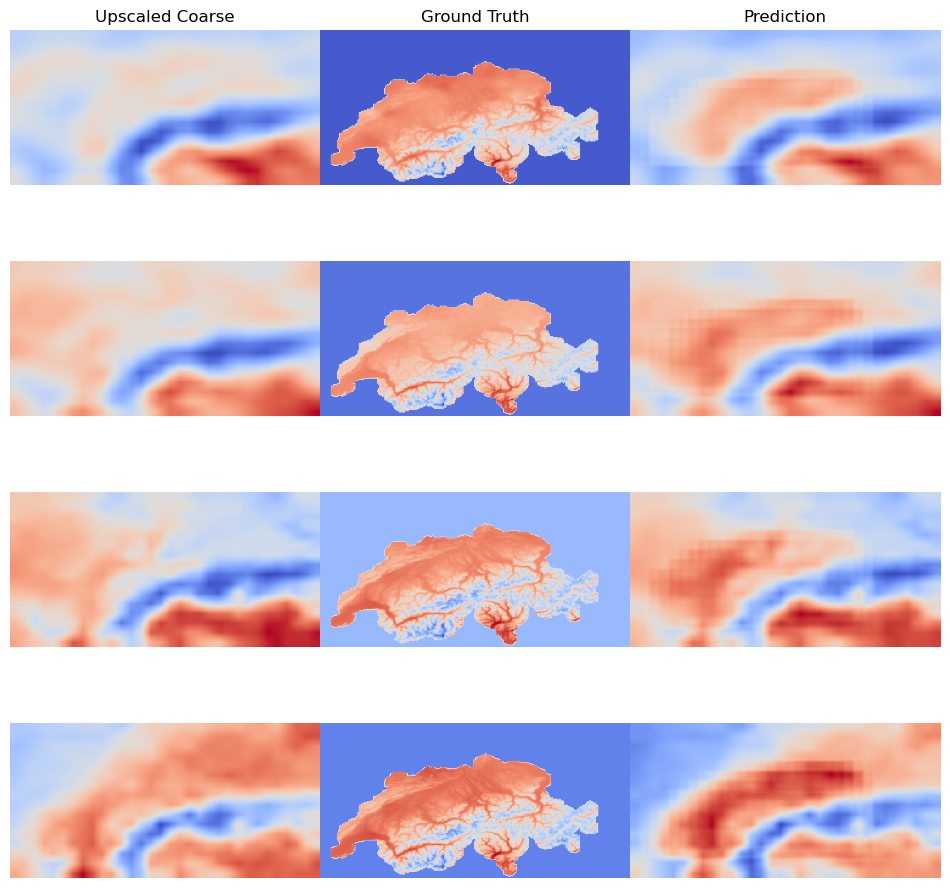

Train :: Epoch: 3:   0%|          | 1/317 [00:00<04:39,  1.13it/s]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   1%|          | 2/317 [01:22<4:14:31, 48.48s/it, Loss: 38.1819]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   1%|          | 3/317 [02:45<5:35:03, 64.02s/it, Loss: 41.7674]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   1%|▏         | 4/317 [04:03<6:03:53, 69.75s/it, Loss: 38.7344]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   2%|▏         | 5/317 [05:24<6:23:11, 73.69s/it, Loss: 48.5155]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   2%|▏         | 6/317 [06:47<6:38:02, 76.79s/it, Loss: 35.7632]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   2%|▏         | 7/317 [08:10<6:47:05, 78.79s/it, Loss: 40.5209]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   3%|▎         | 8/317 [09:35<6:56:17, 80.83s/it, Loss: 53.6223]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   3%|▎         | 9/317 [11:00<7:01:59, 82.21s/it, Loss: 52.3124]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   3%|▎         | 10/317 [12:19<6:55:40, 81.24s/it, Loss: 48.0721]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   3%|▎         | 11/317 [13:41<6:54:30, 81.28s/it, Loss: 56.5394]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   4%|▍         | 12/317 [15:09<7:04:12, 83.45s/it, Loss: 47.6402]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   4%|▍         | 13/317 [16:38<7:10:41, 85.00s/it, Loss: 59.8076]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   4%|▍         | 14/317 [17:59<7:03:52, 83.93s/it, Loss: 45.7868]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   5%|▍         | 15/317 [19:20<6:57:20, 82.92s/it, Loss: 39.5738]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   5%|▌         | 16/317 [20:42<6:55:03, 82.74s/it, Loss: 41.9669]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   5%|▌         | 17/317 [22:09<6:59:46, 83.96s/it, Loss: 42.2179]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   6%|▌         | 18/317 [23:31<6:56:06, 83.50s/it, Loss: 37.0739]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   6%|▌         | 19/317 [24:53<6:51:46, 82.91s/it, Loss: 44.2768]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   6%|▋         | 20/317 [26:13<6:46:00, 82.02s/it, Loss: 43.7357]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   7%|▋         | 21/317 [27:31<6:39:26, 80.97s/it, Loss: 38.3140]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   7%|▋         | 22/317 [28:52<6:37:46, 80.90s/it, Loss: 41.6375]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   7%|▋         | 23/317 [30:17<6:43:16, 82.30s/it, Loss: 44.7406]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   8%|▊         | 24/317 [31:36<6:36:06, 81.11s/it, Loss: 47.9143]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   8%|▊         | 25/317 [32:56<6:32:47, 80.71s/it, Loss: 49.5260]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   8%|▊         | 26/317 [34:11<6:24:22, 79.25s/it, Loss: 36.6257]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   9%|▊         | 27/317 [35:30<6:21:50, 79.00s/it, Loss: 44.8523]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   9%|▉         | 28/317 [36:52<6:24:40, 79.86s/it, Loss: 56.2024]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   9%|▉         | 29/317 [38:17<6:30:38, 81.38s/it, Loss: 43.5433]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:   9%|▉         | 30/317 [39:35<6:24:44, 80.43s/it, Loss: 45.3630]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  10%|▉         | 31/317 [40:53<6:20:25, 79.81s/it, Loss: 36.8960]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  10%|█         | 32/317 [42:14<6:20:13, 80.05s/it, Loss: 46.0917]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  10%|█         | 33/317 [43:41<6:29:30, 82.29s/it, Loss: 46.5219]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  11%|█         | 34/317 [45:02<6:26:33, 81.96s/it, Loss: 40.1944]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  11%|█         | 35/317 [46:21<6:20:20, 80.92s/it, Loss: 52.1514]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  11%|█▏        | 36/317 [47:34<6:08:03, 78.59s/it, Loss: 43.5192]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  12%|█▏        | 37/317 [48:51<6:03:54, 77.98s/it, Loss: 49.5366]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  12%|█▏        | 38/317 [50:09<6:03:28, 78.17s/it, Loss: 49.1485]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  12%|█▏        | 39/317 [51:32<6:08:44, 79.59s/it, Loss: 50.1119]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  13%|█▎        | 40/317 [52:56<6:13:08, 80.83s/it, Loss: 40.0657]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  13%|█▎        | 41/317 [54:20<6:16:25, 81.83s/it, Loss: 38.8104]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  13%|█▎        | 42/317 [55:42<6:14:36, 81.73s/it, Loss: 37.1440]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  14%|█▎        | 43/317 [57:05<6:15:23, 82.20s/it, Loss: 48.6921]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  14%|█▍        | 44/317 [58:31<6:19:01, 83.30s/it, Loss: 41.8005]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  14%|█▍        | 45/317 [59:53<6:15:45, 82.89s/it, Loss: 45.4766]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  15%|█▍        | 46/317 [1:01:10<6:06:47, 81.21s/it, Loss: 44.9198]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  15%|█▍        | 47/317 [1:02:24<5:56:24, 79.20s/it, Loss: 42.3231]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  15%|█▌        | 48/317 [1:03:39<5:49:21, 77.92s/it, Loss: 37.6324]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  15%|█▌        | 49/317 [1:05:06<5:59:37, 80.51s/it, Loss: 46.9414]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  16%|█▌        | 50/317 [1:06:26<5:58:03, 80.46s/it, Loss: 48.3114]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  16%|█▌        | 51/317 [1:07:46<5:55:24, 80.17s/it, Loss: 46.4509]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  16%|█▋        | 52/317 [1:09:01<5:47:15, 78.62s/it, Loss: 39.8997]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  17%|█▋        | 53/317 [1:10:23<5:50:26, 79.65s/it, Loss: 46.7335]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  17%|█▋        | 54/317 [1:11:40<5:46:12, 78.98s/it, Loss: 40.4110]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  17%|█▋        | 55/317 [1:13:03<5:49:23, 80.02s/it, Loss: 51.3852]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  18%|█▊        | 56/317 [1:14:26<5:52:48, 81.11s/it, Loss: 47.0254]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  18%|█▊        | 57/317 [1:15:50<5:55:08, 81.95s/it, Loss: 40.4688]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  18%|█▊        | 58/317 [1:17:06<5:45:39, 80.08s/it, Loss: 49.3348]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  19%|█▊        | 59/317 [1:18:21<5:37:49, 78.56s/it, Loss: 30.5887]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  19%|█▉        | 60/317 [1:19:44<5:41:35, 79.75s/it, Loss: 48.5541]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  19%|█▉        | 61/317 [1:21:07<5:44:26, 80.73s/it, Loss: 36.7563]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  20%|█▉        | 62/317 [1:22:27<5:43:17, 80.77s/it, Loss: 50.8579]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  20%|█▉        | 63/317 [1:23:51<5:45:08, 81.53s/it, Loss: 42.1769]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  20%|██        | 64/317 [1:25:11<5:42:09, 81.14s/it, Loss: 38.4265]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  21%|██        | 65/317 [1:26:38<5:48:21, 82.94s/it, Loss: 32.6996]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  21%|██        | 66/317 [1:27:59<5:44:32, 82.36s/it, Loss: 41.6426]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  21%|██        | 67/317 [1:29:22<5:43:35, 82.46s/it, Loss: 36.0978]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  21%|██▏       | 68/317 [1:30:41<5:38:37, 81.60s/it, Loss: 49.3966]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  22%|██▏       | 69/317 [1:32:01<5:34:17, 80.88s/it, Loss: 28.9919]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  22%|██▏       | 70/317 [1:33:22<5:33:35, 81.03s/it, Loss: 46.8733]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  22%|██▏       | 71/317 [1:34:43<5:31:38, 80.89s/it, Loss: 51.7537]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  23%|██▎       | 72/317 [1:36:03<5:29:22, 80.66s/it, Loss: 40.5482]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  23%|██▎       | 73/317 [1:37:23<5:27:28, 80.53s/it, Loss: 33.1306]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  23%|██▎       | 74/317 [1:38:36<5:17:39, 78.43s/it, Loss: 49.9424]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  24%|██▎       | 75/317 [1:39:53<5:13:32, 77.74s/it, Loss: 39.0514]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  24%|██▍       | 76/317 [1:41:13<5:14:56, 78.41s/it, Loss: 45.1140]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  24%|██▍       | 77/317 [1:42:37<5:20:55, 80.23s/it, Loss: 31.3844]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  25%|██▍       | 78/317 [1:43:59<5:21:44, 80.77s/it, Loss: 38.6534]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  25%|██▍       | 79/317 [1:45:21<5:22:22, 81.27s/it, Loss: 37.1906]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  25%|██▌       | 80/317 [1:46:42<5:19:52, 80.98s/it, Loss: 49.6440]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  26%|██▌       | 81/317 [1:48:09<5:25:38, 82.79s/it, Loss: 39.2045]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  26%|██▌       | 82/317 [1:49:30<5:22:09, 82.25s/it, Loss: 31.5104]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  26%|██▌       | 83/317 [1:50:54<5:23:00, 82.82s/it, Loss: 36.4079]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  26%|██▋       | 84/317 [1:52:16<5:20:36, 82.56s/it, Loss: 43.7961]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  27%|██▋       | 85/317 [1:53:31<5:10:43, 80.36s/it, Loss: 40.3517]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  27%|██▋       | 86/317 [1:54:46<5:03:10, 78.74s/it, Loss: 42.8080]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  27%|██▋       | 87/317 [1:56:09<5:06:41, 80.01s/it, Loss: 52.3980]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  28%|██▊       | 88/317 [1:57:33<5:09:57, 81.21s/it, Loss: 45.6221]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  28%|██▊       | 89/317 [1:58:53<5:07:43, 80.98s/it, Loss: 46.3217]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  28%|██▊       | 90/317 [2:00:12<5:03:25, 80.20s/it, Loss: 52.9057]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  29%|██▊       | 91/317 [2:01:30<4:59:34, 79.53s/it, Loss: 36.6980]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  29%|██▉       | 92/317 [2:02:50<4:59:18, 79.82s/it, Loss: 45.2848]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  29%|██▉       | 93/317 [2:04:17<5:05:17, 81.77s/it, Loss: 48.1893]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  30%|██▉       | 94/317 [2:05:34<4:59:31, 80.59s/it, Loss: 42.0386]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  30%|██▉       | 95/317 [2:06:53<4:55:24, 79.84s/it, Loss: 45.5495]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  30%|███       | 96/317 [2:08:09<4:50:16, 78.81s/it, Loss: 42.4450]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  31%|███       | 97/317 [2:09:28<4:48:48, 78.77s/it, Loss: 51.1818]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  31%|███       | 98/317 [2:10:50<4:51:09, 79.77s/it, Loss: 38.7769]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  31%|███       | 99/317 [2:12:11<4:51:33, 80.25s/it, Loss: 49.5082]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  32%|███▏      | 100/317 [2:13:30<4:49:16, 79.98s/it, Loss: 47.6214]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  32%|███▏      | 101/317 [2:14:52<4:49:50, 80.51s/it, Loss: 34.4235]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  32%|███▏      | 102/317 [2:16:14<4:49:54, 80.90s/it, Loss: 48.3224]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  32%|███▏      | 103/317 [2:17:40<4:54:17, 82.51s/it, Loss: 54.1560]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  33%|███▎      | 104/317 [2:19:04<4:54:16, 82.90s/it, Loss: 38.4072]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  33%|███▎      | 105/317 [2:20:28<4:53:30, 83.07s/it, Loss: 29.4641]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  33%|███▎      | 106/317 [2:21:41<4:42:26, 80.32s/it, Loss: 48.5088]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  34%|███▍      | 107/317 [2:22:58<4:37:19, 79.23s/it, Loss: 39.9621]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  34%|███▍      | 108/317 [2:24:21<4:39:38, 80.28s/it, Loss: 49.8715]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  34%|███▍      | 109/317 [2:25:47<4:44:15, 82.00s/it, Loss: 50.6446]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  35%|███▍      | 110/317 [2:27:09<4:42:52, 81.99s/it, Loss: 49.6899]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  35%|███▌      | 111/317 [2:28:28<4:38:19, 81.06s/it, Loss: 47.0778]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  35%|███▌      | 112/317 [2:29:48<4:35:44, 80.70s/it, Loss: 40.5028]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  36%|███▌      | 113/317 [2:31:04<4:30:07, 79.45s/it, Loss: 36.9749]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  36%|███▌      | 114/317 [2:32:24<4:29:01, 79.51s/it, Loss: 36.2952]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  36%|███▋      | 115/317 [2:33:47<4:31:11, 80.55s/it, Loss: 50.2415]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  37%|███▋      | 116/317 [2:35:11<4:33:09, 81.54s/it, Loss: 48.7884]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  37%|███▋      | 117/317 [2:36:35<4:35:01, 82.51s/it, Loss: 43.1013]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  37%|███▋      | 118/317 [2:37:52<4:28:08, 80.85s/it, Loss: 47.5359]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  38%|███▊      | 119/317 [2:39:14<4:27:23, 81.03s/it, Loss: 45.1401]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  38%|███▊      | 120/317 [2:40:38<4:28:39, 81.82s/it, Loss: 47.3051]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  38%|███▊      | 121/317 [2:42:01<4:28:47, 82.28s/it, Loss: 50.7303]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  38%|███▊      | 122/317 [2:43:18<4:22:20, 80.72s/it, Loss: 38.7912]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  39%|███▉      | 123/317 [2:44:40<4:22:13, 81.10s/it, Loss: 43.2791]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  39%|███▉      | 124/317 [2:46:02<4:21:49, 81.39s/it, Loss: 50.3611]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  39%|███▉      | 125/317 [2:47:26<4:22:46, 82.12s/it, Loss: 45.4771]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  40%|███▉      | 126/317 [2:48:49<4:22:25, 82.43s/it, Loss: 38.1151]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  40%|████      | 127/317 [2:50:11<4:20:53, 82.39s/it, Loss: 50.5761]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  40%|████      | 128/317 [2:51:31<4:17:15, 81.67s/it, Loss: 52.1259]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  41%|████      | 129/317 [2:52:53<4:16:22, 81.82s/it, Loss: 41.4050]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  41%|████      | 130/317 [2:54:15<4:14:41, 81.72s/it, Loss: 34.3861]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  41%|████▏     | 131/317 [2:55:40<4:16:31, 82.75s/it, Loss: 47.4902]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  42%|████▏     | 132/317 [2:56:57<4:10:03, 81.10s/it, Loss: 31.3593]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  42%|████▏     | 133/317 [2:58:15<4:05:17, 79.99s/it, Loss: 35.1881]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  42%|████▏     | 134/317 [2:59:32<4:01:54, 79.31s/it, Loss: 38.1626]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  43%|████▎     | 135/317 [3:00:55<4:03:26, 80.25s/it, Loss: 37.4017]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  43%|████▎     | 136/317 [3:02:15<4:01:45, 80.14s/it, Loss: 39.0049]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  43%|████▎     | 137/317 [3:03:37<4:02:34, 80.86s/it, Loss: 37.6747]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  44%|████▎     | 138/317 [3:04:54<3:57:08, 79.49s/it, Loss: 42.4555]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  44%|████▍     | 139/317 [3:06:15<3:57:19, 80.00s/it, Loss: 43.0288]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  44%|████▍     | 140/317 [3:07:37<3:57:37, 80.55s/it, Loss: 35.4212]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  44%|████▍     | 141/317 [3:08:59<3:57:58, 81.13s/it, Loss: 47.1048]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  45%|████▍     | 142/317 [3:10:21<3:56:56, 81.23s/it, Loss: 31.0757]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  45%|████▌     | 143/317 [3:11:42<3:55:54, 81.35s/it, Loss: 48.3793]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  45%|████▌     | 144/317 [3:13:09<3:59:24, 83.03s/it, Loss: 37.4467]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  46%|████▌     | 145/317 [3:14:38<4:03:24, 84.91s/it, Loss: 36.2995]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  46%|████▌     | 146/317 [3:15:57<3:56:48, 83.09s/it, Loss: 35.6427]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  46%|████▋     | 147/317 [3:17:18<3:53:33, 82.43s/it, Loss: 43.4805]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  47%|████▋     | 148/317 [3:18:40<3:51:20, 82.13s/it, Loss: 41.6876]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  47%|████▋     | 149/317 [3:20:07<3:54:01, 83.58s/it, Loss: 36.4644]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  47%|████▋     | 150/317 [3:21:29<3:51:57, 83.34s/it, Loss: 40.6860]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  48%|████▊     | 151/317 [3:22:51<3:49:15, 82.86s/it, Loss: 36.4199]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  48%|████▊     | 152/317 [3:24:13<3:47:01, 82.56s/it, Loss: 40.5269]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  48%|████▊     | 153/317 [3:25:39<3:48:35, 83.63s/it, Loss: 35.3231]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  49%|████▊     | 154/317 [3:26:57<3:42:25, 81.87s/it, Loss: 31.4910]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  49%|████▉     | 155/317 [3:28:18<3:40:40, 81.73s/it, Loss: 39.1320]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  49%|████▉     | 156/317 [3:29:40<3:39:00, 81.62s/it, Loss: 48.4663]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  50%|████▉     | 157/317 [3:31:05<3:40:18, 82.62s/it, Loss: 42.5932]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  50%|████▉     | 158/317 [3:32:23<3:35:29, 81.32s/it, Loss: 33.8033]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  50%|█████     | 159/317 [3:33:43<3:32:58, 80.88s/it, Loss: 33.3901]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  50%|█████     | 160/317 [3:35:01<3:29:43, 80.15s/it, Loss: 44.3792]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  51%|█████     | 161/317 [3:36:25<3:31:37, 81.39s/it, Loss: 44.9147]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  51%|█████     | 162/317 [3:37:44<3:27:49, 80.45s/it, Loss: 32.6095]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  51%|█████▏    | 163/317 [3:39:03<3:25:30, 80.07s/it, Loss: 44.0375]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  52%|█████▏    | 164/317 [3:40:22<3:23:39, 79.86s/it, Loss: 37.7992]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  52%|█████▏    | 165/317 [3:41:44<3:23:28, 80.32s/it, Loss: 34.3246]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  52%|█████▏    | 166/317 [3:43:03<3:21:27, 80.05s/it, Loss: 39.4739]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  53%|█████▎    | 167/317 [3:44:25<3:21:27, 80.59s/it, Loss: 48.1151]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  53%|█████▎    | 168/317 [3:45:46<3:20:25, 80.71s/it, Loss: 47.6964]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  53%|█████▎    | 169/317 [3:47:11<3:22:18, 82.02s/it, Loss: 40.3985]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  54%|█████▎    | 170/317 [3:48:34<3:22:00, 82.45s/it, Loss: 36.4415]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  54%|█████▍    | 171/317 [3:50:09<3:29:29, 86.09s/it, Loss: 43.3301]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  54%|█████▍    | 172/317 [3:51:45<3:34:59, 88.96s/it, Loss: 50.5213]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  55%|█████▍    | 173/317 [3:53:30<3:44:59, 93.75s/it, Loss: 47.9041]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  55%|█████▍    | 174/317 [3:55:02<3:42:19, 93.28s/it, Loss: 30.6676]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  55%|█████▌    | 175/317 [3:56:39<3:43:26, 94.41s/it, Loss: 37.9295]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  56%|█████▌    | 176/317 [3:58:18<3:45:26, 95.93s/it, Loss: 43.6928]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  56%|█████▌    | 177/317 [3:59:59<3:46:59, 97.28s/it, Loss: 36.8133]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  56%|█████▌    | 178/317 [4:01:39<3:47:20, 98.13s/it, Loss: 50.4656]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  56%|█████▋    | 179/317 [4:03:22<3:49:23, 99.74s/it, Loss: 37.3129]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  57%|█████▋    | 180/317 [4:05:08<3:51:32, 101.40s/it, Loss: 36.5851]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  57%|█████▋    | 181/317 [4:06:35<3:40:13, 97.16s/it, Loss: 43.1111] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  57%|█████▋    | 182/317 [4:07:59<3:29:38, 93.18s/it, Loss: 36.5827]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  58%|█████▊    | 183/317 [4:09:22<3:21:18, 90.14s/it, Loss: 45.5691]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  58%|█████▊    | 184/317 [4:10:47<3:16:14, 88.53s/it, Loss: 45.3046]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  58%|█████▊    | 185/317 [4:12:09<3:11:01, 86.83s/it, Loss: 48.3154]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  59%|█████▊    | 186/317 [4:13:32<3:07:03, 85.68s/it, Loss: 46.1244]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  59%|█████▉    | 187/317 [4:14:56<3:04:26, 85.13s/it, Loss: 55.5562]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  59%|█████▉    | 188/317 [4:16:17<3:00:28, 83.94s/it, Loss: 36.3508]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  60%|█████▉    | 189/317 [4:17:40<2:58:16, 83.57s/it, Loss: 41.9252]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  60%|█████▉    | 190/317 [4:19:01<2:55:25, 82.88s/it, Loss: 40.7044]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  60%|██████    | 191/317 [4:20:27<2:55:40, 83.65s/it, Loss: 47.3339]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  61%|██████    | 192/317 [4:21:53<2:55:36, 84.29s/it, Loss: 38.4647]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  61%|██████    | 193/317 [4:23:15<2:52:41, 83.56s/it, Loss: 41.0615]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  61%|██████    | 194/317 [4:24:35<2:49:22, 82.62s/it, Loss: 29.8304]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  62%|██████▏   | 195/317 [4:25:58<2:48:13, 82.73s/it, Loss: 37.3804]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  62%|██████▏   | 196/317 [4:27:24<2:49:05, 83.84s/it, Loss: 54.4753]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  62%|██████▏   | 197/317 [4:28:52<2:50:07, 85.06s/it, Loss: 38.8181]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  62%|██████▏   | 198/317 [4:30:16<2:47:52, 84.65s/it, Loss: 52.4901]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  63%|██████▎   | 199/317 [4:31:34<2:42:42, 82.74s/it, Loss: 46.7160]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  63%|██████▎   | 200/317 [4:32:55<2:39:53, 82.00s/it, Loss: 48.6109]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  63%|██████▎   | 201/317 [4:34:21<2:41:05, 83.32s/it, Loss: 36.9224]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  64%|██████▎   | 202/317 [4:35:47<2:41:10, 84.09s/it, Loss: 43.1114]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  64%|██████▍   | 203/317 [4:37:10<2:39:19, 83.85s/it, Loss: 38.7444]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  64%|██████▍   | 204/317 [4:38:31<2:36:13, 82.96s/it, Loss: 40.8784]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  65%|██████▍   | 205/317 [4:39:51<2:33:19, 82.14s/it, Loss: 39.3360]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  65%|██████▍   | 206/317 [4:41:15<2:32:58, 82.69s/it, Loss: 40.2854]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  65%|██████▌   | 207/317 [4:42:39<2:32:28, 83.17s/it, Loss: 43.9309]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  66%|██████▌   | 208/317 [4:44:01<2:30:16, 82.72s/it, Loss: 39.6938]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  66%|██████▌   | 209/317 [4:45:24<2:29:08, 82.86s/it, Loss: 35.9771]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  66%|██████▌   | 210/317 [4:46:44<2:26:09, 81.96s/it, Loss: 44.3221]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  67%|██████▋   | 211/317 [4:48:08<2:25:47, 82.52s/it, Loss: 37.6469]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  67%|██████▋   | 212/317 [4:49:30<2:24:09, 82.38s/it, Loss: 41.4652]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  67%|██████▋   | 213/317 [4:50:55<2:24:06, 83.14s/it, Loss: 35.0171]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  68%|██████▊   | 214/317 [4:52:17<2:22:11, 82.83s/it, Loss: 43.2341]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  68%|██████▊   | 215/317 [4:53:40<2:20:58, 82.92s/it, Loss: 37.6001]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  68%|██████▊   | 216/317 [4:55:01<2:18:38, 82.36s/it, Loss: 55.1775]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  68%|██████▊   | 217/317 [4:56:26<2:18:33, 83.14s/it, Loss: 41.2418]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  69%|██████▉   | 218/317 [4:57:50<2:17:19, 83.22s/it, Loss: 39.9922]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  69%|██████▉   | 219/317 [4:59:13<2:16:13, 83.40s/it, Loss: 37.1216]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  69%|██████▉   | 220/317 [5:00:32<2:12:22, 81.88s/it, Loss: 36.4904]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  70%|██████▉   | 221/317 [5:01:54<2:10:56, 81.84s/it, Loss: 29.1281]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  70%|███████   | 222/317 [5:03:12<2:07:48, 80.72s/it, Loss: 41.9012]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  70%|███████   | 223/317 [5:04:35<2:07:54, 81.64s/it, Loss: 36.6537]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  71%|███████   | 224/317 [5:06:00<2:07:48, 82.46s/it, Loss: 37.9924]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  71%|███████   | 225/317 [5:07:22<2:06:16, 82.36s/it, Loss: 50.7189]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  71%|███████▏  | 226/317 [5:08:44<2:04:59, 82.42s/it, Loss: 40.4297]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  72%|███████▏  | 227/317 [5:10:05<2:02:57, 81.97s/it, Loss: 47.5342]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  72%|███████▏  | 228/317 [5:11:30<2:02:46, 82.77s/it, Loss: 43.0706]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  72%|███████▏  | 229/317 [5:12:53<2:01:32, 82.87s/it, Loss: 35.5169]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  73%|███████▎  | 230/317 [5:14:14<1:59:26, 82.38s/it, Loss: 39.7447]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  73%|███████▎  | 231/317 [5:15:34<1:56:42, 81.43s/it, Loss: 37.9234]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  73%|███████▎  | 232/317 [5:16:52<1:54:07, 80.56s/it, Loss: 53.8555]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  74%|███████▎  | 233/317 [5:18:21<1:56:27, 83.19s/it, Loss: 37.9913]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  74%|███████▍  | 234/317 [5:19:44<1:54:55, 83.08s/it, Loss: 34.9314]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  74%|███████▍  | 235/317 [5:21:05<1:52:28, 82.30s/it, Loss: 41.3326]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  74%|███████▍  | 236/317 [5:22:23<1:49:20, 80.99s/it, Loss: 43.0132]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  75%|███████▍  | 237/317 [5:23:44<1:47:57, 80.97s/it, Loss: 34.6441]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  75%|███████▌  | 238/317 [5:25:09<1:48:20, 82.28s/it, Loss: 41.2007]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  75%|███████▌  | 239/317 [5:26:31<1:46:54, 82.24s/it, Loss: 44.7027]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  76%|███████▌  | 240/317 [5:27:52<1:45:06, 81.91s/it, Loss: 45.6240]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  76%|███████▌  | 241/317 [5:29:17<1:44:41, 82.65s/it, Loss: 39.9533]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  76%|███████▋  | 242/317 [5:30:38<1:42:54, 82.33s/it, Loss: 38.7547]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  77%|███████▋  | 243/317 [5:31:58<1:40:29, 81.48s/it, Loss: 52.8160]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  77%|███████▋  | 244/317 [5:33:20<1:39:26, 81.74s/it, Loss: 51.4617]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  77%|███████▋  | 245/317 [5:34:49<1:40:46, 83.97s/it, Loss: 40.2696]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  78%|███████▊  | 246/317 [5:36:12<1:38:52, 83.55s/it, Loss: 45.9099]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  78%|███████▊  | 247/317 [5:37:32<1:36:25, 82.65s/it, Loss: 43.2829]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  78%|███████▊  | 248/317 [5:38:53<1:34:27, 82.13s/it, Loss: 34.8351]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  79%|███████▊  | 249/317 [5:40:23<1:35:46, 84.50s/it, Loss: 41.4969]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  79%|███████▉  | 250/317 [5:41:46<1:33:48, 84.01s/it, Loss: 32.7657]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  79%|███████▉  | 251/317 [5:43:06<1:30:55, 82.66s/it, Loss: 34.3550]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  79%|███████▉  | 252/317 [5:44:25<1:28:26, 81.63s/it, Loss: 28.0750]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  80%|███████▉  | 253/317 [5:45:49<1:27:53, 82.40s/it, Loss: 41.4506]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  80%|████████  | 254/317 [5:47:10<1:26:07, 82.03s/it, Loss: 33.9391]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  80%|████████  | 255/317 [5:48:35<1:25:29, 82.73s/it, Loss: 44.8524]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  81%|████████  | 256/317 [5:49:55<1:23:29, 82.12s/it, Loss: 35.6435]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  81%|████████  | 257/317 [5:51:15<1:21:21, 81.35s/it, Loss: 45.6684]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  81%|████████▏ | 258/317 [5:52:33<1:19:00, 80.34s/it, Loss: 44.8711]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  82%|████████▏ | 259/317 [5:53:51<1:17:03, 79.72s/it, Loss: 45.7252]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  82%|████████▏ | 260/317 [5:55:20<1:18:19, 82.45s/it, Loss: 46.0128]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  82%|████████▏ | 261/317 [5:56:45<1:17:36, 83.15s/it, Loss: 39.3281]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  83%|████████▎ | 262/317 [5:58:07<1:15:53, 82.79s/it, Loss: 33.3164]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  83%|████████▎ | 263/317 [5:59:27<1:13:57, 82.17s/it, Loss: 40.2137]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  83%|████████▎ | 264/317 [6:00:48<1:12:15, 81.80s/it, Loss: 36.6262]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  84%|████████▎ | 265/317 [6:02:15<1:12:13, 83.33s/it, Loss: 31.2744]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  84%|████████▍ | 266/317 [6:03:38<1:10:41, 83.16s/it, Loss: 35.3835]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  84%|████████▍ | 267/317 [6:04:58<1:08:26, 82.12s/it, Loss: 41.4409]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  85%|████████▍ | 268/317 [6:06:15<1:06:00, 80.83s/it, Loss: 37.0743]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  85%|████████▍ | 269/317 [6:07:38<1:05:08, 81.42s/it, Loss: 29.2554]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  85%|████████▌ | 270/317 [6:09:03<1:04:38, 82.52s/it, Loss: 36.5369]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  85%|████████▌ | 271/317 [6:10:31<1:04:31, 84.17s/it, Loss: 43.2364]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  86%|████████▌ | 272/317 [6:11:55<1:03:06, 84.14s/it, Loss: 45.1026]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  86%|████████▌ | 273/317 [6:13:19<1:01:30, 83.87s/it, Loss: 45.8191]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  86%|████████▋ | 274/317 [6:14:43<1:00:09, 83.93s/it, Loss: 24.6767]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  87%|████████▋ | 275/317 [6:16:11<59:44, 85.36s/it, Loss: 37.2875]  

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  87%|████████▋ | 276/317 [6:17:35<58:00, 84.90s/it, Loss: 35.3983]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  87%|████████▋ | 277/317 [6:19:01<56:42, 85.06s/it, Loss: 31.1793]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  88%|████████▊ | 278/317 [6:20:22<54:38, 84.05s/it, Loss: 37.6017]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  88%|████████▊ | 279/317 [6:21:47<53:15, 84.09s/it, Loss: 38.9383]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  88%|████████▊ | 280/317 [6:23:15<52:35, 85.28s/it, Loss: 48.2233]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  89%|████████▊ | 281/317 [6:24:41<51:23, 85.67s/it, Loss: 44.6987]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  89%|████████▉ | 282/317 [6:26:04<49:30, 84.86s/it, Loss: 35.6365]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  89%|████████▉ | 283/317 [6:27:24<47:17, 83.46s/it, Loss: 39.6403]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  90%|████████▉ | 284/317 [6:28:48<45:57, 83.55s/it, Loss: 51.1787]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  90%|████████▉ | 285/317 [6:30:27<46:57, 88.03s/it, Loss: 44.3531]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  90%|█████████ | 286/317 [6:32:01<46:26, 89.89s/it, Loss: 48.3226]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  91%|█████████ | 287/317 [6:33:26<44:17, 88.59s/it, Loss: 44.0977]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  91%|█████████ | 288/317 [6:34:47<41:43, 86.31s/it, Loss: 42.6224]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  91%|█████████ | 289/317 [6:36:21<41:16, 88.44s/it, Loss: 43.3345]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  91%|█████████▏| 290/317 [6:37:56<40:41, 90.41s/it, Loss: 40.4755]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  92%|█████████▏| 291/317 [6:39:33<40:00, 92.32s/it, Loss: 33.9587]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  92%|█████████▏| 292/317 [6:41:05<38:28, 92.34s/it, Loss: 36.2585]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  92%|█████████▏| 293/317 [6:42:22<35:06, 87.77s/it, Loss: 32.9729]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  93%|█████████▎| 294/317 [6:43:36<32:03, 83.63s/it, Loss: 41.0903]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  93%|█████████▎| 295/317 [6:44:56<30:17, 82.59s/it, Loss: 37.0173]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  93%|█████████▎| 296/317 [6:46:18<28:50, 82.42s/it, Loss: 31.9244]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  94%|█████████▎| 297/317 [6:47:40<27:26, 82.31s/it, Loss: 25.4570]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  94%|█████████▍| 298/317 [6:48:55<25:17, 79.87s/it, Loss: 36.8465]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  94%|█████████▍| 299/317 [6:50:11<23:39, 78.85s/it, Loss: 37.6426]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  95%|█████████▍| 300/317 [6:51:31<22:26, 79.19s/it, Loss: 52.3850]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  95%|█████████▍| 301/317 [6:52:59<21:47, 81.74s/it, Loss: 31.7240]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  95%|█████████▌| 302/317 [6:54:20<20:25, 81.67s/it, Loss: 39.8271]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  96%|█████████▌| 303/317 [6:55:39<18:50, 80.76s/it, Loss: 48.1291]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  96%|█████████▌| 304/317 [6:56:56<17:15, 79.65s/it, Loss: 34.1769]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  96%|█████████▌| 305/317 [6:58:19<16:07, 80.64s/it, Loss: 36.4627]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  97%|█████████▋| 306/317 [6:59:40<14:49, 80.87s/it, Loss: 41.0845]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  97%|█████████▋| 307/317 [7:01:06<13:43, 82.38s/it, Loss: 40.3348]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  97%|█████████▋| 308/317 [7:02:27<12:16, 81.80s/it, Loss: 49.1889]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  97%|█████████▋| 309/317 [7:03:46<10:48, 81.10s/it, Loss: 36.2687]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  98%|█████████▊| 310/317 [7:05:08<09:29, 81.32s/it, Loss: 43.3904]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  98%|█████████▊| 311/317 [7:06:34<08:16, 82.72s/it, Loss: 38.2857]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  98%|█████████▊| 312/317 [7:07:59<06:57, 83.44s/it, Loss: 36.8627]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  99%|█████████▊| 313/317 [7:09:23<05:34, 83.68s/it, Loss: 35.9175]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  99%|█████████▉| 314/317 [7:10:41<04:05, 81.80s/it, Loss: 34.9942]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3:  99%|█████████▉| 315/317 [7:12:01<02:42, 81.23s/it, Loss: 46.8041]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3: 100%|█████████▉| 316/317 [7:13:27<01:22, 82.83s/it, Loss: 36.2865]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 3: 100%|██████████| 317/317 [7:14:54<00:00, 84.10s/it, Loss: 34.8774]

Batch input shape: torch.Size([4, 1, 128, 256])
Batch output shape: torch.Size([4, 1, 128, 256])
Input shape to conv0: torch.Size([4, 128, 128, 256])
Input shape to conv0: torch.Size([4, 128, 128, 256])
Input shape to conv0: torch.Size([4, 128, 128, 256])
Input shape to conv0: torch.Size([4, 128, 64, 128])
Input shape to conv0: torch.Size([4, 256, 64, 128])
Input shape to conv0: torch.Size([4, 256, 64, 128])
Input shape to conv0: torch.Size([4, 256, 32, 64])
Input shape to conv0: torch.Size([4, 512, 32, 64])
Input shape to conv0: torch.Size([4, 512, 32, 64])
Input shape to conv0: torch.Size([4, 512, 16, 32])
Input shape to conv0: torch.Size([4, 1024, 16, 32])
Input shape to conv0: torch.Size([4, 1024, 16, 32])
Input shape to conv0: torch.Size([4, 1024, 16, 32])
x.shape: torch.Size([4, 1024, 16, 32]), skips[-1].shape: torch.Size([4, 1024, 16, 32])
Input shape to conv0: torch.Size([4, 2048, 16, 32])
x.shape: torch.Size([4, 1024, 16, 32]), skips[-1].shape: torch.Size([4, 1024, 16, 32])
In

Train :: Epoch: 3: 100%|██████████| 317/317 [7:15:22<00:00, 82.40s/it, Loss: 41.6711]


Model saved to ./Model_unet/Test_1/unet_model_epoch_3.pt
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: to

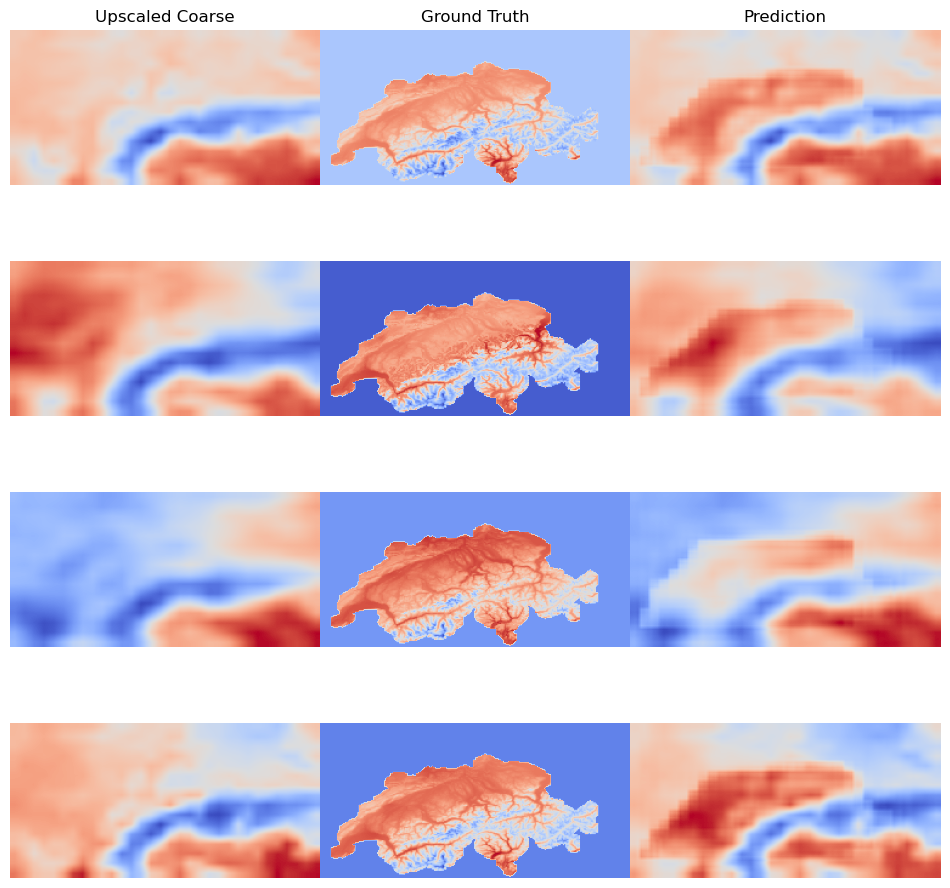

Train :: Epoch: 4:   0%|          | 1/317 [00:00<04:50,  1.09it/s]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   1%|          | 2/317 [01:24<4:19:32, 49.44s/it, Loss: 40.2252]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   1%|          | 3/317 [02:50<5:45:27, 66.01s/it, Loss: 33.2461]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   1%|▏         | 4/317 [04:16<6:26:43, 74.13s/it, Loss: 35.3016]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   2%|▏         | 5/317 [05:56<7:13:44, 83.41s/it, Loss: 42.9668]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   2%|▏         | 6/317 [07:33<7:36:57, 88.16s/it, Loss: 36.4918]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   2%|▏         | 7/317 [09:00<7:32:32, 87.59s/it, Loss: 37.1252]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   3%|▎         | 8/317 [10:33<7:39:48, 89.28s/it, Loss: 32.3905]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   3%|▎         | 9/317 [12:11<7:52:07, 91.97s/it, Loss: 30.3693]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   3%|▎         | 10/317 [13:50<8:02:12, 94.24s/it, Loss: 42.8050]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   3%|▎         | 11/317 [15:31<8:10:48, 96.24s/it, Loss: 32.6503]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   4%|▍         | 12/317 [17:01<8:00:28, 94.52s/it, Loss: 45.7279]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   4%|▍         | 13/317 [18:35<7:57:08, 94.17s/it, Loss: 34.2199]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   4%|▍         | 14/317 [20:14<8:03:57, 95.83s/it, Loss: 33.6621]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   5%|▍         | 15/317 [21:56<8:10:34, 97.47s/it, Loss: 37.1835]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   5%|▌         | 16/317 [23:40<8:19:21, 99.54s/it, Loss: 41.6360]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   5%|▌         | 17/317 [25:16<8:12:34, 98.52s/it, Loss: 36.5598]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   6%|▌         | 18/317 [26:49<8:02:29, 96.82s/it, Loss: 45.7406]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   6%|▌         | 19/317 [28:28<8:03:33, 97.36s/it, Loss: 37.0740]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   6%|▋         | 20/317 [30:09<8:08:02, 98.60s/it, Loss: 35.0211]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   7%|▋         | 21/317 [31:53<8:15:01, 100.34s/it, Loss: 38.3323]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   7%|▋         | 22/317 [33:32<8:10:56, 99.85s/it, Loss: 38.6540] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   7%|▋         | 23/317 [35:06<8:00:23, 98.04s/it, Loss: 46.6906]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   8%|▊         | 24/317 [36:48<8:05:20, 99.39s/it, Loss: 39.7582]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   8%|▊         | 25/317 [38:34<8:12:29, 101.20s/it, Loss: 44.1957]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   8%|▊         | 26/317 [40:15<8:10:25, 101.12s/it, Loss: 35.0892]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   9%|▊         | 27/317 [41:51<8:00:57, 99.51s/it, Loss: 28.9632] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   9%|▉         | 28/317 [43:24<7:49:48, 97.54s/it, Loss: 42.3854]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   9%|▉         | 29/317 [45:06<7:54:54, 98.94s/it, Loss: 26.7687]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:   9%|▉         | 30/317 [46:47<7:57:05, 99.74s/it, Loss: 31.0287]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  10%|▉         | 31/317 [48:27<7:54:39, 99.58s/it, Loss: 35.3335]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  10%|█         | 32/317 [50:06<7:52:59, 99.58s/it, Loss: 32.0329]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  10%|█         | 33/317 [51:41<7:45:18, 98.31s/it, Loss: 37.7537]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  11%|█         | 34/317 [53:17<7:40:23, 97.61s/it, Loss: 33.4841]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  11%|█         | 35/317 [54:58<7:42:29, 98.40s/it, Loss: 36.7492]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  11%|█▏        | 36/317 [56:34<7:38:06, 97.82s/it, Loss: 35.8044]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  12%|█▏        | 37/317 [57:58<7:17:08, 93.67s/it, Loss: 38.2448]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  12%|█▏        | 38/317 [59:17<6:55:12, 89.29s/it, Loss: 31.1612]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  12%|█▏        | 39/317 [1:00:34<6:36:25, 85.56s/it, Loss: 44.3088]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  13%|█▎        | 40/317 [1:01:52<6:25:04, 83.41s/it, Loss: 43.3963]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  13%|█▎        | 41/317 [1:03:15<6:22:26, 83.14s/it, Loss: 44.3093]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  13%|█▎        | 42/317 [1:04:37<6:19:38, 82.83s/it, Loss: 32.8192]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  14%|█▎        | 43/317 [1:05:54<6:10:29, 81.13s/it, Loss: 32.1720]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  14%|█▍        | 44/317 [1:07:11<6:02:52, 79.75s/it, Loss: 31.8760]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  14%|█▍        | 45/317 [1:08:33<6:05:23, 80.60s/it, Loss: 42.9169]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  15%|█▍        | 46/317 [1:09:57<6:08:40, 81.63s/it, Loss: 45.9375]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  15%|█▍        | 47/317 [1:11:22<6:10:51, 82.41s/it, Loss: 38.7153]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  15%|█▌        | 48/317 [1:12:42<6:06:54, 81.84s/it, Loss: 28.0783]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  15%|█▌        | 49/317 [1:14:04<6:05:27, 81.82s/it, Loss: 36.8122]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  16%|█▌        | 50/317 [1:15:24<6:02:02, 81.36s/it, Loss: 33.0240]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  16%|█▌        | 51/317 [1:16:47<6:02:53, 81.85s/it, Loss: 35.7112]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  16%|█▋        | 52/317 [1:18:16<6:10:20, 83.85s/it, Loss: 37.2063]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  17%|█▋        | 53/317 [1:19:44<6:14:14, 85.06s/it, Loss: 40.2036]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  17%|█▋        | 54/317 [1:21:06<6:08:56, 84.17s/it, Loss: 46.5230]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  17%|█▋        | 55/317 [1:22:29<6:07:03, 84.06s/it, Loss: 36.9982]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  18%|█▊        | 56/317 [1:23:58<6:11:21, 85.37s/it, Loss: 34.0463]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  18%|█▊        | 57/317 [1:25:30<6:19:02, 87.47s/it, Loss: 38.2930]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  18%|█▊        | 58/317 [1:26:56<6:14:50, 86.83s/it, Loss: 38.1061]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  19%|█▊        | 59/317 [1:28:18<6:08:15, 85.64s/it, Loss: 39.2344]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  19%|█▉        | 60/317 [1:29:45<6:07:25, 85.78s/it, Loss: 39.4842]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  19%|█▉        | 61/317 [1:31:19<6:16:49, 88.32s/it, Loss: 39.3666]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  20%|█▉        | 62/317 [1:32:55<6:25:03, 90.60s/it, Loss: 44.0223]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  20%|█▉        | 63/317 [1:34:34<6:34:54, 93.29s/it, Loss: 35.2357]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  20%|██        | 64/317 [1:36:05<6:29:32, 92.38s/it, Loss: 42.8371]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  21%|██        | 65/317 [1:37:40<6:31:17, 93.17s/it, Loss: 36.4497]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  21%|██        | 66/317 [1:39:20<6:38:20, 95.22s/it, Loss: 30.5335]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  21%|██        | 67/317 [1:40:59<6:41:39, 96.40s/it, Loss: 36.0835]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  21%|██▏       | 68/317 [1:42:38<6:43:20, 97.19s/it, Loss: 45.1974]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  22%|██▏       | 69/317 [1:44:16<6:42:41, 97.43s/it, Loss: 41.7737]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  22%|██▏       | 70/317 [1:45:46<6:32:13, 95.28s/it, Loss: 25.3586]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  22%|██▏       | 71/317 [1:47:29<6:40:10, 97.61s/it, Loss: 45.0131]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  23%|██▎       | 72/317 [1:49:13<6:46:37, 99.58s/it, Loss: 37.4396]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  23%|██▎       | 73/317 [1:50:56<6:48:43, 100.50s/it, Loss: 23.7773]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  23%|██▎       | 74/317 [1:52:34<6:43:37, 99.66s/it, Loss: 35.9944] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  24%|██▎       | 75/317 [1:54:12<6:40:07, 99.20s/it, Loss: 35.2065]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  24%|██▍       | 76/317 [1:55:53<6:40:43, 99.77s/it, Loss: 40.3928]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  24%|██▍       | 77/317 [1:57:38<6:45:06, 101.28s/it, Loss: 40.3141]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  25%|██▍       | 78/317 [1:59:19<6:43:29, 101.29s/it, Loss: 33.4075]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  25%|██▍       | 79/317 [2:00:57<6:37:40, 100.25s/it, Loss: 39.7599]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  25%|██▌       | 80/317 [2:02:28<6:25:03, 97.48s/it, Loss: 32.6557] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  26%|██▌       | 81/317 [2:04:08<6:26:56, 98.37s/it, Loss: 35.3218]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  26%|██▌       | 82/317 [2:05:50<6:29:00, 99.32s/it, Loss: 36.1886]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  26%|██▌       | 83/317 [2:07:31<6:29:48, 99.95s/it, Loss: 37.5534]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  26%|██▋       | 84/317 [2:09:08<6:24:59, 99.14s/it, Loss: 38.7951]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  27%|██▋       | 85/317 [2:10:41<6:15:48, 97.19s/it, Loss: 36.6824]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  27%|██▋       | 86/317 [2:12:16<6:11:29, 96.49s/it, Loss: 41.0439]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  27%|██▋       | 87/317 [2:13:59<6:17:17, 98.42s/it, Loss: 45.2597]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  28%|██▊       | 88/317 [2:15:41<6:20:02, 99.57s/it, Loss: 39.1894]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  28%|██▊       | 89/317 [2:17:23<6:20:40, 100.18s/it, Loss: 38.0988]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  28%|██▊       | 90/317 [2:18:58<6:13:13, 98.65s/it, Loss: 40.5659] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  29%|██▊       | 91/317 [2:20:41<6:16:39, 100.00s/it, Loss: 31.6538]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  29%|██▉       | 92/317 [2:22:27<6:21:29, 101.73s/it, Loss: 40.1159]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  29%|██▉       | 93/317 [2:24:19<6:31:37, 104.90s/it, Loss: 41.0729]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  30%|██▉       | 94/317 [2:26:00<6:25:39, 103.76s/it, Loss: 35.2125]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  30%|██▉       | 95/317 [2:27:36<6:15:42, 101.54s/it, Loss: 34.8486]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  30%|███       | 96/317 [2:29:17<6:13:24, 101.38s/it, Loss: 37.6653]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  31%|███       | 97/317 [2:31:05<6:18:00, 103.09s/it, Loss: 29.0628]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  31%|███       | 98/317 [2:32:51<6:19:30, 103.98s/it, Loss: 44.9093]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  31%|███       | 99/317 [2:34:34<6:17:01, 103.77s/it, Loss: 28.4467]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  32%|███▏      | 100/317 [2:36:08<6:04:30, 100.78s/it, Loss: 32.1019]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  32%|███▏      | 101/317 [2:37:47<6:01:07, 100.31s/it, Loss: 27.9939]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  32%|███▏      | 102/317 [2:39:35<6:07:17, 102.50s/it, Loss: 38.7842]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  32%|███▏      | 103/317 [2:41:17<6:05:14, 102.40s/it, Loss: 34.7364]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  33%|███▎      | 104/317 [2:43:04<6:08:48, 103.89s/it, Loss: 42.8259]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  33%|███▎      | 105/317 [2:44:43<6:02:10, 102.50s/it, Loss: 34.5167]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  33%|███▎      | 106/317 [2:46:22<5:56:22, 101.34s/it, Loss: 26.1659]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  34%|███▍      | 107/317 [2:48:07<5:58:24, 102.40s/it, Loss: 36.6816]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  34%|███▍      | 108/317 [2:49:48<5:55:12, 101.98s/it, Loss: 38.5725]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  34%|███▍      | 109/317 [2:51:34<5:57:53, 103.24s/it, Loss: 35.9113]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  35%|███▍      | 110/317 [2:53:06<5:44:30, 99.86s/it, Loss: 25.4918] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  35%|███▌      | 111/317 [2:54:39<5:35:46, 97.80s/it, Loss: 36.4082]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  35%|███▌      | 112/317 [2:56:17<5:34:21, 97.86s/it, Loss: 40.0590]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  36%|███▌      | 113/317 [2:58:05<5:43:14, 100.95s/it, Loss: 28.6281]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  36%|███▌      | 114/317 [2:59:49<5:44:53, 101.94s/it, Loss: 39.4276]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  36%|███▋      | 115/317 [3:01:27<5:39:05, 100.72s/it, Loss: 36.9236]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  37%|███▋      | 116/317 [3:03:05<5:34:28, 99.85s/it, Loss: 38.1657] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  37%|███▋      | 117/317 [3:04:51<5:38:30, 101.55s/it, Loss: 49.5500]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  37%|███▋      | 118/317 [3:06:35<5:39:49, 102.46s/it, Loss: 43.4496]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  38%|███▊      | 119/317 [3:08:20<5:40:28, 103.17s/it, Loss: 29.1174]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  38%|███▊      | 120/317 [3:09:55<5:30:38, 100.70s/it, Loss: 28.2305]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  38%|███▊      | 121/317 [3:11:37<5:29:58, 101.01s/it, Loss: 34.6948]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  38%|███▊      | 122/317 [3:13:22<5:32:01, 102.16s/it, Loss: 40.2637]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  39%|███▉      | 123/317 [3:15:06<5:32:37, 102.87s/it, Loss: 48.2175]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  39%|███▉      | 124/317 [3:16:46<5:27:54, 101.94s/it, Loss: 30.7803]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  39%|███▉      | 125/317 [3:18:24<5:22:37, 100.82s/it, Loss: 34.4470]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  40%|███▉      | 126/317 [3:19:56<5:12:45, 98.25s/it, Loss: 29.1783] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  40%|████      | 127/317 [3:21:33<5:10:03, 97.91s/it, Loss: 36.9511]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  40%|████      | 128/317 [3:23:14<5:11:00, 98.73s/it, Loss: 38.2326]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  41%|████      | 129/317 [3:25:01<5:16:44, 101.09s/it, Loss: 44.6740]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  41%|████      | 130/317 [3:26:41<5:14:09, 100.80s/it, Loss: 39.8302]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  41%|████▏     | 131/317 [3:28:12<5:03:09, 97.79s/it, Loss: 33.2674] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  42%|████▏     | 132/317 [3:29:45<4:57:06, 96.36s/it, Loss: 39.8142]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  42%|████▏     | 133/317 [3:31:29<5:02:32, 98.66s/it, Loss: 33.5483]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  42%|████▏     | 134/317 [3:33:08<5:01:58, 99.01s/it, Loss: 31.0158]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  43%|████▎     | 135/317 [3:34:50<5:02:56, 99.87s/it, Loss: 35.1999]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  43%|████▎     | 136/317 [3:36:23<4:54:50, 97.74s/it, Loss: 38.9909]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  43%|████▎     | 137/317 [3:38:00<4:52:08, 97.38s/it, Loss: 37.1887]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  44%|████▎     | 138/317 [3:39:43<4:55:40, 99.11s/it, Loss: 33.2895]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  44%|████▍     | 139/317 [3:41:24<4:55:41, 99.67s/it, Loss: 40.8229]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  44%|████▍     | 140/317 [3:42:59<4:50:01, 98.31s/it, Loss: 30.5810]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  44%|████▍     | 141/317 [3:44:33<4:44:15, 96.91s/it, Loss: 28.5044]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  45%|████▍     | 142/317 [3:46:05<4:38:51, 95.61s/it, Loss: 34.8508]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  45%|████▌     | 143/317 [3:47:42<4:38:23, 96.00s/it, Loss: 34.2361]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  45%|████▌     | 144/317 [3:49:21<4:39:09, 96.82s/it, Loss: 26.6532]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  46%|████▌     | 145/317 [3:51:05<4:43:32, 98.91s/it, Loss: 29.6090]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  46%|████▌     | 146/317 [3:52:33<4:33:08, 95.84s/it, Loss: 38.3125]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  46%|████▋     | 147/317 [3:54:07<4:29:49, 95.23s/it, Loss: 34.5752]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  47%|████▋     | 148/317 [3:55:47<4:31:54, 96.53s/it, Loss: 40.4255]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  47%|████▋     | 149/317 [3:57:31<4:36:54, 98.90s/it, Loss: 43.2907]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  47%|████▋     | 150/317 [3:59:08<4:34:04, 98.47s/it, Loss: 36.8169]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  48%|████▊     | 151/317 [4:00:52<4:36:31, 99.95s/it, Loss: 33.0803]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  48%|████▊     | 152/317 [4:02:24<4:28:22, 97.59s/it, Loss: 29.1916]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  48%|████▊     | 153/317 [4:04:08<4:32:06, 99.55s/it, Loss: 42.1463]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  49%|████▊     | 154/317 [4:05:49<4:31:33, 99.96s/it, Loss: 36.5664]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  49%|████▉     | 155/317 [4:07:33<4:33:00, 101.12s/it, Loss: 30.5274]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  49%|████▉     | 156/317 [4:09:06<4:24:54, 98.73s/it, Loss: 36.4692] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  50%|████▉     | 157/317 [4:10:38<4:18:00, 96.75s/it, Loss: 22.9602]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  50%|████▉     | 158/317 [4:12:11<4:13:20, 95.60s/it, Loss: 38.1582]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  50%|█████     | 159/317 [4:13:52<4:16:12, 97.29s/it, Loss: 36.8774]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  50%|█████     | 160/317 [4:15:36<4:19:39, 99.24s/it, Loss: 37.3756]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  51%|█████     | 161/317 [4:17:13<4:16:04, 98.49s/it, Loss: 34.8455]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  51%|█████     | 162/317 [4:18:39<4:04:32, 94.66s/it, Loss: 42.9410]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  51%|█████▏    | 163/317 [4:20:09<3:59:28, 93.30s/it, Loss: 34.0046]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  52%|█████▏    | 164/317 [4:21:43<3:58:50, 93.66s/it, Loss: 34.1839]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  52%|█████▏    | 165/317 [4:23:19<3:58:42, 94.22s/it, Loss: 32.8631]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  52%|█████▏    | 166/317 [4:24:56<3:59:41, 95.24s/it, Loss: 34.6257]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  53%|█████▎    | 167/317 [4:26:24<3:52:31, 93.01s/it, Loss: 29.3892]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  53%|█████▎    | 168/317 [4:27:51<3:46:17, 91.13s/it, Loss: 36.5772]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  53%|█████▎    | 169/317 [4:29:26<3:47:33, 92.25s/it, Loss: 37.7262]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  54%|█████▎    | 170/317 [4:31:03<3:49:52, 93.82s/it, Loss: 46.3836]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  54%|█████▍    | 171/317 [4:32:37<3:47:56, 93.68s/it, Loss: 36.6549]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  54%|█████▍    | 172/317 [4:34:08<3:44:34, 92.93s/it, Loss: 30.8359]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  55%|█████▍    | 173/317 [4:35:40<3:42:47, 92.83s/it, Loss: 46.9499]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  55%|█████▍    | 174/317 [4:37:15<3:42:26, 93.33s/it, Loss: 33.5001]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  55%|█████▌    | 175/317 [4:38:51<3:43:10, 94.30s/it, Loss: 30.8422]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  56%|█████▌    | 176/317 [4:40:28<3:43:34, 95.14s/it, Loss: 35.5440]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  56%|█████▌    | 177/317 [4:42:04<3:42:01, 95.16s/it, Loss: 35.5145]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  56%|█████▌    | 178/317 [4:43:30<3:34:22, 92.53s/it, Loss: 38.0165]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  56%|█████▋    | 179/317 [4:45:02<3:32:34, 92.42s/it, Loss: 35.6049]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  57%|█████▋    | 180/317 [4:46:40<3:34:24, 93.90s/it, Loss: 28.4491]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  57%|█████▋    | 181/317 [4:48:18<3:36:02, 95.31s/it, Loss: 41.7679]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  57%|█████▋    | 182/317 [4:49:56<3:36:10, 96.08s/it, Loss: 39.9996]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  58%|█████▊    | 183/317 [4:51:22<3:27:34, 92.95s/it, Loss: 41.5117]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  58%|█████▊    | 184/317 [4:52:51<3:23:36, 91.85s/it, Loss: 31.6480]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  58%|█████▊    | 185/317 [4:54:29<3:26:03, 93.66s/it, Loss: 40.7908]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  59%|█████▊    | 186/317 [4:56:05<3:25:51, 94.29s/it, Loss: 36.2335]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  59%|█████▉    | 187/317 [4:57:36<3:22:41, 93.55s/it, Loss: 29.8688]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  59%|█████▉    | 188/317 [4:59:05<3:17:39, 91.94s/it, Loss: 25.6322]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  60%|█████▉    | 189/317 [5:00:38<3:16:58, 92.33s/it, Loss: 40.1009]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  60%|█████▉    | 190/317 [5:02:08<3:13:46, 91.54s/it, Loss: 35.4669]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  60%|██████    | 191/317 [5:03:40<3:12:44, 91.78s/it, Loss: 31.4664]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  61%|██████    | 192/317 [5:05:14<3:12:24, 92.36s/it, Loss: 36.5307]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  61%|██████    | 193/317 [5:06:48<3:12:15, 93.03s/it, Loss: 29.4336]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  61%|██████    | 194/317 [5:08:13<3:05:42, 90.59s/it, Loss: 43.8426]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  62%|██████▏   | 195/317 [5:09:51<3:08:49, 92.87s/it, Loss: 41.0308]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  62%|██████▏   | 196/317 [5:11:29<3:10:20, 94.39s/it, Loss: 40.3949]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  62%|██████▏   | 197/317 [5:13:07<3:10:54, 95.45s/it, Loss: 33.0901]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  62%|██████▏   | 198/317 [5:14:40<3:07:38, 94.61s/it, Loss: 32.3363]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  63%|██████▎   | 199/317 [5:16:10<3:03:25, 93.27s/it, Loss: 34.6056]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  63%|██████▎   | 200/317 [5:17:44<3:02:24, 93.54s/it, Loss: 33.0126]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  63%|██████▎   | 201/317 [5:19:25<3:05:03, 95.72s/it, Loss: 31.7866]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  64%|██████▎   | 202/317 [5:21:02<3:04:08, 96.07s/it, Loss: 34.6777]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  64%|██████▍   | 203/317 [5:22:36<3:01:10, 95.36s/it, Loss: 21.9718]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  64%|██████▍   | 204/317 [5:24:08<2:58:02, 94.53s/it, Loss: 45.6877]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  65%|██████▍   | 205/317 [5:25:41<2:55:22, 93.95s/it, Loss: 42.0620]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  65%|██████▍   | 206/317 [5:27:13<2:52:48, 93.41s/it, Loss: 46.5894]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  65%|██████▌   | 207/317 [5:28:49<2:52:35, 94.14s/it, Loss: 32.2572]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  66%|██████▌   | 208/317 [5:30:24<2:51:30, 94.41s/it, Loss: 30.2475]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  66%|██████▌   | 209/317 [5:31:57<2:49:30, 94.17s/it, Loss: 37.3210]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  66%|██████▌   | 210/317 [5:33:26<2:44:48, 92.42s/it, Loss: 34.4014]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  67%|██████▋   | 211/317 [5:35:01<2:44:41, 93.23s/it, Loss: 44.7750]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  67%|██████▋   | 212/317 [5:36:35<2:43:33, 93.46s/it, Loss: 25.3091]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  67%|██████▋   | 213/317 [5:38:13<2:44:24, 94.85s/it, Loss: 39.1983]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  68%|██████▊   | 214/317 [5:39:43<2:40:09, 93.29s/it, Loss: 38.4009]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  68%|██████▊   | 215/317 [5:41:11<2:36:02, 91.79s/it, Loss: 41.1610]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  68%|██████▊   | 216/317 [5:42:42<2:34:03, 91.52s/it, Loss: 31.2640]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  68%|██████▊   | 217/317 [5:44:16<2:33:49, 92.29s/it, Loss: 31.1243]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  69%|██████▉   | 218/317 [5:45:51<2:33:34, 93.07s/it, Loss: 29.9253]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  69%|██████▉   | 219/317 [5:47:22<2:31:15, 92.61s/it, Loss: 45.4209]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  69%|██████▉   | 220/317 [5:48:52<2:28:12, 91.67s/it, Loss: 41.8002]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  70%|██████▉   | 221/317 [5:50:25<2:27:17, 92.06s/it, Loss: 34.7560]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  70%|███████   | 222/317 [5:52:01<2:27:48, 93.35s/it, Loss: 34.9318]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  70%|███████   | 223/317 [5:53:36<2:26:56, 93.79s/it, Loss: 34.7666]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  71%|███████   | 224/317 [5:55:13<2:27:02, 94.87s/it, Loss: 39.4325]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  71%|███████   | 225/317 [5:56:43<2:23:10, 93.37s/it, Loss: 39.4081]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  71%|███████▏  | 226/317 [5:58:12<2:19:35, 92.04s/it, Loss: 42.8310]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  72%|███████▏  | 227/317 [5:59:43<2:17:30, 91.67s/it, Loss: 27.3184]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  72%|███████▏  | 228/317 [6:01:18<2:17:32, 92.73s/it, Loss: 33.3082]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  72%|███████▏  | 229/317 [6:02:54<2:17:18, 93.61s/it, Loss: 43.6400]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  73%|███████▎  | 230/317 [6:04:24<2:14:08, 92.52s/it, Loss: 35.7859]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  73%|███████▎  | 231/317 [6:05:53<2:11:23, 91.67s/it, Loss: 32.8894]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  73%|███████▎  | 232/317 [6:07:33<2:13:15, 94.07s/it, Loss: 31.7102]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  74%|███████▎  | 233/317 [6:09:22<2:17:57, 98.54s/it, Loss: 34.2758]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  74%|███████▍  | 234/317 [6:11:04<2:17:33, 99.44s/it, Loss: 31.5737]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  74%|███████▍  | 235/317 [6:12:42<2:15:25, 99.10s/it, Loss: 31.5606]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  74%|███████▍  | 236/317 [6:14:20<2:13:27, 98.86s/it, Loss: 26.1947]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  75%|███████▍  | 237/317 [6:15:55<2:10:15, 97.69s/it, Loss: 38.2298]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  75%|███████▌  | 238/317 [6:17:35<2:09:39, 98.48s/it, Loss: 30.4445]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  75%|███████▌  | 239/317 [6:19:18<2:09:43, 99.79s/it, Loss: 35.7051]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  76%|███████▌  | 240/317 [6:21:00<2:08:52, 100.42s/it, Loss: 32.2565]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  76%|███████▌  | 241/317 [6:22:36<2:05:32, 99.11s/it, Loss: 33.9328] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  76%|███████▋  | 242/317 [6:24:08<2:01:03, 96.85s/it, Loss: 42.2179]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  77%|███████▋  | 243/317 [6:25:48<2:00:34, 97.77s/it, Loss: 31.3770]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  77%|███████▋  | 244/317 [6:27:30<2:00:27, 99.00s/it, Loss: 33.7662]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  77%|███████▋  | 245/317 [6:29:15<2:00:58, 100.82s/it, Loss: 26.1479]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  78%|███████▊  | 246/317 [6:30:49<1:56:55, 98.81s/it, Loss: 41.9583] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  78%|███████▊  | 247/317 [6:32:23<1:53:38, 97.40s/it, Loss: 30.5456]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  78%|███████▊  | 248/317 [6:34:02<1:52:29, 97.81s/it, Loss: 34.3587]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  79%|███████▊  | 249/317 [6:35:48<1:53:34, 100.21s/it, Loss: 37.1310]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  79%|███████▉  | 250/317 [6:37:28<1:52:09, 100.44s/it, Loss: 31.6471]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  79%|███████▉  | 251/317 [6:39:06<1:49:31, 99.57s/it, Loss: 25.8886] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  79%|███████▉  | 252/317 [6:40:44<1:47:13, 98.97s/it, Loss: 34.0204]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  80%|███████▉  | 253/317 [6:42:23<1:45:45, 99.15s/it, Loss: 31.4476]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  80%|████████  | 254/317 [6:44:05<1:44:51, 99.86s/it, Loss: 36.5126]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  80%|████████  | 255/317 [6:45:44<1:43:00, 99.69s/it, Loss: 31.9779]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  81%|████████  | 256/317 [6:47:20<1:40:06, 98.46s/it, Loss: 33.7690]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  81%|████████  | 257/317 [6:48:57<1:38:00, 98.01s/it, Loss: 34.5881]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  81%|████████▏ | 258/317 [6:50:30<1:35:00, 96.62s/it, Loss: 46.5790]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  82%|████████▏ | 259/317 [6:52:09<1:34:15, 97.51s/it, Loss: 43.5518]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  82%|████████▏ | 260/317 [6:53:49<1:33:19, 98.23s/it, Loss: 24.7975]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  82%|████████▏ | 261/317 [6:55:29<1:32:01, 98.59s/it, Loss: 31.4262]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  83%|████████▎ | 262/317 [6:57:05<1:29:34, 97.72s/it, Loss: 38.8972]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  83%|████████▎ | 263/317 [6:58:42<1:27:49, 97.59s/it, Loss: 31.7879]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  83%|████████▎ | 264/317 [7:00:23<1:27:05, 98.60s/it, Loss: 31.1762]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  84%|████████▎ | 265/317 [7:02:08<1:27:07, 100.53s/it, Loss: 32.8427]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  84%|████████▍ | 266/317 [7:03:45<1:24:32, 99.46s/it, Loss: 50.9369] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  84%|████████▍ | 267/317 [7:05:22<1:22:20, 98.80s/it, Loss: 34.8214]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  85%|████████▍ | 268/317 [7:07:00<1:20:35, 98.68s/it, Loss: 27.7645]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  85%|████████▍ | 269/317 [7:08:44<1:20:06, 100.14s/it, Loss: 33.9442]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  85%|████████▌ | 270/317 [7:10:24<1:18:31, 100.25s/it, Loss: 29.6789]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  85%|████████▌ | 271/317 [7:12:04<1:16:42, 100.05s/it, Loss: 36.3619]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  86%|████████▌ | 272/317 [7:13:39<1:13:49, 98.42s/it, Loss: 41.9155] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  86%|████████▌ | 273/317 [7:15:14<1:11:34, 97.60s/it, Loss: 22.6250]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  86%|████████▋ | 274/317 [7:16:53<1:10:04, 97.78s/it, Loss: 31.2298]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  87%|████████▋ | 275/317 [7:18:32<1:08:42, 98.16s/it, Loss: 29.6660]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  87%|████████▋ | 276/317 [7:20:15<1:08:07, 99.71s/it, Loss: 40.5438]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  87%|████████▋ | 277/317 [7:21:55<1:06:38, 99.95s/it, Loss: 24.7740]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  88%|████████▊ | 278/317 [7:23:31<1:04:06, 98.64s/it, Loss: 37.0471]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  88%|████████▊ | 279/317 [7:25:11<1:02:42, 99.02s/it, Loss: 41.0392]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  88%|████████▊ | 280/317 [7:26:50<1:01:09, 99.17s/it, Loss: 31.2030]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  89%|████████▊ | 281/317 [7:28:34<1:00:21, 100.59s/it, Loss: 29.2599]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  89%|████████▉ | 282/317 [7:30:12<58:06, 99.62s/it, Loss: 30.8686]   

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  89%|████████▉ | 283/317 [7:31:49<56:03, 98.92s/it, Loss: 39.6823]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  90%|████████▉ | 284/317 [7:33:28<54:23, 98.88s/it, Loss: 30.4243]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  90%|████████▉ | 285/317 [7:35:10<53:14, 99.82s/it, Loss: 30.7382]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  90%|█████████ | 286/317 [7:36:49<51:33, 99.78s/it, Loss: 30.8388]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  91%|█████████ | 287/317 [7:38:26<49:27, 98.91s/it, Loss: 35.1631]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  91%|█████████ | 288/317 [7:40:01<47:12, 97.66s/it, Loss: 31.0278]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  91%|█████████ | 289/317 [7:41:43<46:09, 98.90s/it, Loss: 40.1104]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  91%|█████████▏| 290/317 [7:43:20<44:19, 98.49s/it, Loss: 34.9548]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  92%|█████████▏| 291/317 [7:45:03<43:10, 99.64s/it, Loss: 37.6136]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  92%|█████████▏| 292/317 [7:46:43<41:33, 99.74s/it, Loss: 28.0738]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  92%|█████████▏| 293/317 [7:48:22<39:53, 99.74s/it, Loss: 32.3348]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  93%|█████████▎| 294/317 [7:49:53<37:11, 97.02s/it, Loss: 25.5632]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  93%|█████████▎| 295/317 [7:51:36<36:11, 98.72s/it, Loss: 35.1687]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  93%|█████████▎| 296/317 [7:53:16<34:42, 99.19s/it, Loss: 30.4869]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  94%|█████████▎| 297/317 [7:54:58<33:18, 99.93s/it, Loss: 37.5305]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  94%|█████████▍| 298/317 [7:56:36<31:29, 99.47s/it, Loss: 26.9588]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  94%|█████████▍| 299/317 [7:58:13<29:38, 98.82s/it, Loss: 39.2441]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  95%|█████████▍| 300/317 [7:59:58<28:26, 100.38s/it, Loss: 32.8370]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  95%|█████████▍| 301/317 [8:01:42<27:06, 101.67s/it, Loss: 37.7692]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  95%|█████████▌| 302/317 [8:03:19<25:01, 100.09s/it, Loss: 34.3406]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  96%|█████████▌| 303/317 [8:04:51<22:50, 97.90s/it, Loss: 30.5083] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  96%|█████████▌| 304/317 [8:06:25<20:57, 96.73s/it, Loss: 29.8222]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  96%|█████████▌| 305/317 [8:08:04<19:29, 97.42s/it, Loss: 36.8459]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  97%|█████████▋| 306/317 [8:09:43<17:56, 97.86s/it, Loss: 25.4514]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  97%|█████████▋| 307/317 [8:11:20<16:14, 97.41s/it, Loss: 37.6638]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  97%|█████████▋| 308/317 [8:12:58<14:39, 97.67s/it, Loss: 37.6254]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  97%|█████████▋| 309/317 [8:14:41<13:13, 99.16s/it, Loss: 39.0107]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  98%|█████████▊| 310/317 [8:16:21<11:37, 99.62s/it, Loss: 34.6760]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  98%|█████████▊| 311/317 [8:18:02<09:59, 99.87s/it, Loss: 36.8347]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  98%|█████████▊| 312/317 [8:19:39<08:15, 99.10s/it, Loss: 36.6319]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  99%|█████████▊| 313/317 [8:21:14<06:31, 97.95s/it, Loss: 35.2089]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  99%|█████████▉| 314/317 [8:22:48<04:50, 96.68s/it, Loss: 34.7068]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4:  99%|█████████▉| 315/317 [8:24:27<03:14, 97.39s/it, Loss: 33.0507]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4: 100%|█████████▉| 316/317 [8:26:09<01:38, 98.65s/it, Loss: 37.2277]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 4: 100%|██████████| 317/317 [8:27:53<00:00, 100.40s/it, Loss: 33.3221]

Batch input shape: torch.Size([4, 1, 128, 256])
Batch output shape: torch.Size([4, 1, 128, 256])
Input shape to conv0: torch.Size([4, 128, 128, 256])
Input shape to conv0: torch.Size([4, 128, 128, 256])
Input shape to conv0: torch.Size([4, 128, 128, 256])
Input shape to conv0: torch.Size([4, 128, 64, 128])
Input shape to conv0: torch.Size([4, 256, 64, 128])
Input shape to conv0: torch.Size([4, 256, 64, 128])
Input shape to conv0: torch.Size([4, 256, 32, 64])
Input shape to conv0: torch.Size([4, 512, 32, 64])
Input shape to conv0: torch.Size([4, 512, 32, 64])
Input shape to conv0: torch.Size([4, 512, 16, 32])
Input shape to conv0: torch.Size([4, 1024, 16, 32])
Input shape to conv0: torch.Size([4, 1024, 16, 32])
Input shape to conv0: torch.Size([4, 1024, 16, 32])
x.shape: torch.Size([4, 1024, 16, 32]), skips[-1].shape: torch.Size([4, 1024, 16, 32])
Input shape to conv0: torch.Size([4, 2048, 16, 32])
x.shape: torch.Size([4, 1024, 16, 32]), skips[-1].shape: torch.Size([4, 1024, 16, 32])
In

Train :: Epoch: 4: 100%|██████████| 317/317 [8:28:22<00:00, 96.22s/it, Loss: 35.7184] 


Model saved to ./Model_unet/Test_1/unet_model_epoch_4.pt
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: to

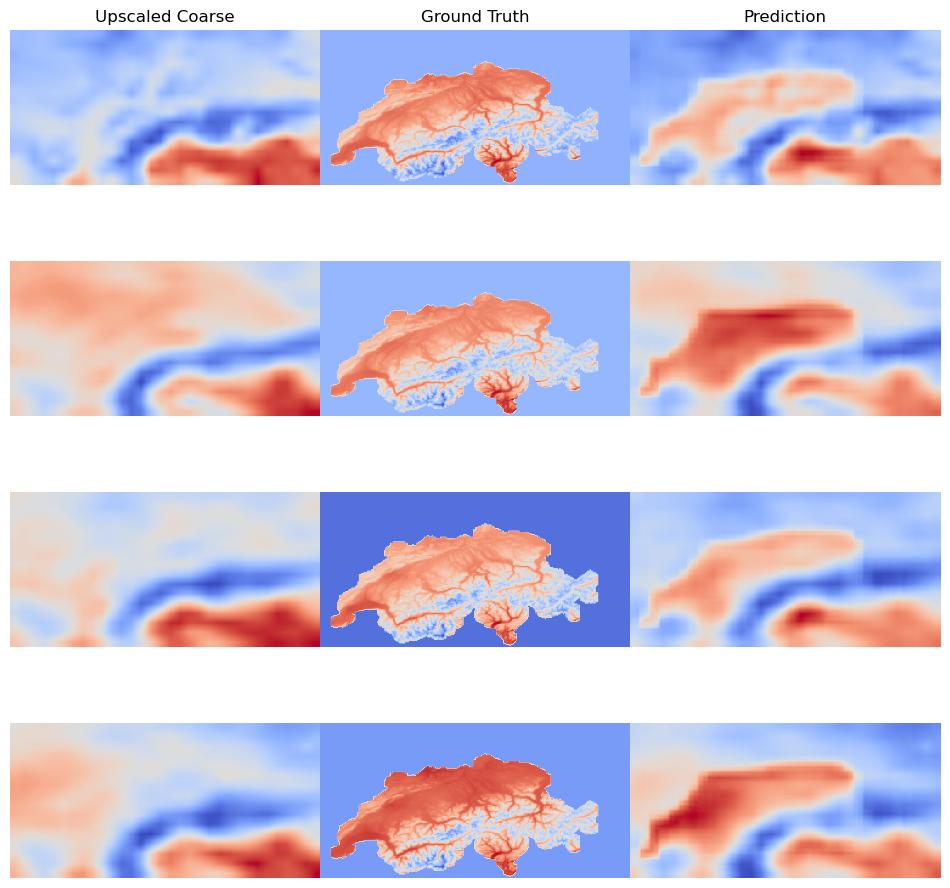

Train :: Epoch: 5:   0%|          | 1/317 [00:00<05:15,  1.00it/s]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   1%|          | 2/317 [01:39<5:05:03, 58.11s/it, Loss: 24.8470]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   1%|          | 3/317 [03:10<6:24:06, 73.40s/it, Loss: 32.5803]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   1%|▏         | 4/317 [04:50<7:17:47, 83.92s/it, Loss: 28.0640]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   2%|▏         | 5/317 [06:32<7:49:01, 90.20s/it, Loss: 31.5900]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   2%|▏         | 6/317 [08:08<7:58:40, 92.35s/it, Loss: 27.1467]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   2%|▏         | 7/317 [09:43<8:00:41, 93.04s/it, Loss: 37.1036]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   3%|▎         | 8/317 [11:23<8:10:37, 95.27s/it, Loss: 33.9013]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   3%|▎         | 9/317 [13:07<8:23:00, 97.99s/it, Loss: 35.0812]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   3%|▎         | 10/317 [14:47<8:25:29, 98.79s/it, Loss: 37.7846]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   3%|▎         | 11/317 [16:22<8:18:06, 97.67s/it, Loss: 29.0088]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   4%|▍         | 12/317 [18:00<8:16:46, 97.73s/it, Loss: 28.1907]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   4%|▍         | 13/317 [19:35<8:11:09, 96.94s/it, Loss: 27.6360]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   4%|▍         | 14/317 [21:16<8:14:43, 97.97s/it, Loss: 37.1044]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   5%|▍         | 15/317 [22:57<8:18:49, 99.11s/it, Loss: 29.0474]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   5%|▌         | 16/317 [24:37<8:18:30, 99.37s/it, Loss: 27.7694]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   5%|▌         | 17/317 [26:19<8:19:34, 99.92s/it, Loss: 37.3941]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   6%|▌         | 18/317 [27:53<8:09:46, 98.28s/it, Loss: 35.4982]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   6%|▌         | 19/317 [29:32<8:09:12, 98.50s/it, Loss: 24.3236]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   6%|▋         | 20/317 [31:14<8:12:22, 99.47s/it, Loss: 39.3212]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   7%|▋         | 21/317 [32:54<8:11:34, 99.64s/it, Loss: 26.4506]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   7%|▋         | 22/317 [34:26<7:58:44, 97.37s/it, Loss: 28.8996]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   7%|▋         | 23/317 [36:02<7:55:40, 97.07s/it, Loss: 25.4288]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   8%|▊         | 24/317 [37:41<7:56:59, 97.68s/it, Loss: 32.2710]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   8%|▊         | 25/317 [39:28<8:08:02, 100.28s/it, Loss: 27.8935]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   8%|▊         | 26/317 [41:12<8:11:56, 101.43s/it, Loss: 32.1415]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   9%|▊         | 27/317 [42:43<7:55:22, 98.35s/it, Loss: 24.1490] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   9%|▉         | 28/317 [44:17<7:47:41, 97.10s/it, Loss: 31.3158]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   9%|▉         | 29/317 [45:52<7:43:15, 96.51s/it, Loss: 29.2129]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:   9%|▉         | 30/317 [47:34<7:49:12, 98.09s/it, Loss: 35.3126]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  10%|▉         | 31/317 [49:16<7:53:35, 99.36s/it, Loss: 26.6822]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  10%|█         | 32/317 [50:52<7:46:19, 98.17s/it, Loss: 27.6982]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  10%|█         | 33/317 [52:28<7:41:15, 97.45s/it, Loss: 23.5088]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  11%|█         | 34/317 [54:00<7:32:03, 95.84s/it, Loss: 31.3296]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  11%|█         | 35/317 [55:39<7:35:16, 96.87s/it, Loss: 48.9676]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  11%|█▏        | 36/317 [57:18<7:37:18, 97.65s/it, Loss: 32.6742]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  12%|█▏        | 37/317 [58:58<7:38:36, 98.27s/it, Loss: 30.5079]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  12%|█▏        | 38/317 [1:00:33<7:32:43, 97.36s/it, Loss: 25.1051]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  12%|█▏        | 39/317 [1:02:07<7:26:00, 96.26s/it, Loss: 36.3270]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  13%|█▎        | 40/317 [1:03:50<7:33:20, 98.20s/it, Loss: 34.5610]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  13%|█▎        | 41/317 [1:05:34<7:40:23, 100.08s/it, Loss: 29.0216]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  13%|█▎        | 42/317 [1:07:12<7:36:07, 99.52s/it, Loss: 29.0379] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  14%|█▎        | 43/317 [1:08:48<7:28:50, 98.29s/it, Loss: 28.5034]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  14%|█▍        | 44/317 [1:10:25<7:25:38, 97.94s/it, Loss: 31.1992]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  14%|█▍        | 45/317 [1:12:08<7:31:05, 99.51s/it, Loss: 29.1616]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  15%|█▍        | 46/317 [1:13:49<7:31:04, 99.87s/it, Loss: 40.7340]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  15%|█▍        | 47/317 [1:15:33<7:34:34, 101.02s/it, Loss: 33.4023]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  15%|█▌        | 48/317 [1:17:06<7:23:18, 98.88s/it, Loss: 23.2297] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  15%|█▌        | 49/317 [1:18:45<7:21:11, 98.77s/it, Loss: 34.2267]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  16%|█▌        | 50/317 [1:20:24<7:19:22, 98.74s/it, Loss: 29.8251]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  16%|█▌        | 51/317 [1:22:06<7:23:10, 99.96s/it, Loss: 29.0494]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  16%|█▋        | 52/317 [1:23:48<7:23:15, 100.36s/it, Loss: 26.7541]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  17%|█▋        | 53/317 [1:25:25<7:17:52, 99.52s/it, Loss: 41.3164] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  17%|█▋        | 54/317 [1:27:01<7:10:45, 98.27s/it, Loss: 24.7979]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  17%|█▋        | 55/317 [1:28:39<7:08:55, 98.23s/it, Loss: 28.8748]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  18%|█▊        | 56/317 [1:30:20<7:11:07, 99.11s/it, Loss: 28.9757]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  18%|█▊        | 57/317 [1:32:02<7:13:43, 100.09s/it, Loss: 39.3157]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  18%|█▊        | 58/317 [1:33:34<7:00:47, 97.48s/it, Loss: 35.3195] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  19%|█▊        | 59/317 [1:35:05<6:51:45, 95.76s/it, Loss: 38.0409]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  19%|█▉        | 60/317 [1:36:38<6:45:49, 94.74s/it, Loss: 37.4758]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  19%|█▉        | 61/317 [1:38:17<6:49:44, 96.03s/it, Loss: 31.6839]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  20%|█▉        | 62/317 [1:39:54<6:50:09, 96.51s/it, Loss: 25.3936]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  20%|█▉        | 63/317 [1:41:29<6:46:28, 96.02s/it, Loss: 24.0284]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  20%|██        | 64/317 [1:43:03<6:41:57, 95.33s/it, Loss: 40.2761]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  21%|██        | 65/317 [1:44:40<6:42:35, 95.86s/it, Loss: 41.8950]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  21%|██        | 66/317 [1:46:19<6:44:19, 96.65s/it, Loss: 29.3916]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  21%|██        | 67/317 [1:47:55<6:41:49, 96.44s/it, Loss: 22.8190]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  21%|██▏       | 68/317 [1:49:37<6:47:23, 98.17s/it, Loss: 27.1694]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  22%|██▏       | 69/317 [1:51:14<6:43:59, 97.74s/it, Loss: 34.9787]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  22%|██▏       | 70/317 [1:52:43<6:31:49, 95.18s/it, Loss: 40.4470]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  22%|██▏       | 71/317 [1:54:23<6:36:25, 96.69s/it, Loss: 38.7722]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  23%|██▎       | 72/317 [1:56:06<6:42:56, 98.68s/it, Loss: 39.4909]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  23%|██▎       | 73/317 [1:57:50<6:47:00, 100.08s/it, Loss: 31.4425]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  23%|██▎       | 74/317 [1:59:22<6:36:23, 97.87s/it, Loss: 31.9750] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  24%|██▎       | 75/317 [2:00:59<6:33:03, 97.45s/it, Loss: 29.9657]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  24%|██▍       | 76/317 [2:02:40<6:35:49, 98.55s/it, Loss: 37.4349]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  24%|██▍       | 77/317 [2:04:21<6:37:36, 99.40s/it, Loss: 36.2973]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  25%|██▍       | 78/317 [2:06:02<6:36:54, 99.64s/it, Loss: 37.1272]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  25%|██▍       | 79/317 [2:07:36<6:29:00, 98.07s/it, Loss: 35.5420]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  25%|██▌       | 80/317 [2:09:08<6:19:56, 96.19s/it, Loss: 32.8961]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  26%|██▌       | 81/317 [2:10:47<6:22:01, 97.13s/it, Loss: 33.4563]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  26%|██▌       | 82/317 [2:12:26<6:22:34, 97.68s/it, Loss: 33.9841]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  26%|██▌       | 83/317 [2:14:07<6:25:04, 98.74s/it, Loss: 23.7534]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  26%|██▋       | 84/317 [2:15:45<6:21:46, 98.31s/it, Loss: 23.8240]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  27%|██▋       | 85/317 [2:17:16<6:12:09, 96.25s/it, Loss: 30.9093]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  27%|██▋       | 86/317 [2:18:47<6:04:57, 94.79s/it, Loss: 27.2611]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  27%|██▋       | 87/317 [2:20:26<6:07:18, 95.82s/it, Loss: 25.9363]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  28%|██▊       | 88/317 [2:22:05<6:10:10, 96.99s/it, Loss: 40.4999]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  28%|██▊       | 89/317 [2:23:42<6:08:43, 97.04s/it, Loss: 29.3369]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  28%|██▊       | 90/317 [2:25:12<5:59:12, 94.95s/it, Loss: 22.2078]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  29%|██▊       | 91/317 [2:26:47<5:56:40, 94.69s/it, Loss: 31.3038]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  29%|██▉       | 92/317 [2:28:25<5:59:00, 95.74s/it, Loss: 29.8920]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  29%|██▉       | 93/317 [2:30:06<6:03:15, 97.30s/it, Loss: 36.1753]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  30%|██▉       | 94/317 [2:31:46<6:04:27, 98.06s/it, Loss: 21.6859]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  30%|██▉       | 95/317 [2:33:17<5:55:45, 96.15s/it, Loss: 30.4788]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  30%|███       | 96/317 [2:34:50<5:49:55, 95.00s/it, Loss: 34.7635]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  31%|███       | 97/317 [2:36:29<5:53:41, 96.46s/it, Loss: 30.8099]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  31%|███       | 98/317 [2:38:06<5:51:53, 96.41s/it, Loss: 32.1873]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  31%|███       | 99/317 [2:39:45<5:53:55, 97.41s/it, Loss: 27.9267]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  32%|███▏      | 100/317 [2:41:22<5:51:08, 97.09s/it, Loss: 32.9579]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  32%|███▏      | 101/317 [2:42:58<5:48:13, 96.73s/it, Loss: 31.0273]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  32%|███▏      | 102/317 [2:44:33<5:45:00, 96.28s/it, Loss: 32.1867]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  32%|███▏      | 103/317 [2:46:15<5:49:19, 97.94s/it, Loss: 29.5708]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  33%|███▎      | 104/317 [2:47:55<5:49:49, 98.54s/it, Loss: 21.5167]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  33%|███▎      | 105/317 [2:49:32<5:46:28, 98.06s/it, Loss: 29.5862]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  33%|███▎      | 106/317 [2:51:02<5:36:30, 95.69s/it, Loss: 23.9786]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  34%|███▍      | 107/317 [2:52:35<5:32:04, 94.88s/it, Loss: 28.8101]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  34%|███▍      | 108/317 [2:54:13<5:34:13, 95.95s/it, Loss: 39.9603]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  34%|███▍      | 109/317 [2:55:54<5:37:27, 97.34s/it, Loss: 31.3118]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  35%|███▍      | 110/317 [2:57:31<5:36:02, 97.40s/it, Loss: 29.6383]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  35%|███▌      | 111/317 [2:59:07<5:32:27, 96.83s/it, Loss: 38.8262]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  35%|███▌      | 112/317 [3:00:37<5:23:35, 94.71s/it, Loss: 28.6312]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  36%|███▌      | 113/317 [3:02:13<5:24:11, 95.35s/it, Loss: 28.8002]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  36%|███▌      | 114/317 [3:03:55<5:28:51, 97.20s/it, Loss: 34.4784]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  36%|███▋      | 115/317 [3:05:39<5:33:40, 99.11s/it, Loss: 27.6671]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  37%|███▋      | 116/317 [3:07:10<5:24:35, 96.89s/it, Loss: 29.2987]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  37%|███▋      | 117/317 [3:08:44<5:19:21, 95.81s/it, Loss: 28.9936]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  37%|███▋      | 118/317 [3:10:17<5:15:39, 95.17s/it, Loss: 30.2925]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  38%|███▊      | 119/317 [3:11:55<5:16:44, 95.98s/it, Loss: 36.5586]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  38%|███▊      | 120/317 [3:13:37<5:21:19, 97.87s/it, Loss: 31.2014]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  38%|███▊      | 121/317 [3:15:13<5:17:47, 97.28s/it, Loss: 32.9620]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  38%|███▊      | 122/317 [3:16:44<5:10:08, 95.43s/it, Loss: 36.9046]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  39%|███▉      | 123/317 [3:18:18<5:06:35, 94.82s/it, Loss: 41.2807]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  39%|███▉      | 124/317 [3:19:55<5:07:06, 95.48s/it, Loss: 42.0807]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  39%|███▉      | 125/317 [3:21:40<5:14:31, 98.29s/it, Loss: 39.2307]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  40%|███▉      | 126/317 [3:23:22<5:16:53, 99.55s/it, Loss: 23.8592]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  40%|████      | 127/317 [3:24:56<5:09:41, 97.80s/it, Loss: 32.4400]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  40%|████      | 128/317 [3:26:30<5:04:49, 96.77s/it, Loss: 34.1090]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  41%|████      | 129/317 [3:28:11<5:06:34, 97.84s/it, Loss: 28.9898]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  41%|████      | 130/317 [3:29:52<5:08:23, 98.95s/it, Loss: 31.5107]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  41%|████▏     | 131/317 [3:31:33<5:08:22, 99.48s/it, Loss: 22.5435]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  42%|████▏     | 132/317 [3:33:04<4:58:38, 96.86s/it, Loss: 34.3666]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  42%|████▏     | 133/317 [3:34:38<4:54:29, 96.03s/it, Loss: 29.4879]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  42%|████▏     | 134/317 [3:36:13<4:52:39, 95.95s/it, Loss: 31.9496]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  43%|████▎     | 135/317 [3:37:54<4:55:42, 97.48s/it, Loss: 32.9168]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  43%|████▎     | 136/317 [3:39:32<4:54:05, 97.49s/it, Loss: 22.8712]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  43%|████▎     | 137/317 [3:41:11<4:54:00, 98.00s/it, Loss: 27.4037]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  44%|████▎     | 138/317 [3:42:43<4:47:16, 96.30s/it, Loss: 28.5990]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  44%|████▍     | 139/317 [3:44:19<4:45:24, 96.21s/it, Loss: 34.4460]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  44%|████▍     | 140/317 [3:46:02<4:49:35, 98.17s/it, Loss: 33.3902]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  44%|████▍     | 141/317 [3:47:46<4:52:32, 99.73s/it, Loss: 37.1459]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  45%|████▍     | 142/317 [3:49:23<4:48:29, 98.91s/it, Loss: 43.1898]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  45%|████▌     | 143/317 [3:50:55<4:41:17, 97.00s/it, Loss: 34.6434]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  45%|████▌     | 144/317 [3:52:26<4:34:24, 95.17s/it, Loss: 23.8833]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  46%|████▌     | 145/317 [3:54:12<4:41:51, 98.32s/it, Loss: 27.3083]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  46%|████▌     | 146/317 [3:55:50<4:40:21, 98.37s/it, Loss: 32.9284]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  46%|████▋     | 147/317 [3:57:28<4:38:07, 98.16s/it, Loss: 29.2728]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  47%|████▋     | 148/317 [3:58:58<4:29:19, 95.62s/it, Loss: 26.4022]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  47%|████▋     | 149/317 [4:00:33<4:27:38, 95.59s/it, Loss: 31.8384]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  47%|████▋     | 150/317 [4:02:09<4:26:22, 95.70s/it, Loss: 27.1447]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  48%|████▊     | 151/317 [4:03:51<4:29:36, 97.45s/it, Loss: 24.8094]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  48%|████▊     | 152/317 [4:05:34<4:32:33, 99.11s/it, Loss: 34.4662]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  48%|████▊     | 153/317 [4:07:12<4:30:11, 98.85s/it, Loss: 26.4239]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  49%|████▊     | 154/317 [4:08:45<4:23:58, 97.17s/it, Loss: 43.0854]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  49%|████▉     | 155/317 [4:10:23<4:23:02, 97.42s/it, Loss: 28.5780]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  49%|████▉     | 156/317 [4:12:00<4:21:19, 97.39s/it, Loss: 41.5372]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  50%|████▉     | 157/317 [4:13:38<4:20:17, 97.61s/it, Loss: 33.1163]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  50%|████▉     | 158/317 [4:15:08<4:12:24, 95.25s/it, Loss: 32.1326]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  50%|█████     | 159/317 [4:16:42<4:09:56, 94.91s/it, Loss: 29.7727]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  50%|█████     | 160/317 [4:18:26<4:14:54, 97.42s/it, Loss: 32.6839]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  51%|█████     | 161/317 [4:20:12<4:20:35, 100.23s/it, Loss: 33.3449]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  51%|█████     | 162/317 [4:21:57<4:21:57, 101.40s/it, Loss: 23.2755]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  51%|█████▏    | 163/317 [4:23:32<4:15:55, 99.71s/it, Loss: 31.3203] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  52%|█████▏    | 164/317 [4:25:11<4:13:18, 99.34s/it, Loss: 24.8371]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  52%|█████▏    | 165/317 [4:26:56<4:16:06, 101.10s/it, Loss: 27.7443]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  52%|█████▏    | 166/317 [4:28:41<4:17:16, 102.23s/it, Loss: 31.9351]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  53%|█████▎    | 167/317 [4:30:27<4:18:36, 103.45s/it, Loss: 27.2836]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  53%|█████▎    | 168/317 [4:32:10<4:16:33, 103.31s/it, Loss: 28.6391]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  53%|█████▎    | 169/317 [4:33:47<4:10:00, 101.36s/it, Loss: 32.3952]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  54%|█████▎    | 170/317 [4:35:30<4:09:19, 101.77s/it, Loss: 24.2099]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  54%|█████▍    | 171/317 [4:37:20<4:13:45, 104.28s/it, Loss: 31.6897]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  54%|█████▍    | 172/317 [4:39:07<4:14:02, 105.12s/it, Loss: 36.5355]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  55%|█████▍    | 173/317 [4:40:48<4:09:32, 103.97s/it, Loss: 35.7104]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  55%|█████▍    | 174/317 [4:42:28<4:04:30, 102.59s/it, Loss: 33.5625]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  55%|█████▌    | 175/317 [4:44:04<3:58:24, 100.74s/it, Loss: 32.1810]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  56%|█████▌    | 176/317 [4:45:49<3:59:56, 102.10s/it, Loss: 40.9359]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  56%|█████▌    | 177/317 [4:47:34<4:00:25, 103.04s/it, Loss: 29.2746]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  56%|█████▌    | 178/317 [4:49:15<3:56:59, 102.30s/it, Loss: 28.1785]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  56%|█████▋    | 179/317 [4:50:53<3:52:18, 101.00s/it, Loss: 27.4362]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  57%|█████▋    | 180/317 [4:52:26<3:44:49, 98.46s/it, Loss: 27.8825] 

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  57%|█████▋    | 181/317 [4:54:02<3:41:55, 97.91s/it, Loss: 28.8986]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  57%|█████▋    | 182/317 [4:55:41<3:40:36, 98.05s/it, Loss: 24.8984]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  58%|█████▊    | 183/317 [4:57:21<3:40:46, 98.85s/it, Loss: 38.3592]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  58%|█████▊    | 184/317 [4:59:00<3:39:10, 98.88s/it, Loss: 27.0689]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  58%|█████▊    | 185/317 [5:00:36<3:35:33, 97.98s/it, Loss: 31.2697]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  59%|█████▊    | 186/317 [5:02:06<3:28:55, 95.69s/it, Loss: 24.2090]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  59%|█████▉    | 187/317 [5:03:37<3:24:13, 94.26s/it, Loss: 27.8379]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  59%|█████▉    | 188/317 [5:05:17<3:26:03, 95.84s/it, Loss: 25.0059]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  60%|█████▉    | 189/317 [5:06:59<3:28:21, 97.67s/it, Loss: 32.4112]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  60%|█████▉    | 190/317 [5:08:39<3:28:02, 98.28s/it, Loss: 26.8361]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  60%|██████    | 191/317 [5:10:13<3:23:55, 97.11s/it, Loss: 33.8350]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  61%|██████    | 192/317 [5:11:44<3:18:34, 95.32s/it, Loss: 32.5359]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  61%|██████    | 193/317 [5:13:22<3:18:32, 96.07s/it, Loss: 29.8762]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  61%|██████    | 194/317 [5:15:01<3:18:46, 96.96s/it, Loss: 41.7979]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  62%|██████▏   | 195/317 [5:16:39<3:18:08, 97.45s/it, Loss: 36.1551]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  62%|██████▏   | 196/317 [5:18:18<3:17:19, 97.85s/it, Loss: 26.5110]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  62%|██████▏   | 197/317 [5:19:53<3:14:02, 97.02s/it, Loss: 28.4317]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  62%|██████▏   | 198/317 [5:21:27<3:10:15, 95.93s/it, Loss: 27.4821]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  63%|██████▎   | 199/317 [5:23:01<3:07:30, 95.34s/it, Loss: 38.1658]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  63%|██████▎   | 200/317 [5:24:37<3:06:40, 95.73s/it, Loss: 24.5856]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  63%|██████▎   | 201/317 [5:26:18<3:08:02, 97.26s/it, Loss: 29.3880]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  64%|██████▎   | 202/317 [5:27:57<3:07:07, 97.63s/it, Loss: 30.1268]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  64%|██████▍   | 203/317 [5:29:32<3:04:10, 96.94s/it, Loss: 41.6136]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  64%|██████▍   | 204/317 [5:31:07<3:01:22, 96.30s/it, Loss: 26.9184]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  65%|██████▍   | 205/317 [5:32:42<2:58:55, 95.85s/it, Loss: 29.1671]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  65%|██████▍   | 206/317 [5:34:15<2:56:09, 95.22s/it, Loss: 33.9080]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  65%|██████▌   | 207/317 [5:35:52<2:55:25, 95.69s/it, Loss: 31.9926]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  66%|██████▌   | 208/317 [5:37:27<2:53:23, 95.45s/it, Loss: 34.3296]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  66%|██████▌   | 209/317 [5:38:58<2:49:25, 94.12s/it, Loss: 36.3426]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  66%|██████▌   | 210/317 [5:40:28<2:45:22, 92.74s/it, Loss: 31.3970]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  67%|██████▋   | 211/317 [5:42:01<2:44:17, 93.00s/it, Loss: 27.3696]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  67%|██████▋   | 212/317 [5:43:36<2:43:51, 93.63s/it, Loss: 21.5022]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  67%|██████▋   | 213/317 [5:45:14<2:44:18, 94.79s/it, Loss: 26.6628]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  68%|██████▊   | 214/317 [5:46:45<2:40:55, 93.74s/it, Loss: 32.3047]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  68%|██████▊   | 215/317 [5:48:12<2:35:59, 91.76s/it, Loss: 30.1749]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  68%|██████▊   | 216/317 [5:49:44<2:34:24, 91.73s/it, Loss: 33.7772]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  68%|██████▊   | 217/317 [5:51:22<2:36:08, 93.68s/it, Loss: 22.6614]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  69%|██████▉   | 218/317 [5:52:57<2:35:08, 94.03s/it, Loss: 25.8054]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  69%|██████▉   | 219/317 [5:54:33<2:34:37, 94.67s/it, Loss: 35.3180]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  69%|██████▉   | 220/317 [5:55:59<2:28:50, 92.06s/it, Loss: 32.6424]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  70%|██████▉   | 221/317 [5:57:28<2:25:48, 91.13s/it, Loss: 28.0937]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  70%|███████   | 222/317 [5:58:57<2:23:05, 90.38s/it, Loss: 27.8041]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  70%|███████   | 223/317 [6:00:31<2:23:21, 91.50s/it, Loss: 26.4687]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  71%|███████   | 224/317 [6:02:04<2:22:41, 92.05s/it, Loss: 34.1351]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  71%|███████   | 225/317 [6:03:35<2:20:24, 91.58s/it, Loss: 43.8776]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  71%|███████▏  | 226/317 [6:05:05<2:18:26, 91.28s/it, Loss: 24.7245]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  72%|███████▏  | 227/317 [6:06:46<2:21:12, 94.14s/it, Loss: 33.5362]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  72%|███████▏  | 228/317 [6:08:29<2:23:41, 96.87s/it, Loss: 23.2465]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  72%|███████▏  | 229/317 [6:10:13<2:25:01, 98.88s/it, Loss: 37.5386]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  73%|███████▎  | 230/317 [6:11:48<2:21:44, 97.76s/it, Loss: 24.9737]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  73%|███████▎  | 231/317 [6:13:23<2:19:07, 97.07s/it, Loss: 33.2026]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  73%|███████▎  | 232/317 [6:15:03<2:18:25, 97.71s/it, Loss: 26.3438]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  74%|███████▎  | 233/317 [6:16:46<2:19:17, 99.50s/it, Loss: 26.6001]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  74%|███████▍  | 234/317 [6:18:27<2:18:13, 99.92s/it, Loss: 33.3221]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  74%|███████▍  | 235/317 [6:20:02<2:14:39, 98.53s/it, Loss: 24.7480]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  74%|███████▍  | 236/317 [6:21:36<2:11:10, 97.16s/it, Loss: 32.1451]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  75%|███████▍  | 237/317 [6:23:16<2:10:35, 97.94s/it, Loss: 29.7973]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  75%|███████▌  | 238/317 [6:24:59<2:10:45, 99.31s/it, Loss: 25.1714]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  75%|███████▌  | 239/317 [6:26:40<2:09:57, 99.97s/it, Loss: 34.2345]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  76%|███████▌  | 240/317 [6:28:19<2:07:59, 99.73s/it, Loss: 35.3340]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  76%|███████▌  | 241/317 [6:29:56<2:05:01, 98.70s/it, Loss: 38.5979]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  76%|███████▋  | 242/317 [6:31:30<2:01:53, 97.52s/it, Loss: 26.3081]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  77%|███████▋  | 243/317 [6:33:09<2:00:33, 97.75s/it, Loss: 25.7682]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  77%|███████▋  | 244/317 [6:34:46<1:58:49, 97.66s/it, Loss: 32.4938]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  77%|███████▋  | 245/317 [6:36:22<1:56:38, 97.20s/it, Loss: 24.2837]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  78%|███████▊  | 246/317 [6:37:51<1:52:09, 94.78s/it, Loss: 29.8341]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  78%|███████▊  | 247/317 [6:39:20<1:48:26, 92.95s/it, Loss: 32.2231]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  78%|███████▊  | 248/317 [6:40:57<1:48:07, 94.01s/it, Loss: 34.7027]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  79%|███████▊  | 249/317 [6:42:36<1:48:29, 95.73s/it, Loss: 23.7954]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  79%|███████▉  | 250/317 [6:44:13<1:47:16, 96.07s/it, Loss: 28.3825]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  79%|███████▉  | 251/317 [6:45:48<1:45:05, 95.53s/it, Loss: 27.5223]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  79%|███████▉  | 252/317 [6:47:14<1:40:24, 92.68s/it, Loss: 24.0558]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  80%|███████▉  | 253/317 [6:48:51<1:40:33, 94.27s/it, Loss: 33.3865]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  80%|████████  | 254/317 [6:50:28<1:39:39, 94.91s/it, Loss: 30.4226]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  80%|████████  | 255/317 [6:52:03<1:38:13, 95.06s/it, Loss: 30.8448]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  81%|████████  | 256/317 [6:53:35<1:35:38, 94.07s/it, Loss: 30.9060]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  81%|████████  | 257/317 [6:55:06<1:33:09, 93.16s/it, Loss: 28.2714]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  81%|████████▏ | 258/317 [6:56:37<1:30:47, 92.33s/it, Loss: 26.7777]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  82%|████████▏ | 259/317 [6:58:12<1:30:03, 93.16s/it, Loss: 28.1195]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  82%|████████▏ | 260/317 [6:59:44<1:28:18, 92.96s/it, Loss: 35.9919]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  82%|████████▏ | 261/317 [7:01:20<1:27:39, 93.93s/it, Loss: 22.0627]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  83%|████████▎ | 262/317 [7:02:48<1:24:28, 92.15s/it, Loss: 28.1225]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  83%|████████▎ | 263/317 [7:04:18<1:22:14, 91.38s/it, Loss: 34.0724]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  83%|████████▎ | 264/317 [7:05:52<1:21:26, 92.20s/it, Loss: 33.2455]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  84%|████████▎ | 265/317 [7:07:29<1:21:10, 93.67s/it, Loss: 29.3761]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  84%|████████▍ | 266/317 [7:09:05<1:20:14, 94.40s/it, Loss: 24.9085]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  84%|████████▍ | 267/317 [7:10:39<1:18:36, 94.33s/it, Loss: 23.8225]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  85%|████████▍ | 268/317 [7:12:07<1:15:18, 92.21s/it, Loss: 26.8806]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  85%|████████▍ | 269/317 [7:13:42<1:14:37, 93.28s/it, Loss: 30.6676]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  85%|████████▌ | 270/317 [7:15:20<1:14:03, 94.54s/it, Loss: 21.1268]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  85%|████████▌ | 271/317 [7:16:56<1:12:45, 94.91s/it, Loss: 27.6312]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  86%|████████▌ | 272/317 [7:18:28<1:10:42, 94.27s/it, Loss: 28.5993]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  86%|████████▌ | 273/317 [7:19:56<1:07:43, 92.35s/it, Loss: 23.9844]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  86%|████████▋ | 274/317 [7:21:34<1:07:19, 93.94s/it, Loss: 26.7847]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  87%|████████▋ | 275/317 [7:23:06<1:05:16, 93.24s/it, Loss: 21.6963]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  87%|████████▋ | 276/317 [7:24:41<1:04:11, 93.95s/it, Loss: 34.2494]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  87%|████████▋ | 277/317 [7:26:19<1:03:22, 95.05s/it, Loss: 26.5642]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  88%|████████▊ | 278/317 [7:27:47<1:00:32, 93.14s/it, Loss: 27.1595]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  88%|████████▊ | 279/317 [7:29:15<58:00, 91.58s/it, Loss: 31.9348]  

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  88%|████████▊ | 280/317 [7:30:49<56:48, 92.13s/it, Loss: 30.3185]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  89%|████████▊ | 281/317 [7:32:26<56:09, 93.59s/it, Loss: 31.4889]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  89%|████████▉ | 282/317 [7:33:59<54:27, 93.36s/it, Loss: 23.9489]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  89%|████████▉ | 283/317 [7:35:26<51:53, 91.59s/it, Loss: 28.3203]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  90%|████████▉ | 284/317 [7:36:52<49:23, 89.81s/it, Loss: 22.1608]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  90%|████████▉ | 285/317 [7:38:27<48:46, 91.45s/it, Loss: 26.2328]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  90%|█████████ | 286/317 [7:40:02<47:43, 92.37s/it, Loss: 38.5687]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  91%|█████████ | 287/317 [7:41:36<46:31, 93.05s/it, Loss: 33.1494]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  91%|█████████ | 288/317 [7:43:09<45:00, 93.13s/it, Loss: 32.9997]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  91%|█████████ | 289/317 [7:44:39<42:54, 91.94s/it, Loss: 35.4207]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  91%|█████████▏| 290/317 [7:46:06<40:47, 90.65s/it, Loss: 30.2097]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  92%|█████████▏| 291/317 [7:47:43<40:05, 92.50s/it, Loss: 23.2264]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  92%|█████████▏| 292/317 [7:49:20<39:06, 93.86s/it, Loss: 31.5679]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  92%|█████████▏| 293/317 [7:50:57<37:55, 94.81s/it, Loss: 29.6159]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  93%|█████████▎| 294/317 [7:52:26<35:41, 93.10s/it, Loss: 29.8108]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  93%|█████████▎| 295/317 [7:53:57<33:51, 92.33s/it, Loss: 25.7452]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  93%|█████████▎| 296/317 [7:55:30<32:27, 92.74s/it, Loss: 21.3033]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  94%|█████████▎| 297/317 [7:57:11<31:39, 94.98s/it, Loss: 24.8699]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  94%|█████████▍| 298/317 [7:58:44<29:53, 94.38s/it, Loss: 28.8482]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  94%|█████████▍| 299/317 [8:00:13<27:52, 92.92s/it, Loss: 27.8719]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  95%|█████████▍| 300/317 [8:01:41<25:53, 91.40s/it, Loss: 29.4116]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  95%|█████████▍| 301/317 [8:03:13<24:24, 91.52s/it, Loss: 35.2530]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  95%|█████████▌| 302/317 [8:04:48<23:07, 92.52s/it, Loss: 19.7751]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  96%|█████████▌| 303/317 [8:06:23<21:45, 93.24s/it, Loss: 25.1331]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  96%|█████████▌| 304/317 [8:07:54<20:05, 92.72s/it, Loss: 21.2784]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  96%|█████████▌| 305/317 [8:09:25<18:26, 92.18s/it, Loss: 23.6128]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  97%|█████████▋| 306/317 [8:10:54<16:42, 91.14s/it, Loss: 45.2405]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  97%|█████████▋| 307/317 [8:12:27<15:16, 91.64s/it, Loss: 40.1369]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  97%|█████████▋| 308/317 [8:14:02<13:54, 92.77s/it, Loss: 24.3677]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  97%|█████████▋| 309/317 [8:15:35<12:23, 92.94s/it, Loss: 26.2653]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  98%|█████████▊| 310/317 [8:17:05<10:44, 92.07s/it, Loss: 19.7621]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  98%|█████████▊| 311/317 [8:18:37<09:11, 91.85s/it, Loss: 26.8375]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  98%|█████████▊| 312/317 [8:20:05<07:34, 90.82s/it, Loss: 30.9162]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  99%|█████████▊| 313/317 [8:21:45<06:13, 93.48s/it, Loss: 23.3578]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  99%|█████████▉| 314/317 [8:23:18<04:39, 93.27s/it, Loss: 25.0676]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5:  99%|█████████▉| 315/317 [8:24:49<03:05, 92.63s/it, Loss: 25.5143]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5: 100%|█████████▉| 316/317 [8:26:22<01:32, 92.89s/it, Loss: 34.7823]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 5: 100%|██████████| 317/317 [8:28:00<00:00, 94.29s/it, Loss: 25.5941]

Batch input shape: torch.Size([4, 1, 128, 256])
Batch output shape: torch.Size([4, 1, 128, 256])
Input shape to conv0: torch.Size([4, 128, 128, 256])
Input shape to conv0: torch.Size([4, 128, 128, 256])
Input shape to conv0: torch.Size([4, 128, 128, 256])
Input shape to conv0: torch.Size([4, 128, 64, 128])
Input shape to conv0: torch.Size([4, 256, 64, 128])
Input shape to conv0: torch.Size([4, 256, 64, 128])
Input shape to conv0: torch.Size([4, 256, 32, 64])
Input shape to conv0: torch.Size([4, 512, 32, 64])
Input shape to conv0: torch.Size([4, 512, 32, 64])
Input shape to conv0: torch.Size([4, 512, 16, 32])
Input shape to conv0: torch.Size([4, 1024, 16, 32])
Input shape to conv0: torch.Size([4, 1024, 16, 32])
Input shape to conv0: torch.Size([4, 1024, 16, 32])
x.shape: torch.Size([4, 1024, 16, 32]), skips[-1].shape: torch.Size([4, 1024, 16, 32])
Input shape to conv0: torch.Size([4, 2048, 16, 32])
x.shape: torch.Size([4, 1024, 16, 32]), skips[-1].shape: torch.Size([4, 1024, 16, 32])
In

Train :: Epoch: 5: 100%|██████████| 317/317 [8:28:26<00:00, 96.23s/it, Loss: 30.5483]


Model saved to ./Model_unet/Test_1/unet_model_epoch_5.pt
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: to

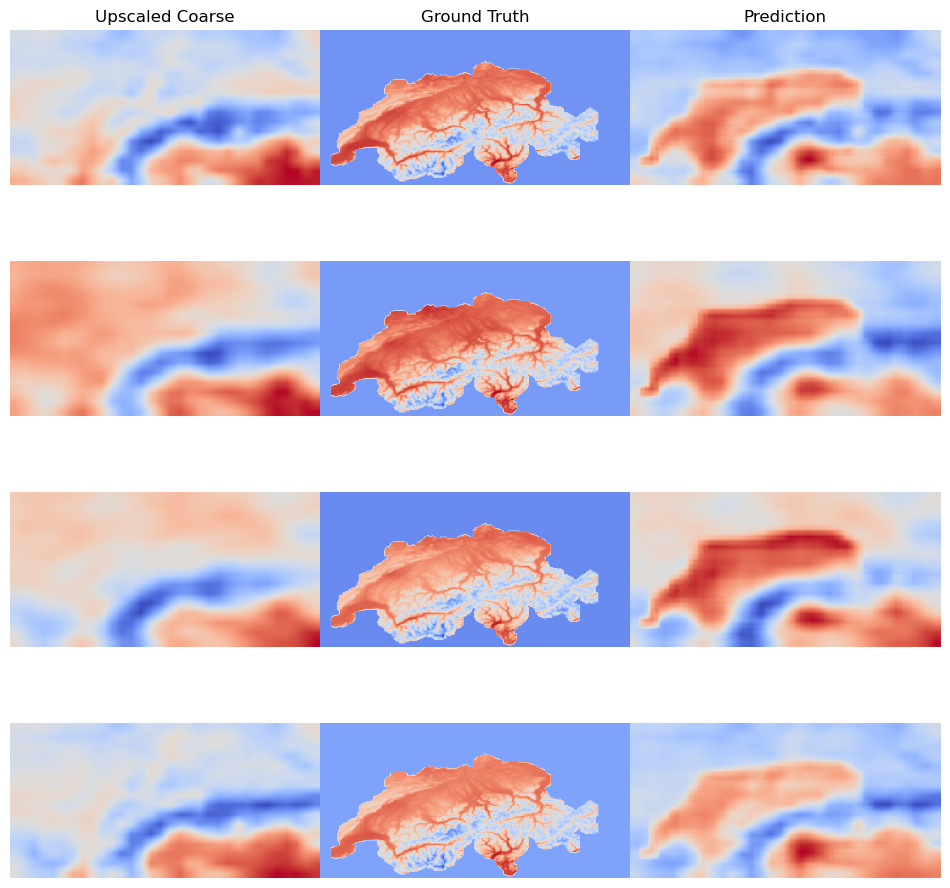

Train :: Epoch: 6:   0%|          | 1/317 [00:01<05:35,  1.06s/it]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   1%|          | 2/317 [01:40<5:07:54, 58.65s/it, Loss: 26.3894]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   1%|          | 3/317 [03:09<6:20:12, 72.65s/it, Loss: 28.0427]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   1%|▏         | 4/317 [04:31<6:37:35, 76.21s/it, Loss: 24.0658]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   2%|▏         | 5/317 [06:02<7:05:36, 81.85s/it, Loss: 34.6978]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   2%|▏         | 6/317 [07:38<7:28:35, 86.55s/it, Loss: 22.3360]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   2%|▏         | 7/317 [09:10<7:36:58, 88.45s/it, Loss: 34.5709]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   3%|▎         | 8/317 [10:36<7:31:29, 87.67s/it, Loss: 34.1281]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   3%|▎         | 9/317 [12:06<7:33:07, 88.27s/it, Loss: 30.8976]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   3%|▎         | 10/317 [13:34<7:31:50, 88.31s/it, Loss: 20.3266]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   3%|▎         | 11/317 [15:08<7:39:21, 90.07s/it, Loss: 25.3322]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   4%|▍         | 12/317 [16:45<7:47:54, 92.05s/it, Loss: 25.1337]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   4%|▍         | 13/317 [18:16<7:45:08, 91.80s/it, Loss: 25.8456]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   4%|▍         | 14/317 [19:41<7:32:54, 89.69s/it, Loss: 26.7437]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   5%|▍         | 15/317 [21:10<7:30:41, 89.54s/it, Loss: 25.2766]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   5%|▌         | 16/317 [22:42<7:32:50, 90.27s/it, Loss: 26.2620]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   5%|▌         | 17/317 [24:19<7:40:54, 92.18s/it, Loss: 29.0023]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   6%|▌         | 18/317 [25:50<7:37:21, 91.78s/it, Loss: 25.3515]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   6%|▌         | 19/317 [27:20<7:34:10, 91.45s/it, Loss: 24.6557]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   6%|▋         | 20/317 [28:51<7:31:55, 91.30s/it, Loss: 31.7888]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   7%|▋         | 21/317 [30:23<7:30:59, 91.42s/it, Loss: 31.9134]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   7%|▋         | 22/317 [31:57<7:33:44, 92.29s/it, Loss: 38.6832]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   7%|▋         | 23/317 [33:31<7:34:50, 92.82s/it, Loss: 32.5241]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   8%|▊         | 24/317 [35:03<7:31:58, 92.55s/it, Loss: 28.2373]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   8%|▊         | 25/317 [36:36<7:31:20, 92.74s/it, Loss: 27.9129]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   8%|▊         | 26/317 [38:11<7:31:49, 93.16s/it, Loss: 28.9198]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   9%|▊         | 27/317 [39:48<7:35:52, 94.32s/it, Loss: 28.4309]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   9%|▉         | 28/317 [41:24<7:37:34, 95.00s/it, Loss: 20.3728]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   9%|▉         | 29/317 [42:56<7:31:19, 94.02s/it, Loss: 29.3219]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:   9%|▉         | 30/317 [44:26<7:24:13, 92.87s/it, Loss: 31.7762]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  10%|▉         | 31/317 [46:01<7:25:39, 93.49s/it, Loss: 24.9365]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  10%|█         | 32/317 [47:35<7:25:19, 93.75s/it, Loss: 24.8545]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  10%|█         | 33/317 [49:17<7:34:08, 95.95s/it, Loss: 22.3872]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  11%|█         | 34/317 [50:47<7:24:32, 94.25s/it, Loss: 25.5403]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  11%|█         | 35/317 [52:15<7:13:56, 92.33s/it, Loss: 26.5239]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  11%|█▏        | 36/317 [53:49<7:14:32, 92.79s/it, Loss: 26.7223]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  12%|█▏        | 37/317 [55:30<7:24:39, 95.28s/it, Loss: 24.8214]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  12%|█▏        | 38/317 [57:03<7:20:56, 94.83s/it, Loss: 24.2947]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  12%|█▏        | 39/317 [58:32<7:10:43, 92.96s/it, Loss: 23.9197]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  13%|█▎        | 40/317 [59:59<7:01:00, 91.19s/it, Loss: 29.5476]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  13%|█▎        | 41/317 [1:01:32<7:02:29, 91.84s/it, Loss: 30.9891]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  13%|█▎        | 42/317 [1:03:03<6:59:18, 91.49s/it, Loss: 34.7234]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  14%|█▎        | 43/317 [1:04:35<6:58:48, 91.71s/it, Loss: 14.3967]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  14%|█▍        | 44/317 [1:06:09<7:00:09, 92.34s/it, Loss: 25.5857]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  14%|█▍        | 45/317 [1:07:42<6:59:08, 92.46s/it, Loss: 34.9259]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  15%|█▍        | 46/317 [1:09:11<6:52:28, 91.32s/it, Loss: 28.3110]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  15%|█▍        | 47/317 [1:10:43<6:52:21, 91.64s/it, Loss: 19.7147]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  15%|█▌        | 48/317 [1:12:19<6:57:02, 93.02s/it, Loss: 25.6907]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  15%|█▌        | 49/317 [1:13:53<6:57:12, 93.41s/it, Loss: 25.5960]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  16%|█▌        | 50/317 [1:15:18<6:44:06, 90.81s/it, Loss: 28.7375]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  16%|█▌        | 51/317 [1:16:48<6:41:43, 90.61s/it, Loss: 22.9856]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  16%|█▋        | 52/317 [1:18:20<6:41:46, 90.97s/it, Loss: 27.9968]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  17%|█▋        | 53/317 [1:19:56<6:46:18, 92.34s/it, Loss: 28.9982]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  17%|█▋        | 54/317 [1:21:28<6:44:57, 92.39s/it, Loss: 25.0263]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  17%|█▋        | 55/317 [1:22:59<6:41:53, 92.04s/it, Loss: 25.5588]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  18%|█▊        | 56/317 [1:24:24<6:30:26, 89.76s/it, Loss: 29.3886]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  18%|█▊        | 57/317 [1:25:56<6:31:55, 90.45s/it, Loss: 28.5126]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  18%|█▊        | 58/317 [1:27:30<6:34:40, 91.43s/it, Loss: 23.7846]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  19%|█▊        | 59/317 [1:29:04<6:36:46, 92.27s/it, Loss: 18.4231]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  19%|█▉        | 60/317 [1:30:38<6:37:45, 92.86s/it, Loss: 21.3256]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  19%|█▉        | 61/317 [1:32:05<6:29:00, 91.17s/it, Loss: 24.7379]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  20%|█▉        | 62/317 [1:33:38<6:29:48, 91.72s/it, Loss: 26.7855]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  20%|█▉        | 63/317 [1:35:10<6:27:49, 91.61s/it, Loss: 21.6621]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  20%|██        | 64/317 [1:36:44<6:29:49, 92.45s/it, Loss: 26.9589]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  21%|██        | 65/317 [1:38:22<6:35:41, 94.21s/it, Loss: 31.0233]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  21%|██        | 66/317 [1:39:54<6:30:59, 93.46s/it, Loss: 28.3819]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  21%|██        | 67/317 [1:41:22<6:22:53, 91.89s/it, Loss: 33.9555]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  21%|██▏       | 68/317 [1:42:57<6:24:36, 92.68s/it, Loss: 29.9812]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  22%|██▏       | 69/317 [1:44:32<6:25:53, 93.36s/it, Loss: 23.0065]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  22%|██▏       | 70/317 [1:46:05<6:24:03, 93.29s/it, Loss: 27.1818]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  22%|██▏       | 71/317 [1:47:37<6:21:32, 93.06s/it, Loss: 36.5095]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  23%|██▎       | 72/317 [1:49:07<6:16:05, 92.10s/it, Loss: 27.1247]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  23%|██▎       | 73/317 [1:50:45<6:21:54, 93.91s/it, Loss: 20.4330]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  23%|██▎       | 74/317 [1:52:19<6:20:09, 93.87s/it, Loss: 33.4364]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  24%|██▎       | 75/317 [1:53:54<6:19:48, 94.17s/it, Loss: 27.4995]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  24%|██▍       | 76/317 [1:55:27<6:16:27, 93.72s/it, Loss: 29.3470]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  24%|██▍       | 77/317 [1:57:02<6:16:26, 94.11s/it, Loss: 33.7850]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  25%|██▍       | 78/317 [1:58:30<6:07:13, 92.19s/it, Loss: 32.5818]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  25%|██▍       | 79/317 [1:59:57<6:00:03, 90.77s/it, Loss: 24.4820]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  25%|██▌       | 80/317 [2:01:28<5:58:46, 90.83s/it, Loss: 25.2926]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  26%|██▌       | 81/317 [2:02:57<5:54:52, 90.22s/it, Loss: 26.6019]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  26%|██▌       | 82/317 [2:04:23<5:48:52, 89.08s/it, Loss: 32.0837]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  26%|██▌       | 83/317 [2:05:49<5:43:06, 87.98s/it, Loss: 24.0779]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  26%|██▋       | 84/317 [2:07:17<5:41:48, 88.02s/it, Loss: 26.5624]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  27%|██▋       | 85/317 [2:08:52<5:49:12, 90.31s/it, Loss: 27.2832]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  27%|██▋       | 86/317 [2:10:21<5:45:59, 89.87s/it, Loss: 36.6332]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  27%|██▋       | 87/317 [2:11:49<5:42:35, 89.37s/it, Loss: 33.4371]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  28%|██▊       | 88/317 [2:13:18<5:40:05, 89.11s/it, Loss: 26.1798]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  28%|██▊       | 89/317 [2:14:43<5:34:12, 87.95s/it, Loss: 23.0703]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  28%|██▊       | 90/317 [2:16:09<5:30:09, 87.27s/it, Loss: 25.3143]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  29%|██▊       | 91/317 [2:17:36<5:28:43, 87.27s/it, Loss: 24.8245]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  29%|██▉       | 92/317 [2:19:01<5:25:04, 86.69s/it, Loss: 21.7535]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  29%|██▉       | 93/317 [2:20:32<5:28:07, 87.89s/it, Loss: 25.1687]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  30%|██▉       | 94/317 [2:22:00<5:26:11, 87.77s/it, Loss: 25.7337]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  30%|██▉       | 95/317 [2:23:29<5:26:36, 88.27s/it, Loss: 28.3027]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  30%|███       | 96/317 [2:24:58<5:26:19, 88.60s/it, Loss: 23.9577]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  31%|███       | 97/317 [2:26:28<5:26:00, 88.91s/it, Loss: 22.1144]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  31%|███       | 98/317 [2:27:59<5:26:34, 89.47s/it, Loss: 33.1239]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  31%|███       | 99/317 [2:29:27<5:23:41, 89.09s/it, Loss: 20.0874]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  32%|███▏      | 100/317 [2:30:56<5:22:06, 89.06s/it, Loss: 22.5846]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  32%|███▏      | 101/317 [2:32:24<5:19:43, 88.81s/it, Loss: 25.0798]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  32%|███▏      | 102/317 [2:33:49<5:13:29, 87.49s/it, Loss: 30.7307]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  32%|███▏      | 103/317 [2:35:14<5:10:05, 86.94s/it, Loss: 31.0340]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  33%|███▎      | 104/317 [2:36:45<5:12:31, 88.03s/it, Loss: 32.7309]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  33%|███▎      | 105/317 [2:38:15<5:13:39, 88.77s/it, Loss: 32.0404]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  33%|███▎      | 106/317 [2:39:41<5:09:04, 87.89s/it, Loss: 21.4601]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  34%|███▍      | 107/317 [2:41:11<5:09:08, 88.33s/it, Loss: 29.3040]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  34%|███▍      | 108/317 [2:42:38<5:06:23, 87.96s/it, Loss: 25.6208]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  34%|███▍      | 109/317 [2:44:06<5:05:15, 88.05s/it, Loss: 20.7347]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  35%|███▍      | 110/317 [2:45:34<5:03:28, 87.96s/it, Loss: 22.4308]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  35%|███▌      | 111/317 [2:47:03<5:03:51, 88.50s/it, Loss: 33.8294]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  35%|███▌      | 112/317 [2:48:32<5:02:15, 88.47s/it, Loss: 25.3018]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  36%|███▌      | 113/317 [2:50:02<5:02:42, 89.03s/it, Loss: 24.8435]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  36%|███▌      | 114/317 [2:51:29<4:59:22, 88.48s/it, Loss: 25.8394]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  36%|███▋      | 115/317 [2:52:57<4:56:58, 88.21s/it, Loss: 26.4911]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  37%|███▋      | 116/317 [2:54:26<4:55:51, 88.32s/it, Loss: 24.4167]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  37%|███▋      | 117/317 [2:55:59<4:59:34, 89.87s/it, Loss: 25.5952]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  37%|███▋      | 118/317 [2:57:26<4:55:24, 89.07s/it, Loss: 23.9246]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  38%|███▊      | 119/317 [2:58:53<4:51:43, 88.40s/it, Loss: 22.1514]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  38%|███▊      | 120/317 [3:00:21<4:50:14, 88.40s/it, Loss: 27.5183]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  38%|███▊      | 121/317 [3:01:51<4:49:43, 88.69s/it, Loss: 28.6917]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  38%|███▊      | 122/317 [3:03:19<4:47:29, 88.46s/it, Loss: 31.8235]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  39%|███▉      | 123/317 [3:04:47<4:46:12, 88.52s/it, Loss: 21.8424]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  39%|███▉      | 124/317 [3:06:16<4:45:05, 88.63s/it, Loss: 26.1888]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  39%|███▉      | 125/317 [3:07:47<4:45:40, 89.27s/it, Loss: 24.9266]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  40%|███▉      | 126/317 [3:09:18<4:45:29, 89.68s/it, Loss: 22.9333]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  40%|████      | 127/317 [3:10:47<4:43:51, 89.64s/it, Loss: 16.4092]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  40%|████      | 128/317 [3:12:18<4:42:58, 89.83s/it, Loss: 25.3905]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  41%|████      | 129/317 [3:13:46<4:40:16, 89.45s/it, Loss: 28.6287]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  41%|████      | 130/317 [3:15:17<4:40:00, 89.84s/it, Loss: 25.9066]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  41%|████▏     | 131/317 [3:16:50<4:41:18, 90.75s/it, Loss: 29.9159]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  42%|████▏     | 132/317 [3:18:17<4:36:28, 89.67s/it, Loss: 33.4550]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  42%|████▏     | 133/317 [3:19:48<4:36:32, 90.18s/it, Loss: 28.3774]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  42%|████▏     | 134/317 [3:21:16<4:33:07, 89.55s/it, Loss: 21.9287]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  43%|████▎     | 135/317 [3:22:43<4:29:10, 88.74s/it, Loss: 24.7406]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  43%|████▎     | 136/317 [3:24:12<4:27:43, 88.75s/it, Loss: 20.2557]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  43%|████▎     | 137/317 [3:25:45<4:29:47, 89.93s/it, Loss: 23.4741]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  44%|████▎     | 138/317 [3:27:10<4:23:55, 88.47s/it, Loss: 24.3743]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  44%|████▍     | 139/317 [3:28:40<4:24:25, 89.13s/it, Loss: 32.7553]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  44%|████▍     | 140/317 [3:30:08<4:21:41, 88.71s/it, Loss: 23.7552]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  44%|████▍     | 141/317 [3:31:39<4:22:06, 89.35s/it, Loss: 24.7400]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  45%|████▍     | 142/317 [3:33:09<4:21:09, 89.54s/it, Loss: 19.6861]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  45%|████▌     | 143/317 [3:34:35<4:17:06, 88.66s/it, Loss: 25.0537]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  45%|████▌     | 144/317 [3:36:04<4:15:14, 88.52s/it, Loss: 24.4053]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  46%|████▌     | 145/317 [3:37:35<4:15:50, 89.25s/it, Loss: 33.1356]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  46%|████▌     | 146/317 [3:39:03<4:13:21, 88.90s/it, Loss: 25.8402]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  46%|████▋     | 147/317 [3:40:32<4:12:08, 88.99s/it, Loss: 26.9013]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  47%|████▋     | 148/317 [3:42:00<4:10:00, 88.76s/it, Loss: 26.2052]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  47%|████▋     | 149/317 [3:43:26<4:05:56, 87.84s/it, Loss: 26.4126]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  47%|████▋     | 150/317 [3:44:53<4:03:48, 87.60s/it, Loss: 24.4559]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  48%|████▊     | 151/317 [3:46:16<3:59:01, 86.40s/it, Loss: 29.9204]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  48%|████▊     | 152/317 [3:47:43<3:57:35, 86.40s/it, Loss: 37.2592]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  48%|████▊     | 153/317 [3:49:14<3:59:37, 87.67s/it, Loss: 26.6658]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  49%|████▊     | 154/317 [3:50:41<3:57:59, 87.60s/it, Loss: 32.3854]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  49%|████▉     | 155/317 [3:52:11<3:58:11, 88.22s/it, Loss: 33.6142]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  49%|████▉     | 156/317 [3:53:38<3:55:58, 87.94s/it, Loss: 24.1131]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  50%|████▉     | 157/317 [3:55:08<3:56:19, 88.62s/it, Loss: 30.6520]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  50%|████▉     | 158/317 [3:56:39<3:56:37, 89.29s/it, Loss: 29.5713]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  50%|█████     | 159/317 [3:58:07<3:54:13, 88.94s/it, Loss: 27.9790]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  50%|█████     | 160/317 [3:59:36<3:52:35, 88.89s/it, Loss: 24.3389]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  51%|█████     | 161/317 [4:01:08<3:53:32, 89.82s/it, Loss: 37.9090]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  51%|█████     | 162/317 [4:02:33<3:48:33, 88.48s/it, Loss: 24.9831]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  51%|█████▏    | 163/317 [4:03:57<3:43:29, 87.07s/it, Loss: 29.7157]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  52%|█████▏    | 164/317 [4:05:28<3:45:11, 88.31s/it, Loss: 19.2294]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  52%|█████▏    | 165/317 [4:07:00<3:46:30, 89.41s/it, Loss: 37.7998]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  52%|█████▏    | 166/317 [4:08:27<3:43:06, 88.65s/it, Loss: 25.0142]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  53%|█████▎    | 167/317 [4:09:50<3:37:40, 87.07s/it, Loss: 31.6340]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  53%|█████▎    | 168/317 [4:11:18<3:36:51, 87.32s/it, Loss: 22.9791]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  53%|█████▎    | 169/317 [4:12:44<3:34:12, 86.84s/it, Loss: 26.7916]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  54%|█████▎    | 170/317 [4:14:11<3:33:11, 87.02s/it, Loss: 28.5161]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  54%|█████▍    | 171/317 [4:15:38<3:31:30, 86.92s/it, Loss: 33.9873]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  54%|█████▍    | 172/317 [4:17:08<3:32:21, 87.87s/it, Loss: 31.0089]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  55%|█████▍    | 173/317 [4:18:42<3:35:02, 89.60s/it, Loss: 28.2951]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  55%|█████▍    | 174/317 [4:20:07<3:30:03, 88.14s/it, Loss: 23.3326]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  55%|█████▌    | 175/317 [4:21:32<3:26:49, 87.39s/it, Loss: 30.3850]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  56%|█████▌    | 176/317 [4:23:00<3:25:32, 87.46s/it, Loss: 20.3901]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  56%|█████▌    | 177/317 [4:24:26<3:23:01, 87.01s/it, Loss: 23.0901]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  56%|█████▌    | 178/317 [4:25:53<3:21:39, 87.05s/it, Loss: 28.3521]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  56%|█████▋    | 179/317 [4:27:20<3:20:09, 87.02s/it, Loss: 30.2408]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  57%|█████▋    | 180/317 [4:28:45<3:17:16, 86.40s/it, Loss: 23.8182]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  57%|█████▋    | 181/317 [4:30:16<3:18:47, 87.70s/it, Loss: 23.6837]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  57%|█████▋    | 182/317 [4:31:44<3:17:59, 87.99s/it, Loss: 31.9977]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  58%|█████▊    | 183/317 [4:33:11<3:15:30, 87.54s/it, Loss: 20.1538]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  58%|█████▊    | 184/317 [4:34:41<3:15:35, 88.24s/it, Loss: 27.5272]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  58%|█████▊    | 185/317 [4:36:13<3:16:48, 89.46s/it, Loss: 26.0904]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  59%|█████▊    | 186/317 [4:37:45<3:17:15, 90.35s/it, Loss: 29.8438]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  59%|█████▉    | 187/317 [4:39:13<3:14:05, 89.58s/it, Loss: 25.8722]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  59%|█████▉    | 188/317 [4:40:43<3:12:29, 89.53s/it, Loss: 20.2478]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  60%|█████▉    | 189/317 [4:42:16<3:13:17, 90.60s/it, Loss: 32.7408]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  60%|█████▉    | 190/317 [4:43:45<3:10:39, 90.07s/it, Loss: 30.5418]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  60%|██████    | 191/317 [4:45:17<3:10:36, 90.77s/it, Loss: 17.8569]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  61%|██████    | 192/317 [4:46:51<3:11:05, 91.72s/it, Loss: 29.0060]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  61%|██████    | 193/317 [4:48:23<3:09:39, 91.77s/it, Loss: 24.1274]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  61%|██████    | 194/317 [4:49:51<3:06:08, 90.80s/it, Loss: 33.5073]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  62%|██████▏   | 195/317 [4:51:21<3:03:45, 90.38s/it, Loss: 28.9079]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  62%|██████▏   | 196/317 [4:52:52<3:02:57, 90.72s/it, Loss: 30.3326]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  62%|██████▏   | 197/317 [4:54:21<3:00:33, 90.28s/it, Loss: 23.6420]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  62%|██████▏   | 198/317 [4:55:49<2:57:42, 89.60s/it, Loss: 26.5631]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  63%|██████▎   | 199/317 [4:57:19<2:55:59, 89.48s/it, Loss: 22.2070]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  63%|██████▎   | 200/317 [4:58:46<2:53:12, 88.83s/it, Loss: 28.8285]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  63%|██████▎   | 201/317 [5:00:17<2:53:00, 89.48s/it, Loss: 19.8288]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  64%|██████▎   | 202/317 [5:01:48<2:52:35, 90.05s/it, Loss: 21.9461]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  64%|██████▍   | 203/317 [5:03:17<2:50:33, 89.77s/it, Loss: 25.7248]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  64%|██████▍   | 204/317 [5:04:45<2:47:40, 89.03s/it, Loss: 21.1785]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  65%|██████▍   | 205/317 [5:06:17<2:47:43, 89.85s/it, Loss: 26.7769]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  65%|██████▍   | 206/317 [5:07:42<2:43:52, 88.58s/it, Loss: 26.2308]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  65%|██████▌   | 207/317 [5:09:11<2:42:31, 88.65s/it, Loss: 22.0236]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  66%|██████▌   | 208/317 [5:10:42<2:42:06, 89.23s/it, Loss: 24.2245]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  66%|██████▌   | 209/317 [5:12:14<2:42:33, 90.31s/it, Loss: 20.7614]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  66%|██████▌   | 210/317 [5:13:47<2:42:08, 90.92s/it, Loss: 18.7894]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  67%|██████▋   | 211/317 [5:15:12<2:37:25, 89.11s/it, Loss: 22.1620]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  67%|██████▋   | 212/317 [5:16:38<2:34:20, 88.19s/it, Loss: 26.9529]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  67%|██████▋   | 213/317 [5:18:09<2:34:42, 89.26s/it, Loss: 18.6330]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  68%|██████▊   | 214/317 [5:19:37<2:32:21, 88.76s/it, Loss: 28.9995]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  68%|██████▊   | 215/317 [5:21:02<2:29:02, 87.67s/it, Loss: 23.6144]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  68%|██████▊   | 216/317 [5:22:34<2:29:34, 88.85s/it, Loss: 22.9862]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  68%|██████▊   | 217/317 [5:24:04<2:28:48, 89.29s/it, Loss: 20.8261]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  69%|██████▉   | 218/317 [5:25:32<2:26:29, 88.78s/it, Loss: 24.6852]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  69%|██████▉   | 219/317 [5:27:02<2:25:54, 89.33s/it, Loss: 21.7829]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  69%|██████▉   | 220/317 [5:28:31<2:24:20, 89.29s/it, Loss: 25.4280]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  70%|██████▉   | 221/317 [5:30:01<2:23:08, 89.46s/it, Loss: 20.3086]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  70%|███████   | 222/317 [5:31:32<2:22:21, 89.91s/it, Loss: 29.9850]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  70%|███████   | 223/317 [5:33:02<2:20:33, 89.71s/it, Loss: 23.6184]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  71%|███████   | 224/317 [5:34:32<2:19:27, 89.97s/it, Loss: 29.3893]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  71%|███████   | 225/317 [5:36:00<2:17:06, 89.42s/it, Loss: 30.0986]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  71%|███████▏  | 226/317 [5:37:27<2:14:35, 88.75s/it, Loss: 22.4575]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  72%|███████▏  | 227/317 [5:38:56<2:13:13, 88.82s/it, Loss: 32.1741]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  72%|███████▏  | 228/317 [5:40:25<2:11:42, 88.79s/it, Loss: 32.2007]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  72%|███████▏  | 229/317 [5:41:58<2:12:06, 90.07s/it, Loss: 19.6923]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  73%|███████▎  | 230/317 [5:43:27<2:10:14, 89.82s/it, Loss: 26.4532]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  73%|███████▎  | 231/317 [5:44:53<2:06:44, 88.43s/it, Loss: 25.3819]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  73%|███████▎  | 232/317 [5:46:23<2:06:17, 89.14s/it, Loss: 25.2449]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  74%|███████▎  | 233/317 [5:47:49<2:03:24, 88.14s/it, Loss: 24.3694]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  74%|███████▍  | 234/317 [5:49:16<2:01:31, 87.85s/it, Loss: 28.2088]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  74%|███████▍  | 235/317 [5:50:45<2:00:32, 88.20s/it, Loss: 24.0813]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  74%|███████▍  | 236/317 [5:52:15<1:59:39, 88.63s/it, Loss: 31.1058]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  75%|███████▍  | 237/317 [5:53:43<1:57:54, 88.43s/it, Loss: 19.5364]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  75%|███████▌  | 238/317 [5:55:10<1:56:02, 88.13s/it, Loss: 26.1645]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  75%|███████▌  | 239/317 [5:56:40<1:55:14, 88.65s/it, Loss: 23.0054]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  76%|███████▌  | 240/317 [5:58:11<1:54:41, 89.37s/it, Loss: 33.7932]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  76%|███████▌  | 241/317 [5:59:44<1:54:18, 90.25s/it, Loss: 23.3515]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  76%|███████▋  | 242/317 [6:01:08<1:50:44, 88.60s/it, Loss: 25.7398]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  77%|███████▋  | 243/317 [6:02:40<1:50:16, 89.42s/it, Loss: 22.6429]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  77%|███████▋  | 244/317 [6:04:07<1:48:03, 88.82s/it, Loss: 18.8240]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  77%|███████▋  | 245/317 [6:05:40<1:48:02, 90.03s/it, Loss: 23.4110]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  78%|███████▊  | 246/317 [6:07:10<1:46:25, 89.93s/it, Loss: 28.9141]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  78%|███████▊  | 247/317 [6:08:38<1:44:15, 89.36s/it, Loss: 22.4503]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  78%|███████▊  | 248/317 [6:10:05<1:42:12, 88.87s/it, Loss: 21.7178]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  79%|███████▊  | 249/317 [6:11:34<1:40:35, 88.75s/it, Loss: 26.2017]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  79%|███████▉  | 250/317 [6:13:01<1:38:27, 88.17s/it, Loss: 27.9381]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  79%|███████▉  | 251/317 [6:14:31<1:37:47, 88.90s/it, Loss: 24.8253]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  79%|███████▉  | 252/317 [6:16:00<1:36:20, 88.93s/it, Loss: 25.5584]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  80%|███████▉  | 253/317 [6:17:33<1:36:08, 90.13s/it, Loss: 24.7720]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  80%|████████  | 254/317 [6:18:59<1:33:11, 88.75s/it, Loss: 21.3883]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  80%|████████  | 255/317 [6:20:25<1:30:54, 87.98s/it, Loss: 15.3336]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  81%|████████  | 256/317 [6:21:58<1:30:50, 89.35s/it, Loss: 22.8826]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  81%|████████  | 257/317 [6:23:30<1:30:09, 90.16s/it, Loss: 24.1883]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  81%|████████▏ | 258/317 [6:24:55<1:27:20, 88.82s/it, Loss: 26.6059]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  82%|████████▏ | 259/317 [6:26:23<1:25:33, 88.51s/it, Loss: 22.2915]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  82%|████████▏ | 260/317 [6:27:49<1:23:27, 87.85s/it, Loss: 26.4993]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  82%|████████▏ | 261/317 [6:29:17<1:21:57, 87.81s/it, Loss: 28.7664]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  83%|████████▎ | 262/317 [6:30:46<1:20:53, 88.24s/it, Loss: 27.7522]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  83%|████████▎ | 263/317 [6:32:12<1:18:49, 87.59s/it, Loss: 27.1695]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  83%|████████▎ | 264/317 [6:33:40<1:17:18, 87.51s/it, Loss: 30.3901]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  84%|████████▎ | 265/317 [6:35:08<1:16:06, 87.81s/it, Loss: 19.7292]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  84%|████████▍ | 266/317 [6:36:38<1:15:02, 88.28s/it, Loss: 26.2899]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

Train :: Epoch: 6:  84%|████████▍ | 267/317 [6:38:06<1:13:29, 88.18s/it, Loss: 25.4718]

Batch input shape: torch.Size([16, 1, 128, 256])
Batch output shape: torch.Size([16, 1, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 128, 256])
Input shape to conv0: torch.Size([16, 128, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 64, 128])
Input shape to conv0: torch.Size([16, 256, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 32, 64])
Input shape to conv0: torch.Size([16, 512, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 1024, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([16, 1024, 16, 32])
Input shape to conv0: torch.Size([16, 2048, 16, 32])
x.shape: torch.Size([16, 1024, 16, 32]), skips[-1].shape: torch.Size([1

In [ ]:
#
scaler = torch.cuda.amp.GradScaler()

# define the optimiser
optimiser = torch.optim.AdamW(unet_model.parameters(), lr=learning_rate)

loss_fn = torch.nn.MSELoss()

# train the model
losses = []
for step in range(num_epochs):
    # model_save
    model_save_path = f"{mdir}/unet_model_epoch_{step}.pt"
    # fig_save
    fig_save_path = f"{rdir}/{step}.png"
    # best modes
    mbest = f"{mdir}/best_unet_model_epoch_{step}.pt"

    epoch_loss = train_step(
        unet_model, loss_fn, dataloader_train, optimiser,
        scaler, step, accum, writer, device=device)
    losses.append(epoch_loss)

    # Save the model weights
    model_save_path = f"{mdir}/unet_model_epoch_{step}.pt"
    torch.save(unet_model.state_dict(), model_save_path)
    print(f"Model saved to {model_save_path}")

    (fig, ax), (base_error, pred_error), predicted_numpy_array = sample_model(
        unet_model, dataloader_test, device=device)
    plt.show()
    fig.savefig(fig_save_path, dpi=300)
    plt.close(fig)


    writer.add_scalar("Error/base", base_error, step)
    writer.add_scalar("Error/pred", pred_error, step)

    # save the model
    if losses[-1] == min(losses):
        torch.save(unet_model.state_dict(), mbest)


In [ ]:
# Evaluate the model on the test set
avg_pred_error, avg_base_error = evaluate_model(unet_model, loss_fn, dataloader_test, device=device)

print(f"\nFinal Evaluation on Test Set:")
print(f"Average Prediction Error (MAE): {avg_pred_error:.4f}")
print(f"Average Baseline Error (Coarse vs. Ground Truth MAE): {avg_base_error:.4f}")